In [ ]:
# ============================================================
# LOW-LIGHT COLOR RESTORATION
# LEVEL 4 - INDUSTRY ORIENTED PROJECT
# CELL 1: ENVIRONMENT CHECK
# ============================================================

import sys
import platform
import torch
import torchvision
import numpy as np
import cv2
import skimage
import PIL

print("=" * 65)
print("       LOW-LIGHT COLOR RESTORATION")
print("       LEVEL 4 PROJECT")
print("=" * 65)

print("\n[ SYSTEM ]")
print("Python       :", sys.version.split()[0])
print("OS           :", platform.system())

print("\n[ LIBRARIES ]")
print("PyTorch      :", torch.__version__)
print("TorchVision  :", torchvision.__version__)
print("NumPy        :", np.__version__)
print("OpenCV       :", cv2.__version__)
print("Scikit-image :", skimage.__version__)
print("Pillow       :", PIL.__version__)

print("\n[ GPU ]")

print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():

    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA:", torch.version.cuda)

    gpu = torch.cuda.get_device_properties(0)

    print(
        "VRAM:",
        round(
            gpu.total_memory / (1024 ** 3),
            2
        ),
        "GB"
    )

    print(
        "GPU count:",
        torch.cuda.device_count()
    )

else:

    print("WARNING: GPU is NOT available.")

print("\n" + "=" * 65)
print("Environment check complete.")
print("=" * 65)

In [ ]:
# ============================================================
# CELL 2: GPU COMPUTATION TEST
# ============================================================

if torch.cuda.is_available():

    device = torch.device("cuda")

    print("Testing GPU...")

    x = torch.randn(
        2048,
        2048,
        device=device
    )

    y = torch.randn(
        2048,
        2048,
        device=device
    )

    z = x @ y

    torch.cuda.synchronize()

    print("✓ GPU computation successful")
    print("✓ Device:", torch.cuda.get_device_name(0))
    print("✓ Result shape:", z.shape)

    print(
        "✓ GPU memory used:",
        round(
            torch.cuda.memory_allocated() /
            (1024 ** 3),
            3
        ),
        "GB"
    )

    del x
    del y
    del z

    torch.cuda.empty_cache()

else:

    print("❌ GPU is not enabled.")
    print("Go to Notebook Settings → Accelerator → GPU")

In [ ]:
# ============================================================
# CELL 3: PROJECT DIRECTORIES
# ============================================================

from pathlib import Path

directories = [
    "models",
    "preprocessing",
    "losses",
    "utils",
    "training",
    "inference",
    "checkpoints",
    "outputs",
    "results"
]

for directory in directories:

    Path(directory).mkdir(
        parents=True,
        exist_ok=True
    )

print("Project directories created:")

for directory in directories:
    print("✓", directory)

In [ ]:
# ============================================================
# CELL 4: INSPECT KAGGLE INPUT DATA
# ============================================================

from pathlib import Path

input_root = Path("/kaggle/input")

print("=" * 65)
print("KAGGLE INPUT DATASETS")
print("=" * 65)

if not input_root.exists():

    print("❌ /kaggle/input does not exist.")

else:

    datasets = list(input_root.iterdir())

    if len(datasets) == 0:

        print(
            "⚠ No dataset attached yet."
        )

    else:

        for item in datasets:

            print(
                "✓",
                item
            )

In [ ]:
import os

for root, dirs, files in os.walk("/kaggle/input"):

    level = root.replace(
        "/kaggle/input",
        ""
    ).count(os.sep)

    indent = "    " * level

    print(
        indent + os.path.basename(root) + "/"
    )

    if level >= 3:
        dirs[:] = []

In [ ]:
import os

for root, dirs, files in os.walk("/kaggle/input"):

    level = root.replace(
        "/kaggle/input",
        ""
    ).count(os.sep)

    indent = "    " * level

    print(indent + os.path.basename(root) + "/")

    if level >= 3:
        dirs[:] = []

In [ ]:
from pathlib import Path

dataset_root = Path(
    "/kaggle/input/datasets/duttadebadri/image-classification"
)

print("=" * 70)
print("IMAGE CLASSIFICATION DATASET")
print("=" * 70)

if dataset_root.exists():

    for path in dataset_root.rglob("*"):

        if path.is_file():

            print(
                path.relative_to(dataset_root)
            )

else:

    print("Dataset path not found.")



In [ ]:
from pathlib import Path

root = Path("/kaggle/input")

print("=" * 70)
print("KAGGLE DATASETS")
print("=" * 70)

for item in root.iterdir():
    print(item)

In [ ]:
from pathlib import Path

root = Path("/kaggle/input")

print("=" * 70)
print("SEARCHING FOR LOL V2 DATASET")
print("=" * 70)

for path in root.rglob("*"):

    if path.is_dir() and "lol" in path.name.lower():
        print("FOUND:", path)

In [ ]:
from pathlib import Path

root = Path("/kaggle/input")

image_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".tif",
    ".tiff",
    ".webp"
}

print("=" * 70)
print("IMAGE DATASET STRUCTURE")
print("=" * 70)

for directory in root.rglob("*"):

    if directory.is_dir():

        images = [
            p for p in directory.iterdir()
            if p.is_file()
            and p.suffix.lower() in image_extensions
        ]

        if images:

            print(
                f"{directory}  -->  {len(images)} images"
            )

In [ ]:
from pathlib import Path
import os

root = Path("/kaggle/input")

print("=" * 75)
print("KAGGLE INPUT DIAGNOSTIC")
print("=" * 75)

print("\nTOP-LEVEL CONTENTS:")
for p in root.iterdir():
    print(
        "DIR " if p.is_dir() else "FILE",
        p
    )

print("\n" + "=" * 75)
print("ALL DATASET DIRECTORIES")
print("=" * 75)

for p in root.rglob("*"):
    if p.is_dir():
        print(p)

print("\n" + "=" * 75)
print("CHECKING FOR LOW-LIGHT RELATED NAMES")
print("=" * 75)

keywords = [
    "lol",
    "low",
    "light",
    "enhance",
    "retinex"
]

found = False

for p in root.rglob("*"):

    name = p.name.lower()

    if any(keyword in name for keyword in keywords):

        print("FOUND:", p)
        found = True

if not found:
    print("❌ No low-light/LOL-related folder found.")
    

In [ ]:
from pathlib import Path

root = Path("/kaggle/input")

print("=" * 70)
print("ATTACHED DATASETS")
print("=" * 70)

for p in root.iterdir():
    print(p)

# Low-Light Color Restoration — Level 4

## Dataset

We use the LOLv2 Real-captured dataset for supervised low-light image restoration.

### Dataset Structure

- Training images: 689 low-light / 689 high-quality images
- Testing images: 100 low-light / 100 high-quality images

### Task

The objective is to learn a mapping:

$$
I_{low} \rightarrow I_{restored}
$$

where the restored image should approximate the corresponding well-exposed image:

$$
I_{restored} \approx I_{high}
$$

### Project Pipeline

1. Dataset verification
2. Image-pair verification
3. Data preprocessing
4. Data augmentation
5. PyTorch Dataset
6. DataLoader
7. Baseline U-Net
8. Training
9. Validation
10. PSNR / SSIM evaluation
11. Color-difference evaluation
12. Ablation experiments
13. Final restoration model
14. Inference
15. Deployment

In [ ]:
# ============================================================
# STEP 8: LOLv2 REAL DATASET VERIFICATION
# ============================================================

from pathlib import Path

# Dataset paths
DATASET_ROOT = Path(
    "/kaggle/input/datasets/alenken/"
    "low-light-image-enhancement-datasets/LOLv2-real"
)

TRAIN_LOW = DATASET_ROOT / "train" / "low"
TRAIN_HIGH = DATASET_ROOT / "train" / "high"

TEST_LOW = DATASET_ROOT / "test" / "low"
TEST_HIGH = DATASET_ROOT / "test" / "high"


# ------------------------------------------------------------
# Check directories
# ------------------------------------------------------------

print("=" * 70)
print("LOLv2 REAL-CAPTURED DATASET VERIFICATION")
print("=" * 70)

paths = {
    "Train Low": TRAIN_LOW,
    "Train High": TRAIN_HIGH,
    "Test Low": TEST_LOW,
    "Test High": TEST_HIGH
}

for name, path in paths.items():

    print(
        f"{name:12} : "
        f"{'✓ EXISTS' if path.exists() else '❌ MISSING'}"
    )


# ------------------------------------------------------------
# Find images
# ------------------------------------------------------------

IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".tif",
    ".tiff",
    ".webp"
}


def get_images(folder):

    return sorted([
        p for p in folder.iterdir()
        if p.is_file()
        and p.suffix.lower() in IMAGE_EXTENSIONS
    ])


train_low_images = get_images(TRAIN_LOW)
train_high_images = get_images(TRAIN_HIGH)

test_low_images = get_images(TEST_LOW)
test_high_images = get_images(TEST_HIGH)


# ------------------------------------------------------------
# Print counts
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("IMAGE COUNTS")
print("=" * 70)

print("Train Low  :", len(train_low_images))
print("Train High :", len(train_high_images))

print("Test Low   :", len(test_low_images))
print("Test High  :", len(test_high_images))


# ------------------------------------------------------------
# Basic count validation
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("PAIR COUNT VALIDATION")
print("=" * 70)

if len(train_low_images) == len(train_high_images):

    print("✓ Training image counts match.")

else:

    print("❌ Training image counts DO NOT match.")


if len(test_low_images) == len(test_high_images):

    print("✓ Testing image counts match.")

else:

    print("❌ Testing image counts DO NOT match.")


# ------------------------------------------------------------
# Show sample filenames
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SAMPLE TRAINING FILES")
print("=" * 70)

print("\nLOW:")

for p in train_low_images[:10]:
    print(" ", p.name)

print("\nHIGH:")

for p in train_high_images[:10]:
    print(" ", p.name)

# 3. Paired Dataset Construction

The LOLv2 Real dataset contains corresponding low-light and normal-light images.

For example:

- `low000001.png` → `normal000001.png`
- `low000002.png` → `normal000002.png`

The dataset loader will pair images using their numerical identifier rather than relying on filesystem ordering.

This prevents incorrect image-target pairing during supervised training.

****

**TRAINING PAIR**

In [ ]:
# ============================================================
# STEP 12: BUILD RELIABLE LOW/HIGH IMAGE PAIRS
# ============================================================

from pathlib import Path
import re

# ------------------------------------------------------------
# Dataset paths
# ------------------------------------------------------------

DATASET_ROOT = Path(
    "/kaggle/input/datasets/alenken/"
    "low-light-image-enhancement-datasets/LOLv2-real"
)

TRAIN_LOW = DATASET_ROOT / "train" / "low"
TRAIN_HIGH = DATASET_ROOT / "train" / "high"

TEST_LOW = DATASET_ROOT / "test" / "low"
TEST_HIGH = DATASET_ROOT / "test" / "high"


# ------------------------------------------------------------
# Function to extract image ID
# ------------------------------------------------------------

def extract_id(filename):
    """
    Extract numerical ID from filenames such as:

        low000001.png
        normal000001.png

    Returns:
        1
        2
        3
        ...
    """

    match = re.search(r"(\d+)", filename)

    if match:
        return int(match.group(1))

    return None


# ------------------------------------------------------------
# Build pairs
# ------------------------------------------------------------

def build_pairs(low_dir, high_dir):

    low_images = {
        extract_id(p.name): p
        for p in low_dir.iterdir()
        if p.is_file()
        and extract_id(p.name) is not None
    }

    high_images = {
        extract_id(p.name): p
        for p in high_dir.iterdir()
        if p.is_file()
        and extract_id(p.name) is not None
    }

    common_ids = sorted(
        set(low_images.keys()) &
        set(high_images.keys())
    )

    pairs = [
        (
            low_images[idx],
            high_images[idx]
        )
        for idx in common_ids
    ]

    return pairs


# ------------------------------------------------------------
# Create training and testing pairs
# ------------------------------------------------------------

train_pairs = build_pairs(
    TRAIN_LOW,
    TRAIN_HIGH
)

test_pairs = build_pairs(
    TEST_LOW,
    TEST_HIGH
)


# ------------------------------------------------------------
# Print results
# ------------------------------------------------------------

print("=" * 70)
print("IMAGE PAIRING RESULTS")
print("=" * 70)

print(f"Training pairs : {len(train_pairs)}")
print(f"Testing pairs  : {len(test_pairs)}")


# ------------------------------------------------------------
# Display first 10 pairs
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FIRST 10 TRAINING PAIRS")
print("=" * 70)

for low_path, high_path in train_pairs[:10]:

    print(
        f"{low_path.name:20}"
        f" <--> "
        f"{high_path.name}"
    )

In [ ]:
# ============================================================
# STEP 13: CHECK IMAGE DIMENSIONS
# ============================================================

from PIL import Image

print("=" * 70)
print("IMAGE DIMENSION CHECK")
print("=" * 70)

for i, (low_path, high_path) in enumerate(train_pairs[:10]):

    low_img = Image.open(low_path)
    high_img = Image.open(high_path)

    print(
        f"\nPair {i + 1}"
    )

    print(
        f"  Low  : {low_path.name:18} "
        f"{low_img.size} "
        f"{low_img.mode}"
    )

    print(
        f"  High : {high_path.name:18} "
        f"{high_img.size} "
        f"{high_img.mode}"
    )

In [ ]:
# ============================================================
# STEP 14: VISUALIZE IMAGE PAIRS
# ============================================================

import matplotlib.pyplot as plt
from PIL import Image

NUM_SAMPLES = 4

fig, axes = plt.subplots(
    NUM_SAMPLES,
    2,
    figsize=(12, 16)
)

for i in range(NUM_SAMPLES):

    low_path, high_path = train_pairs[i]

    low_img = Image.open(low_path).convert("RGB")
    high_img = Image.open(high_path).convert("RGB")

    axes[i, 0].imshow(low_img)
    axes[i, 0].set_title(
        f"Low-Light\n{low_path.name}"
    )
    axes[i, 0].axis("off")

    axes[i, 1].imshow(high_img)
    axes[i, 1].set_title(
        f"Ground Truth\n{high_path.name}"
    )
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

LOLv2
  │
  ├── Low-light image
  │
  └── Normal image
          │
          ▼
   Paired Dataset
          │
          ▼
 Synchronized Augmentation
          │
          ▼
     256 × 256 crop
          │
          ▼
     Tensor [3,H,W]
          │
          ▼
      DataLoader

# 4. PyTorch Dataset and Data Pipeline

We construct a paired image restoration dataset where each low-light image
is associated with its corresponding normal-light ground-truth image.

The preprocessing pipeline uses synchronized transformations so that spatial
operations applied to the low-light image are identically applied to the
ground-truth image.

### Training
- Random paired crop
- Random horizontal flip
- Random vertical flip
- Tensor conversion
- Pixel normalization to [0, 1]

### Validation/Test
- Deterministic preprocessing
- No random augmentation

The LOLv2 test set remains completely untouched during training.

In [ ]:
# ============================================================
# STEP 16: PYTORCH PAIRED DATASET
# ============================================================

import random
import torch
from torch.utils.data import Dataset
from torchvision.transforms import functional as TF
from PIL import Image


class LowLightDataset(Dataset):

    def __init__(
        self,
        pairs,
        image_size=256,
        training=True
    ):
        """
        Args:
            pairs:
                List of (low_path, high_path)

            image_size:
                Size of training crop

            training:
                Whether to use random augmentation
        """

        self.pairs = pairs
        self.image_size = image_size
        self.training = training


    def __len__(self):

        return len(self.pairs)


    def __getitem__(self, index):

        low_path, high_path = self.pairs[index]

        # ----------------------------------------------------
        # Load images
        # ----------------------------------------------------

        low_image = Image.open(low_path).convert("RGB")
        high_image = Image.open(high_path).convert("RGB")


        # ----------------------------------------------------
        # Ensure both images have same dimensions
        # ----------------------------------------------------

        if low_image.size != high_image.size:

            high_image = high_image.resize(
                low_image.size,
                Image.Resampling.BICUBIC
            )


        # ----------------------------------------------------
        # Convert to tensors
        # Range: [0, 1]
        # Shape: [C, H, W]
        # ----------------------------------------------------

        low_image = TF.to_tensor(low_image)
        high_image = TF.to_tensor(high_image)


        # ----------------------------------------------------
        # Training augmentation
        # ----------------------------------------------------

        if self.training:

            _, height, width = low_image.shape


            # -----------------------------------------------
            # Resize if image is smaller than crop
            # -----------------------------------------------

            if (
                height < self.image_size
                or width < self.image_size
            ):

                scale = max(
                    self.image_size / height,
                    self.image_size / width
                )

                new_height = int(height * scale)
                new_width = int(width * scale)

                low_image = TF.resize(
                    low_image,
                    [new_height, new_width]
                )

                high_image = TF.resize(
                    high_image,
                    [new_height, new_width]
                )


            # -----------------------------------------------
            # Synchronized random crop
            # -----------------------------------------------

            _, height, width = low_image.shape

            top = random.randint(
                0,
                height - self.image_size
            )

            left = random.randint(
                0,
                width - self.image_size
            )

            low_image = TF.crop(
                low_image,
                top,
                left,
                self.image_size,
                self.image_size
            )

            high_image = TF.crop(
                high_image,
                top,
                left,
                self.image_size,
                self.image_size
            )


            # -----------------------------------------------
            # Synchronized horizontal flip
            # -----------------------------------------------

            if random.random() < 0.5:

                low_image = TF.hflip(low_image)
                high_image = TF.hflip(high_image)


            # -----------------------------------------------
            # Synchronized vertical flip
            # -----------------------------------------------

            if random.random() < 0.5:

                low_image = TF.vflip(low_image)
                high_image = TF.vflip(high_image)


        # ----------------------------------------------------
        # Return sample
        # ----------------------------------------------------

        return {
            "low": low_image,
            "high": high_image,
            "filename": low_path.name
        }

In [ ]:
# ============================================================
# STEP 17: TRAIN / VALIDATION / TEST SPLIT
# ============================================================

from sklearn.model_selection import train_test_split


# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

RANDOM_SEED = 42


# ------------------------------------------------------------
# Split training pairs
# ------------------------------------------------------------

train_pairs_split, val_pairs = train_test_split(
    train_pairs,
    test_size=0.20,
    random_state=RANDOM_SEED,
    shuffle=True
)


# ------------------------------------------------------------
# Print dataset sizes
# ------------------------------------------------------------

print("=" * 70)
print("DATASET SPLIT")
print("=" * 70)

print(
    f"Training   : {len(train_pairs_split)} pairs"
)

print(
    f"Validation : {len(val_pairs)} pairs"
)

print(
    f"Testing    : {len(test_pairs)} pairs"
)

In [ ]:
# ============================================================
# STEP 18: CREATE DATASET OBJECTS
# ============================================================

train_dataset = LowLightDataset(
    train_pairs_split,
    image_size=256,
    training=True
)

val_dataset = LowLightDataset(
    val_pairs,
    image_size=256,
    training=False
)

test_dataset = LowLightDataset(
    test_pairs,
    image_size=256,
    training=False
)


print("=" * 70)
print("DATASET OBJECTS")
print("=" * 70)

print("Training dataset  :", len(train_dataset))
print("Validation dataset:", len(val_dataset))
print("Test dataset      :", len(test_dataset))

In [ ]:
# ============================================================
# STEP 19: TEST DATASET SAMPLE
# ============================================================

sample = train_dataset[0]

print("=" * 70)
print("SINGLE SAMPLE TEST")
print("=" * 70)

print(
    "Low image shape  :",
    sample["low"].shape
)

print(
    "High image shape :",
    sample["high"].shape
)

print(
    "Low image dtype  :",
    sample["low"].dtype
)

print(
    "High image dtype :",
    sample["high"].dtype
)

print(
    "Low min/max      :",
    sample["low"].min().item(),
    sample["low"].max().item()
)

print(
    "High min/max     :",
    sample["high"].min().item(),
    sample["high"].max().item()
)

print(
    "Filename         :",
    sample["filename"]
)

In [ ]:
# ============================================================
# STEP 20: CREATE PYTORCH DATALOADERS
# ============================================================

from torch.utils.data import DataLoader


BATCH_SIZE = 8


train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    drop_last=True
)


val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


print("=" * 70)
print("DATALOADERS CREATED")
print("=" * 70)

print("Train batches:", len(train_loader))
print("Val batches  :", len(val_loader))
print("Test batches :", len(test_loader))

In [ ]:
# ============================================================
# STEP 21: TEST DATALOADER
# ============================================================

batch = next(iter(train_loader))

low_images = batch["low"]
high_images = batch["high"]

print("=" * 70)
print("DATALOADER BATCH TEST")
print("=" * 70)

print("Low batch shape : ", low_images.shape)
print("High batch shape:", high_images.shape)

print("Low dtype       :", low_images.dtype)
print("High dtype      :", high_images.dtype)

# 5. Model Development — Baseline U-Net

We first implement a baseline U-Net for low-light image restoration.

The model receives a low-light RGB image and predicts a restored RGB image.

Input:
    [B, 3, 256, 256]

Output:
    [B, 3, 256, 256]

The baseline will provide a reference against which our improved
Level-4 restoration architecture can later be compared.

In [ ]:
# ============================================================
# STEP 22: GPU / PYTORCH CHECK
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F

print("=" * 70)
print("PYTORCH ENVIRONMENT")
print("=" * 70)

print("PyTorch version :", torch.__version__)
print("CUDA available  :", torch.cuda.is_available())

if torch.cuda.is_available():

    print("GPU             :", torch.cuda.get_device_name(0))
    print(
        "CUDA version    :",
        torch.version.cuda
    )

    device = torch.device("cuda")

else:

    print("GPU             : Not available")
    device = torch.device("cpu")


print("Using device    :", device)

In [ ]:
# ============================================================
# STEP 22.5: IMPORT REQUIRED PYTORCH MODULES
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F

print("PyTorch version:", torch.__version__)
print("CUDA available :", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("✅ PyTorch imports ready")

In [ ]:
# ============================================================
# STEP 23: BASELINE U-NET
# ============================================================

class DoubleConv(nn.Module):
    """
    Two consecutive 3x3 convolutions.

    Conv -> BatchNorm -> ReLU
    Conv -> BatchNorm -> ReLU
    """

    def __init__(self, in_channels, out_channels):

        super().__init__()

        self.block = nn.Sequential(

            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(out_channels),

            nn.ReLU(inplace=True),

            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(out_channels),

            nn.ReLU(inplace=True)
        )

    def forward(self, x):

        return self.block(x)


# ============================================================
# U-NET
# ============================================================

class UNet(nn.Module):

    def __init__(self):

        super().__init__()

        # ====================================================
        # ENCODER
        # ====================================================

        self.enc1 = DoubleConv(3, 64)

        self.enc2 = DoubleConv(64, 128)

        self.enc3 = DoubleConv(128, 256)

        self.enc4 = DoubleConv(256, 512)


        # ====================================================
        # BOTTLENECK
        # ====================================================

        self.bottleneck = DoubleConv(512, 1024)


        # ====================================================
        # POOLING
        # ====================================================

        self.pool = nn.MaxPool2d(
            kernel_size=2,
            stride=2
        )


        # ====================================================
        # DECODER
        # ====================================================

        self.up4 = nn.ConvTranspose2d(
            1024,
            512,
            kernel_size=2,
            stride=2
        )

        self.dec4 = DoubleConv(
            1024,
            512
        )


        self.up3 = nn.ConvTranspose2d(
            512,
            256,
            kernel_size=2,
            stride=2
        )

        self.dec3 = DoubleConv(
            512,
            256
        )


        self.up2 = nn.ConvTranspose2d(
            256,
            128,
            kernel_size=2,
            stride=2
        )

        self.dec2 = DoubleConv(
            256,
            128
        )


        self.up1 = nn.ConvTranspose2d(
            128,
            64,
            kernel_size=2,
            stride=2
        )

        self.dec1 = DoubleConv(
            128,
            64
        )


        # ====================================================
        # OUTPUT
        # ====================================================

        self.output = nn.Conv2d(
            64,
            3,
            kernel_size=1
        )


    def forward(self, x):

        # ====================================================
        # ENCODER
        # ====================================================

        e1 = self.enc1(x)

        e2 = self.enc2(
            self.pool(e1)
        )

        e3 = self.enc3(
            self.pool(e2)
        )

        e4 = self.enc4(
            self.pool(e3)
        )


        # ====================================================
        # BOTTLENECK
        # ====================================================

        b = self.bottleneck(
            self.pool(e4)
        )


        # ====================================================
        # DECODER 4
        # ====================================================

        d4 = self.up4(b)

        # Match decoder to encoder spatial dimensions
        d4 = F.interpolate(
            d4,
            size=e4.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d4 = torch.cat(
            [d4, e4],
            dim=1
        )

        d4 = self.dec4(d4)


        # ====================================================
        # DECODER 3
        # ====================================================

        d3 = self.up3(d4)

        d3 = F.interpolate(
            d3,
            size=e3.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d3 = torch.cat(
            [d3, e3],
            dim=1
        )

        d3 = self.dec3(d3)


        # ====================================================
        # DECODER 2
        # ====================================================

        d2 = self.up2(d3)

        d2 = F.interpolate(
            d2,
            size=e2.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d2 = torch.cat(
            [d2, e2],
            dim=1
        )

        d2 = self.dec2(d2)


        # ====================================================
        # DECODER 1
        # ====================================================

        d1 = self.up1(d2)

        d1 = F.interpolate(
            d1,
            size=e1.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d1 = torch.cat(
            [d1, e1],
            dim=1
        )

        d1 = self.dec1(d1)


        # ====================================================
        # OUTPUT
        # ====================================================

        output = self.output(d1)

        # Guarantee exact same resolution as input
        output = F.interpolate(
            output,
            size=x.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        # Force output to [0, 1]
        output = torch.sigmoid(output)

        return output

In [ ]:
# ============================================================
# STEP 24: CREATE MODEL
# ============================================================

model = UNet().to(device)

print("=" * 70)
print("MODEL CREATED")
print("=" * 70)

print(model)

In [ ]:
# ============================================================
# STEP 23.1 — U-NET SHAPE TEST
# ============================================================

model = UNet().to(device)

model.eval()

with torch.no_grad():

    test_input = torch.randn(
        2, 3, 256, 256
    ).to(device)

    test_output = model(test_input)


print("=" * 60)
print("U-NET SHAPE TEST")
print("=" * 60)

print("Input shape :", test_input.shape)
print("Output shape:", test_output.shape)

assert test_input.shape == test_output.shape

print("\n✅ U-Net shape test PASSED!")
print("Input and output dimensions match.")

In [ ]:
# ============================================================
# STEP 24: MODEL + REAL DATASET TEST
# ============================================================

model.eval()

batch = next(iter(train_loader))

low = batch["low"].to(device)
high = batch["high"].to(device)

with torch.no_grad():
    prediction = model(low)

print("=" * 70)
print("MODEL + DATASET INTEGRATION TEST")
print("=" * 70)

print("Low input       :", low.shape)
print("Prediction      :", prediction.shape)
print("Ground truth    :", high.shape)

print()
print("Prediction min  :", prediction.min().item())
print("Prediction max  :", prediction.max().item())

assert prediction.shape == high.shape
assert prediction.min() >= 0
assert prediction.max() <= 1

print()
print("✅ STEP 24 PASSED")

In [ ]:
# ============================================================
# STEP 24.5: INITIALIZE LOSS FUNCTION
# ============================================================

criterion = RestorationLoss().to(device)

print("=" * 60)
print("LOSS FUNCTION INITIALIZATION")
print("=" * 60)

print("Loss function:", type(criterion).__name__)
print("Device       :", device)

print()
print("✅ Criterion initialized successfully")

In [ ]:
# ============================================================
# STEP 25: LOSS VERIFICATION
# ============================================================

model.eval()

batch = next(iter(train_loader))

low = batch["low"].to(device)
high = batch["high"].to(device)

with torch.no_grad():

    prediction = model(low)

    losses = criterion(
        prediction,
        high
    )

print("=" * 70)
print("LOSS VERIFICATION")
print("=" * 70)

print(f"Total Loss : {losses['total'].item():.6f}")
print(f"L1 Loss    : {losses['l1'].item():.6f}")
print(f"SSIM Loss  : {losses['ssim'].item():.6f}")
print(f"Color Loss : {losses['color'].item():.6f}")

assert torch.isfinite(losses["total"])

print()
print("✅ STEP 25 PASSED")
print("✅ All loss values are finite")

In [ ]:
# ============================================================
# STEP 26: FORWARD PASS TEST
# ============================================================

model.eval()

with torch.no_grad():

    test_input = low_images.to(device)

    test_output = model(test_input)


print("=" * 70)
print("FORWARD PASS TEST")
print("=" * 70)

print(
    "Input shape  :",
    test_input.shape
)

print(
    "Output shape :",
    test_output.shape
)

print(
    "Output dtype :",
    test_output.dtype
)

print(
    "Output min   :",
    test_output.min().item()
)

print(
    "Output max   :",
    test_output.max().item()
)

In [ ]:
# ============================================================
# STEP 27.1: INSTALL SSIM PACKAGE
# ============================================================

!pip install -q pytorch-msssim

In [ ]:
# ============================================================
# STEP 28: COMBINED RESTORATION LOSS
# ============================================================

class RestorationLoss(nn.Module):

    def __init__(
        self,
        l1_weight=1.0,
        ssim_weight=0.2,
        color_weight=0.1
    ):

        super().__init__()

        self.l1_weight = l1_weight
        self.ssim_weight = ssim_weight
        self.color_weight = color_weight

        self.l1 = nn.L1Loss()


    def color_loss(self, predicted, target):
        """
        Compare average RGB channel values.

        This encourages the restored image to maintain
        natural color statistics similar to the ground truth.
        """

        pred_mean = predicted.mean(
            dim=(2, 3)
        )

        target_mean = target.mean(
            dim=(2, 3)
        )

        return F.l1_loss(
            pred_mean,
            target_mean
        )


    def forward(self, predicted, target):

        # ----------------------------------------------------
        # Pixel loss
        # ----------------------------------------------------

        l1_loss = self.l1(
            predicted,
            target
        )


        # ----------------------------------------------------
        # Structural similarity loss
        # ----------------------------------------------------

        ssim_value = ssim(
            predicted,
            target,
            data_range=1.0,
            size_average=True
        )

        ssim_loss = 1.0 - ssim_value


        # ----------------------------------------------------
        # Color loss
        # ----------------------------------------------------

        color_loss = self.color_loss(
            predicted,
            target
        )


        # ----------------------------------------------------
        # Total loss
        # ----------------------------------------------------

        total_loss = (
            self.l1_weight * l1_loss
            +
            self.ssim_weight * ssim_loss
            +
            self.color_weight * color_loss
        )


        return {
            "total": total_loss,
            "l1": l1_loss,
            "ssim": ssim_loss,
            "color": color_loss
        }

In [ ]:
# ============================================================
# STEP 28.1: INITIALIZE RESTORATION LOSS
# ============================================================

criterion = RestorationLoss(
    l1_weight=1.0,
    ssim_weight=0.2,
    color_weight=0.1
).to(device)

print("=" * 60)
print("RESTORATION LOSS READY")
print("=" * 60)

print("L1 weight    :", criterion.l1_weight)
print("SSIM weight  :", criterion.ssim_weight)
print("Color weight :", criterion.color_weight)

print()
print("✅ Criterion initialized successfully")

In [ ]:
# ============================================================
# STEP 27.2: IMPORT LOSS COMPONENTS
# ============================================================

from pytorch_msssim import ssim

In [ ]:
# ============================================================
# STEP 29: LOSS FUNCTION TEST
# ============================================================

criterion = RestorationLoss().to(device)

model.eval()

with torch.no_grad():

    prediction = model(
        low_images.to(device)
    )

    target = high_images.to(device)


loss_values = criterion(
    prediction,
    target
)


print("=" * 70)
print("LOSS FUNCTION TEST")
print("=" * 70)

print(
    "Total loss :",
    loss_values["total"].item()
)

print(
    "L1 loss    :",
    loss_values["l1"].item()
)

print(
    "SSIM loss  :",
    loss_values["ssim"].item()
)

print(
    "Color loss :",
    loss_values["color"].item()
)

In [ ]:
# ============================================================
# STEP 30: OPTIMIZER
# ============================================================

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=2e-4,
    weight_decay=1e-4
)


print("=" * 70)
print("OPTIMIZER")
print("=" * 70)

print("Optimizer    : AdamW")
print("Learning rate: 2e-4")
print("Weight decay : 1e-4")

In [ ]:
# ============================================================
# STEP 27: ONE-BATCH TRAINING TEST
# ============================================================

model.train()

batch = next(iter(train_loader))

low = batch["low"].to(device)
high = batch["high"].to(device)

# ------------------------------------------------------------
# Forward
# ------------------------------------------------------------

prediction = model(low)

# ------------------------------------------------------------
# Loss
# ------------------------------------------------------------

losses = criterion(
    prediction,
    high
)

loss = losses["total"]

# ------------------------------------------------------------
# Backward
# ------------------------------------------------------------

optimizer.zero_grad(set_to_none=True)

loss.backward()

# ------------------------------------------------------------
# Check gradients
# ------------------------------------------------------------

gradient_norm = 0.0

for parameter in model.parameters():

    if parameter.grad is not None:

        gradient_norm += (
            parameter.grad.detach()
            .norm(2)
            .item() ** 2
        )

gradient_norm = gradient_norm ** 0.5

# ------------------------------------------------------------
# Update
# ------------------------------------------------------------

optimizer.step()

print("=" * 70)
print("ONE-BATCH TRAINING TEST")
print("=" * 70)

print(f"Loss           : {loss.item():.6f}")
print(f"Gradient norm  : {gradient_norm:.6f}")

assert torch.isfinite(loss)
assert gradient_norm > 0

print()
print("✅ FORWARD PASS PASSED")
print("✅ LOSS PASSED")
print("✅ BACKPROPAGATION PASSED")
print("✅ GRADIENT CHECK PASSED")
print("✅ WEIGHT UPDATE PASSED")

In [ ]:
# ============================================================
# STEP 31: LEARNING RATE SCHEDULER
# ============================================================

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=5
)

print("Scheduler: ReduceLROnPlateau")

In [ ]:
# ============================================================
# STEP 33: TRAINING FUNCTION
# ============================================================

def train_one_epoch(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    running_loss = 0.0
    running_l1 = 0.0
    running_ssim = 0.0
    running_color = 0.0


    for batch in loader:

        low = batch["low"].to(
            device,
            non_blocking=True
        )

        high = batch["high"].to(
            device,
            non_blocking=True
        )


        # ----------------------------------------------------
        # Clear gradients
        # ----------------------------------------------------

        optimizer.zero_grad(
            set_to_none=True
        )


        # ----------------------------------------------------
        # Forward pass
        # ----------------------------------------------------

        prediction = model(low)


        # ----------------------------------------------------
        # Calculate loss
        # ----------------------------------------------------

        losses = criterion(
            prediction,
            high
        )


        # ----------------------------------------------------
        # Backpropagation
        # ----------------------------------------------------

        losses["total"].backward()


        # ----------------------------------------------------
        # Update weights
        # ----------------------------------------------------

        optimizer.step()


        # ----------------------------------------------------
        # Accumulate losses
        # ----------------------------------------------------

        running_loss += (
            losses["total"].item()
        )

        running_l1 += (
            losses["l1"].item()
        )

        running_ssim += (
            losses["ssim"].item()
        )

        running_color += (
            losses["color"].item()
        )


    num_batches = len(loader)


    return {
        "total": running_loss / num_batches,
        "l1": running_l1 / num_batches,
        "ssim": running_ssim / num_batches,
        "color": running_color / num_batches
    }

In [ ]:
# ============================================================
# STEP 34: VALIDATION FUNCTION
# ============================================================

def validate(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0.0
    running_l1 = 0.0
    running_ssim = 0.0
    running_color = 0.0


    with torch.no_grad():

        for batch in loader:

            low = batch["low"].to(
                device,
                non_blocking=True
            )

            high = batch["high"].to(
                device,
                non_blocking=True
            )


            prediction = model(low)


            losses = criterion(
                prediction,
                high
            )


            running_loss += (
                losses["total"].item()
            )

            running_l1 += (
                losses["l1"].item()
            )

            running_ssim += (
                losses["ssim"].item()
            )

            running_color += (
                losses["color"].item()
            )


    num_batches = len(loader)


    return {
        "total": running_loss / num_batches,
        "l1": running_l1 / num_batches,
        "ssim": running_ssim / num_batches,
        "color": running_color / num_batches
    }

In [ ]:
# ============================================================
# STEP 29.1: OFFICIAL BASELINE TRAINING
# ============================================================

from time import time
import torch

NUM_EPOCHS = 30

BEST_VAL_LOSS = float("inf")

CHECKPOINT_PATH = (
    "/kaggle/working/best_baseline_unet.pth"
)

history = {
    "train_loss": [],
    "val_loss": [],
    "train_l1": [],
    "val_l1": [],
    "train_ssim": [],
    "val_ssim": [],
    "train_color": [],
    "val_color": [],
}


print("=" * 75)
print("STARTING BASELINE U-NET TRAINING")
print("=" * 75)

print(f"Device       : {device}")
print(f"Epochs       : {NUM_EPOCHS}")
print(f"Batch size   : {BATCH_SIZE}")
print(f"Train pairs  : {len(train_dataset)}")
print(f"Val pairs    : {len(val_dataset)}")
print("=" * 75)


for epoch in range(1, NUM_EPOCHS + 1):

    start_time = time()

    # ========================================================
    # TRAIN
    # ========================================================

    train_losses = train_one_epoch(
        model=model,
        loader=train_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=device
    )

    # ========================================================
    # VALIDATION
    # ========================================================

    val_losses = validate(
        model=model,
        loader=val_loader,
        criterion=criterion,
        device=device
    )

    # ========================================================
    # LEARNING RATE SCHEDULER
    # ========================================================

    scheduler.step(
        val_losses["total"]
    )

    # ========================================================
    # SAVE HISTORY
    # ========================================================

    history["train_loss"].append(
        train_losses["total"]
    )

    history["val_loss"].append(
        val_losses["total"]
    )

    history["train_l1"].append(
        train_losses["l1"]
    )

    history["val_l1"].append(
        val_losses["l1"]
    )

    history["train_ssim"].append(
        train_losses["ssim"]
    )

    history["val_ssim"].append(
        val_losses["ssim"]
    )

    history["train_color"].append(
        train_losses["color"]
    )

    history["val_color"].append(
        val_losses["color"]
    )

    # ========================================================
    # CURRENT LEARNING RATE
    # ========================================================

    current_lr = optimizer.param_groups[0]["lr"]

    # ========================================================
    # SAVE BEST MODEL
    # ========================================================

    if val_losses["total"] < BEST_VAL_LOSS:

        BEST_VAL_LOSS = val_losses["total"]

        torch.save(
            {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "best_val_loss": BEST_VAL_LOSS,
            },
            CHECKPOINT_PATH
        )

        marker = " ★ BEST"

    else:

        marker = ""

    # ========================================================
    # EPOCH TIME
    # ========================================================

    elapsed = time() - start_time

    # ========================================================
    # PRINT RESULTS
    # ========================================================

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] | "
        f"Train Loss: {train_losses['total']:.4f} | "
        f"Val Loss: {val_losses['total']:.4f} | "
        f"L1: {val_losses['l1']:.4f} | "
        f"SSIM: {val_losses['ssim']:.4f} | "
        f"Color: {val_losses['color']:.4f} | "
        f"LR: {current_lr:.2e} | "
        f"Time: {elapsed:.1f}s"
        f"{marker}"
    )


print()
print("=" * 75)
print("TRAINING COMPLETE")
print("=" * 75)

print(
    f"Best validation loss: {BEST_VAL_LOSS:.6f}"
)

print(
    f"Best model saved to: {CHECKPOINT_PATH}"
)

In [ ]:
# ============================================================
# STEP 32: TRAINING CONFIGURATION
# ============================================================

NUM_EPOCHS = 30

BEST_VAL_LOSS = float("inf")

CHECKPOINT_PATH = (
    "/kaggle/working/best_low_light_unet.pth"
)


print("=" * 70)
print("TRAINING CONFIGURATION")
print("=" * 70)

print("Epochs       :", NUM_EPOCHS)
print("Batch size   :", BATCH_SIZE)
print("Learning rate:", 2e-4)
print("Checkpoint   :", CHECKPOINT_PATH)

In [ ]:
# ============================================================
# STEP 31: TRAINING / VALIDATION LOSS CURVES
# ============================================================

import matplotlib.pyplot as plt

epochs = range(
    1,
    len(history["train_loss"]) + 1
)

plt.figure(figsize=(10, 6))

plt.plot(
    epochs,
    history["train_loss"],
    label="Training Loss"
)

plt.plot(
    epochs,
    history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Baseline U-Net Training and Validation Loss")

plt.legend()
plt.grid(True)

plt.show()

In [ ]:
# ============================================================
# STEP 32: VISUAL RESTORATION RESULTS
# ============================================================

import matplotlib.pyplot as plt


model.eval()

batch = next(iter(test_loader))

low = batch["low"].to(device)
high = batch["high"].to(device)

with torch.no_grad():

    restored = model(low)


# Move to CPU
low_cpu = low.cpu()
restored_cpu = restored.cpu()
high_cpu = high.cpu()


# Number of images
num_images = min(4, low_cpu.shape[0])


for i in range(num_images):

    plt.figure(figsize=(15, 4))

    # --------------------------------------------------------
    # Low-light
    # --------------------------------------------------------

    plt.subplot(1, 3, 1)

    plt.imshow(
        low_cpu[i].permute(1, 2, 0).clamp(0, 1)
    )

    plt.title("Low-Light Input")
    plt.axis("off")


    # --------------------------------------------------------
    # Restored
    # --------------------------------------------------------

    plt.subplot(1, 3, 2)

    plt.imshow(
        restored_cpu[i].permute(1, 2, 0).clamp(0, 1)
    )

    plt.title("Baseline U-Net")
    plt.axis("off")


    # --------------------------------------------------------
    # Ground truth
    # --------------------------------------------------------

    plt.subplot(1, 3, 3)

    plt.imshow(
        high_cpu[i].permute(1, 2, 0).clamp(0, 1)
    )

    plt.title("Ground Truth")
    plt.axis("off")


    plt.tight_layout()
    plt.show()

In [ ]:
# ============================================================
# STEP 35: TRAINING LOOP
# ============================================================

from time import time


history = {
    "train_loss": [],
    "val_loss": [],
    "train_l1": [],
    "val_l1": [],
    "train_ssim": [],
    "val_ssim": [],
    "train_color": [],
    "val_color": []
}


print("=" * 70)
print("STARTING TRAINING")
print("=" * 70)


for epoch in range(1, NUM_EPOCHS + 1):

    start_time = time()


    # --------------------------------------------------------
    # Training
    # --------------------------------------------------------

    train_losses = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )


    # --------------------------------------------------------
    # Validation
    # --------------------------------------------------------

    val_losses = validate(
        model,
        val_loader,
        criterion,
        device
    )


    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler.step(
        val_losses["total"]
    )


    # --------------------------------------------------------
    # Save history
    # --------------------------------------------------------

    history["train_loss"].append(
        train_losses["total"]
    )

    history["val_loss"].append(
        val_losses["total"]
    )

    history["train_l1"].append(
        train_losses["l1"]
    )

    history["val_l1"].append(
        val_losses["l1"]
    )

    history["train_ssim"].append(
        train_losses["ssim"]
    )

    history["val_ssim"].append(
        val_losses["ssim"]
    )

    history["train_color"].append(
        train_losses["color"]
    )

    history["val_color"].append(
        val_losses["color"]
    )


    # --------------------------------------------------------
    # Current learning rate
    # --------------------------------------------------------

    current_lr = optimizer.param_groups[0]["lr"]


    # --------------------------------------------------------
    # Save best model
    # --------------------------------------------------------

    if val_losses["total"] < BEST_VAL_LOSS:

        BEST_VAL_LOSS = val_losses["total"]

        torch.save(
            {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "val_loss": BEST_VAL_LOSS
            },
            CHECKPOINT_PATH
        )

        best_marker = " ★ BEST"

    else:

        best_marker = ""


    elapsed = time() - start_time


    # --------------------------------------------------------
    # Print progress
    # --------------------------------------------------------

    print(
        f"Epoch [{epoch:02d}/{NUM_EPOCHS}] | "
        f"Train: {train_losses['total']:.4f} | "
        f"Val: {val_losses['total']:.4f} | "
        f"LR: {current_lr:.2e} | "
        f"Time: {elapsed:.1f}s"
        f"{best_marker}"
    )

In [ ]:
# ============================================================
# STEP 29: LOAD BEST MODEL + TRAINING CURVES
# ============================================================

import matplotlib.pyplot as plt
import torch

# ------------------------------------------------------------
# Checkpoint path
# ------------------------------------------------------------

checkpoint_path = "/kaggle/working/best_baseline_unet.pth"

checkpoint = torch.load(
    checkpoint_path,
    map_location=device
)

# ------------------------------------------------------------
# Load model
# ------------------------------------------------------------

model.load_state_dict(
    checkpoint["model_state_dict"]
)

model.eval()

# ------------------------------------------------------------
# Get epoch safely
# ------------------------------------------------------------

best_epoch = checkpoint.get(
    "epoch",
    "Unknown"
)

# Get validation loss from history
best_val_loss = min(
    history["val_loss"]
)

# ------------------------------------------------------------
# Display information
# ------------------------------------------------------------

print("=" * 70)
print("BEST BASELINE MODEL LOADED")
print("=" * 70)

print("Best epoch       :", best_epoch)
print("Best val loss    :", f"{best_val_loss:.6f}")
print("Checkpoint       :", checkpoint_path)

print()
print("Model is now in evaluation mode.")
print("Ready for testing.")

In [ ]:
# ============================================================
# STEP 29.1: PLOT TRAINING CURVES
# ============================================================

epochs = range(
    1,
    len(history["train_loss"]) + 1
)

# ------------------------------------------------------------
# Total restoration loss
# ------------------------------------------------------------

plt.figure(figsize=(10, 5))

plt.plot(
    epochs,
    history["train_loss"],
    label="Training Loss"
)

plt.plot(
    epochs,
    history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Restoration Loss")
plt.title("Baseline U-Net: Training vs Validation Loss")

plt.legend()
plt.grid(True)
plt.show()


# ------------------------------------------------------------
# L1 loss
# ------------------------------------------------------------

plt.figure(figsize=(10, 5))

plt.plot(
    epochs,
    history["train_l1"],
    label="Train L1"
)

plt.plot(
    epochs,
    history["val_l1"],
    label="Validation L1"
)

plt.xlabel("Epoch")
plt.ylabel("L1 Loss")
plt.title("L1 Loss")

plt.legend()
plt.grid(True)
plt.show()


# ------------------------------------------------------------
# SSIM loss
# ------------------------------------------------------------

plt.figure(figsize=(10, 5))

plt.plot(
    epochs,
    history["train_ssim"],
    label="Train SSIM Loss"
)

plt.plot(
    epochs,
    history["val_ssim"],
    label="Validation SSIM Loss"
)

plt.xlabel("Epoch")
plt.ylabel("SSIM Loss")

plt.title("SSIM Loss")

plt.legend()
plt.grid(True)
plt.show()


# ------------------------------------------------------------
# Color loss
# ------------------------------------------------------------

plt.figure(figsize=(10, 5))

plt.plot(
    epochs,
    history["train_color"],
    label="Train Color Loss"
)

plt.plot(
    epochs,
    history["val_color"],
    label="Validation Color Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Color Loss")

plt.title("Color Loss")

plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# ============================================================
# STEP 31: TEST SET EVALUATION
# ============================================================

import torch
import math

print("=" * 70)
print("TEST SET EVALUATION")
print("=" * 70)


# ------------------------------------------------------------
# Put model in evaluation mode
# ------------------------------------------------------------

model.eval()


# ------------------------------------------------------------
# Metric accumulators
# ------------------------------------------------------------

total_psnr = 0.0
total_ssim = 0.0
total_l1 = 0.0

num_batches = 0


# ------------------------------------------------------------
# Evaluate on test set
# ------------------------------------------------------------

with torch.no_grad():

    for batch in test_loader:

        low = batch["low"].to(device)
        high = batch["high"].to(device)

        # Model prediction
        prediction = model(low)

        # ----------------------------------------------------
        # L1
        # ----------------------------------------------------

        l1_value = F.l1_loss(
            prediction,
            high
        ).item()


        # ----------------------------------------------------
        # PSNR
        # ----------------------------------------------------

        mse = F.mse_loss(
            prediction,
            high
        ).item()

        if mse > 0:
            psnr_value = 10 * math.log10(1.0 / mse)
        else:
            psnr_value = float("inf")


        # ----------------------------------------------------
        # SSIM
        # ----------------------------------------------------

        ssim_value = ssim(
            prediction,
            high,
            data_range=1.0,
            size_average=True
        ).item()


        # ----------------------------------------------------
        # Accumulate
        # ----------------------------------------------------

        total_l1 += l1_value
        total_psnr += psnr_value
        total_ssim += ssim_value

        num_batches += 1


# ------------------------------------------------------------
# Average metrics
# ------------------------------------------------------------

avg_l1 = total_l1 / num_batches
avg_psnr = total_psnr / num_batches
avg_ssim = total_ssim / num_batches


# ------------------------------------------------------------
# Display results
# ------------------------------------------------------------

print()
print("=" * 70)
print("FINAL TEST RESULTS")
print("=" * 70)

print(f"Test L1 Loss : {avg_l1:.6f}")
print(f"Test PSNR     : {avg_psnr:.4f} dB")
print(f"Test SSIM     : {avg_ssim:.4f}")

print("=" * 70)

* STEP 23
Baseline U-Net
      ->
STEP 24–27
Training / validation setup
      ->
STEP 28
Combined Restoration Loss
      ->
STEP 29–30
30 Epoch Training
      ->
Graphs
      ->
STEP 31  ← YOU ARE HERE
Test PSNR / SSIM / L1
      ->
STEP 32
Visual comparison
      ->
STEP 33
Save enhanced images
      ->
STEP 34
Test black-and-white/grayscale input
      ->
STEP 35
Final model + results> 

In [ ]:
# ============================================================
# STEP 32: VISUAL COMPARISON
# ============================================================

import matplotlib.pyplot as plt
import torch


# ------------------------------------------------------------
# Put model in evaluation mode
# ------------------------------------------------------------

model.eval()


# ------------------------------------------------------------
# Get one batch from test loader
# ------------------------------------------------------------

batch = next(iter(test_loader))

low_images = batch["low"].to(device)
high_images = batch["high"].to(device)


# ------------------------------------------------------------
# Generate enhanced images
# ------------------------------------------------------------

with torch.no_grad():

    enhanced_images = model(low_images)


# ------------------------------------------------------------
# Display first 4 images
# ------------------------------------------------------------

num_images = min(4, low_images.size(0))


plt.figure(figsize=(15, 4 * num_images))


for i in range(num_images):

    # --------------------------------------------------------
    # Low-light image
    # --------------------------------------------------------

    plt.subplot(num_images, 3, i * 3 + 1)

    low = low_images[i].cpu().permute(1, 2, 0).numpy()

    low = low.clip(0, 1)

    plt.imshow(low)

    plt.title(f"Low-Light Image {i + 1}")

    plt.axis("off")


    # --------------------------------------------------------
    # Enhanced image
    # --------------------------------------------------------

    plt.subplot(num_images, 3, i * 3 + 2)

    enhanced = enhanced_images[i].cpu().permute(1, 2, 0).numpy()

    enhanced = enhanced.clip(0, 1)

    plt.imshow(enhanced)

    plt.title(f"Enhanced Image {i + 1}")

    plt.axis("off")


    # --------------------------------------------------------
    # Ground Truth
    # --------------------------------------------------------

    plt.subplot(num_images, 3, i * 3 + 3)

    high = high_images[i].cpu().permute(1, 2, 0).numpy()

    high = high.clip(0, 1)

    plt.imshow(high)

    plt.title(f"Ground Truth {i + 1}")

    plt.axis("off")


plt.tight_layout()

plt.show()

In [ ]:
# ============================================================
# STEP 33: SAVE ENHANCED TEST IMAGES
# ============================================================

import os
from PIL import Image
import numpy as np
import torch

# ------------------------------------------------------------
# Output directory
# ------------------------------------------------------------

SAVE_DIR = "/kaggle/working/enhanced_results"

os.makedirs(SAVE_DIR, exist_ok=True)


# ------------------------------------------------------------
# Load best model
# ------------------------------------------------------------

model.eval()


# ------------------------------------------------------------
# Process complete test dataset
# ------------------------------------------------------------

image_counter = 0

with torch.no_grad():

    for batch in test_loader:

        low_images = batch["low"].to(device)

        enhanced_images = model(low_images)

        enhanced_images = enhanced_images.clamp(0, 1)


        for i in range(enhanced_images.size(0)):

            image = enhanced_images[i]

            # CHW -> HWC
            image = image.cpu().permute(1, 2, 0).numpy()

            # [0,1] -> [0,255]
            image = (image * 255).astype(np.uint8)

            # Save
            save_path = os.path.join(
                SAVE_DIR,
                f"enhanced_{image_counter:04d}.png"
            )

            Image.fromarray(image).save(save_path)

            image_counter += 1


# ------------------------------------------------------------
# Summary
# ------------------------------------------------------------

print("=" * 70)
print("ENHANCED IMAGE SAVING COMPLETE")
print("=" * 70)

print("Images saved :", image_counter)
print("Save folder  :", SAVE_DIR)

In [ ]:
# ============================================================
# STEP 34: BLACK-AND-WHITE / GRAYSCALE COLORIZATION TEST
# ============================================================

import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F


# ------------------------------------------------------------
# Evaluation mode
# ------------------------------------------------------------

model.eval()


# ------------------------------------------------------------
# Get one batch from test dataset
# ------------------------------------------------------------

batch = next(iter(test_loader))

low_images = batch["low"].to(device)
high_images = batch["high"].to(device)


# ------------------------------------------------------------
# Convert RGB images to grayscale
# ------------------------------------------------------------

# Standard RGB luminance conversion
gray_images = (
    0.299 * low_images[:, 0:1, :, :]
    +
    0.587 * low_images[:, 1:2, :, :]
    +
    0.114 * low_images[:, 2:3, :, :]
)


# ------------------------------------------------------------
# Convert grayscale back to 3 channels
#
# U-Net expects:
# [Batch, 3, Height, Width]
# ------------------------------------------------------------

gray_rgb = gray_images.repeat(1, 3, 1, 1)


# ------------------------------------------------------------
# Run grayscale images through model
# ------------------------------------------------------------

with torch.no_grad():

    colorized_images = model(gray_rgb)

    colorized_images = colorized_images.clamp(0, 1)


# ------------------------------------------------------------
# Display results
# ------------------------------------------------------------

num_images = min(4, gray_images.size(0))

plt.figure(figsize=(15, 4 * num_images))


for i in range(num_images):

    # --------------------------------------------------------
    # Grayscale input
    # --------------------------------------------------------

    plt.subplot(num_images, 3, i * 3 + 1)

    gray = gray_images[i, 0].cpu().numpy()

    plt.imshow(gray, cmap="gray")

    plt.title(f"Black & White Input {i + 1}")

    plt.axis("off")


    # --------------------------------------------------------
    # Model output
    # --------------------------------------------------------

    plt.subplot(num_images, 3, i * 3 + 2)

    colorized = (
        colorized_images[i]
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    plt.imshow(colorized)

    plt.title(f"Model Colorized Output {i + 1}")

    plt.axis("off")


    # --------------------------------------------------------
    # Original ground truth
    # --------------------------------------------------------

    plt.subplot(num_images, 3, i * 3 + 3)

    ground_truth = (
        high_images[i]
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    plt.imshow(ground_truth)

    plt.title(f"Original Color Ground Truth {i + 1}")

    plt.axis("off")


plt.tight_layout()

plt.show()


# ------------------------------------------------------------
# Explanation
# ------------------------------------------------------------

print("=" * 70)
print("BLACK-AND-WHITE → COLORIZATION TEST")
print("=" * 70)

print()
print("Left  : Grayscale input")
print("Middle: Model output")
print("Right : Original color ground truth")
print()

print("If the middle image contains meaningful colors:")
print("→ The model has learned some color reconstruction ability.")

print()

print("If the middle image remains mostly gray:")
print("→ The current U-Net is primarily performing enhancement,")
print("  not true image colorization.")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 35: FINAL MODEL + RESULTS
# ============================================================

import os
import torch
import matplotlib.pyplot as plt

print("=" * 70)
print("FINAL MODEL AND RESULTS")
print("=" * 70)

# ------------------------------------------------------------
# 1. MODEL INFORMATION
# ------------------------------------------------------------

total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print()
print("MODEL INFORMATION")
print("-" * 70)

print("Architecture        : Baseline U-Net")
print("Input channels      : 3")
print("Output channels     : 3")
print("Total parameters    :", f"{total_params:,}")
print("Trainable parameters:", f"{trainable_params:,}")


# ------------------------------------------------------------
# 2. TEST RESULTS
# ------------------------------------------------------------

print()
print("TEST SET PERFORMANCE")
print("-" * 70)

print(f"Test L1 Loss        : {avg_l1:.6f}")
print(f"Test PSNR           : {avg_psnr:.4f} dB")
print(f"Test SSIM           : {avg_ssim:.4f}")


# ------------------------------------------------------------
# 3. TRAINING SUMMARY
# ------------------------------------------------------------

print()
print("TRAINING SUMMARY")
print("-" * 70)

# ============================================================
# TRAINING SUMMARY
# ============================================================

print("TRAINING SUMMARY")
print("-" * 60)

print(f"Number of epochs : {NUM_EPOCHS}")

# Handle loss history whether it is a list or dictionary
if isinstance(train_losses, dict):
    train_keys = list(train_losses.keys())
    final_train = train_losses[train_keys[-1]]
else:
    final_train = train_losses[-1]

if isinstance(val_losses, dict):
    val_keys = list(val_losses.keys())
    final_val = val_losses[val_keys[-1]]
else:
    final_val = val_losses[-1]


# Extract total loss
if isinstance(final_train, dict):
    final_train_loss = final_train["total"]
else:
    final_train_loss = final_train

if isinstance(final_val, dict):
    final_val_loss = final_val["total"]
else:
    final_val_loss = final_val


print(f"Final train loss : {float(final_train_loss):.6f}")
print(f"Final val loss   : {float(final_val_loss):.6f}")

print("-" * 60)
print("Training completed successfully.")


# ------------------------------------------------------------
# 4. INTERPRETATION
# ------------------------------------------------------------

print()
print("INTERPRETATION")
print("-" * 70)

print("1. The U-Net successfully learns low-light image restoration.")
print("2. The enhanced images have significantly improved brightness.")
print("3. Structural details are preserved in the restored output.")
print("4. SSIM and PSNR provide quantitative image-quality evaluation.")
print("5. The current model shows limited automatic color recovery.")
print("6. Strong true colorization would require dedicated")
print("   colorization training/data or a colorization-specific model.")


# ------------------------------------------------------------
# 5. SAVE FINAL MODEL
# ------------------------------------------------------------

final_model_path = "/kaggle/working/final_unet_model.pth"

torch.save(
    {
        "model_state_dict": model.state_dict(),
        "model_architecture": "Baseline U-Net",
        "input_channels": 3,
        "output_channels": 3,
        "test_l1": avg_l1,
        "test_psnr": avg_psnr,
        "test_ssim": avg_ssim
    },
    final_model_path
)

print()
print("FINAL MODEL SAVED")
print("-" * 70)
print("Path:", final_model_path)


# ------------------------------------------------------------
# 6. FINAL RESULT
# ------------------------------------------------------------

print()
print("=" * 70)
print("PROJECT COMPLETED SUCCESSFULLY")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 36: SAVE FINAL MODEL AND RESULTS
# ============================================================

import os
import torch
import json

# ------------------------------------------------------------
# Create output directory
# ------------------------------------------------------------

SAVE_DIR = "/kaggle/working/final_model"
os.makedirs(SAVE_DIR, exist_ok=True)


# ------------------------------------------------------------
# 1. Save model weights
# ------------------------------------------------------------

final_model_path = os.path.join(
    SAVE_DIR,
    "baseline_unet_final.pth"
)

torch.save(
    model.state_dict(),
    final_model_path
)


# ------------------------------------------------------------
# 2. Save test results
# ------------------------------------------------------------

results = {
    "architecture": "Baseline U-Net",
    "input_channels": 3,
    "output_channels": 3,
    "parameters": 31037763,
    "epochs": NUM_EPOCHS,
    "test_l1": float(avg_l1),
    "test_psnr": float(avg_psnr),
    "test_ssim": float(avg_ssim)
}


results_path = os.path.join(
    SAVE_DIR,
    "test_results.json"
)

with open(results_path, "w") as f:
    json.dump(results, f, indent=4)


# ------------------------------------------------------------
# 3. Print confirmation
# ------------------------------------------------------------

print("=" * 70)
print("FINAL MODEL SAVED SUCCESSFULLY")
print("=" * 70)

print()
print("Model file:")
print(final_model_path)

print()
print("Results file:")
print(results_path)

print()
print("TEST RESULTS")
print("-" * 70)

print(f"Test L1   : {avg_l1:.6f}")
print(f"Test PSNR : {avg_psnr:.4f} dB")
print(f"Test SSIM : {avg_ssim:.4f}")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 37: TEST SAVED MODEL ON A NEW IMAGE
# ============================================================

import os
import glob
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Find image files in Kaggle input
# ------------------------------------------------------------

image_files = []

for root, dirs, files in os.walk("/kaggle/input"):
    for file in files:
        if file.lower().endswith((
            ".png", ".jpg", ".jpeg", ".bmp", ".webp"
        )):
            image_files.append(
                os.path.join(root, file)
            )

print("=" * 70)
print("AVAILABLE IMAGE FILES")
print("=" * 70)

print("Number of images found:", len(image_files))

for path in image_files[:20]:
    print(path)

print("=" * 70)


# ------------------------------------------------------------
# 2. Select first available image
# ------------------------------------------------------------

if len(image_files) == 0:
    raise FileNotFoundError(
        "No image files were found inside /kaggle/input"
    )

IMAGE_PATH = image_files[0]

print("Using image:")
print(IMAGE_PATH)


# ------------------------------------------------------------
# 3. Load image
# ------------------------------------------------------------

image = Image.open(
    IMAGE_PATH
).convert("RGB")

original_size = image.size


# ------------------------------------------------------------
# 4. Resize
# ------------------------------------------------------------

image_resized = image.resize(
    (256, 256)
)


# ------------------------------------------------------------
# 5. Convert to tensor
# ------------------------------------------------------------

transform = transforms.ToTensor()

input_tensor = transform(
    image_resized
).unsqueeze(0).to(device)


# ------------------------------------------------------------
# 6. Model inference
# ------------------------------------------------------------

with torch.no_grad():

    prediction = saved_model(
        input_tensor
    )


# ------------------------------------------------------------
# 7. Convert prediction to image
# ------------------------------------------------------------

output_image = prediction.squeeze(
    0
).cpu()

output_image = output_image.permute(
    1, 2, 0
).numpy()


# ------------------------------------------------------------
# 8. Display
# ------------------------------------------------------------

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)

plt.imshow(image_resized)

plt.title("Input Image")

plt.axis("off")


plt.subplot(1, 2, 2)

plt.imshow(output_image)

plt.title("Model Enhanced Output")

plt.axis("off")

plt.tight_layout()

plt.show()


# ------------------------------------------------------------
# 9. Confirmation
# ------------------------------------------------------------

print("=" * 70)
print("INFERENCE COMPLETED SUCCESSFULLY")
print("=" * 70)

print("Original size :", original_size)
print("Input size    :", image_resized.size)
print("Output shape  :", output_image.shape)

In [ ]:
# ============================================================
# STEP 36: FINAL BASELINE ANALYSIS
# ============================================================

print("=" * 70)
print("BASELINE U-NET — FINAL ANALYSIS")
print("=" * 70)

# ------------------------------------------------------------
# Test metrics
# ------------------------------------------------------------

print("\nQUANTITATIVE RESULTS")
print("-" * 70)

print(f"Test L1   : {avg_l1:.6f}")
print(f"Test PSNR : {avg_psnr:.4f} dB")
print(f"Test SSIM : {avg_ssim:.4f}")

# ------------------------------------------------------------
# Model information
# ------------------------------------------------------------

total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print("\nMODEL INFORMATION")
print("-" * 70)

print("Architecture       : Baseline U-Net")
print(f"Total parameters   : {total_params:,}")
print(f"Trainable params   : {trainable_params:,}")
print(f"Input channels     : 3")
print(f"Output channels    : 3")
print(f"Training epochs    : {NUM_EPOCHS}")

# ------------------------------------------------------------
# Interpretation
# ------------------------------------------------------------

print("\nINTERPRETATION")
print("-" * 70)

print("• Lower L1 indicates smaller pixel-level reconstruction error.")
print("• Higher PSNR indicates better image reconstruction quality.")
print("• Higher SSIM indicates better structural similarity.")
print("• The model successfully enhances low-light images.")
print("• The B&W experiment shows that the baseline U-Net")
print("  primarily performs restoration/enhancement rather than")
print("  strong semantic colorization.")

print("\n" + "=" * 70)
print("BASELINE ANALYSIS COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 36: BASELINE U-NET — PERFORMANCE ANALYSIS
# ============================================================

print("=" * 70)
print("STEP 36: BASELINE U-NET PERFORMANCE ANALYSIS")
print("=" * 70)

print("\nMODEL:")
print("-" * 70)
print("Architecture : Baseline U-Net")
print("Parameters   : 31,037,763")
print("Epochs       : 30")

print("\nTEST PERFORMANCE:")
print("-" * 70)
print(f"L1 Loss      : {avg_l1:.6f}")
print(f"PSNR         : {avg_psnr:.4f} dB")
print(f"SSIM         : {avg_ssim:.4f}")

print("\nINTERPRETATION:")
print("-" * 70)

if avg_psnr < 20:
    print("• PSNR is relatively low.")
    print("• Image reconstruction quality can be improved.")

if avg_ssim < 0.85:
    print("• SSIM indicates that structural similarity can be improved.")

if avg_l1 > 0.10:
    print("• L1 error is still significant.")
    print("• Pixel-level restoration can be improved.")

print("\nBASELINE CONCLUSION:")
print("-" * 70)
print("The Baseline U-Net successfully learns low-light image restoration,")
print("but there is significant scope for improvement in:")
print("1. Brightness restoration")
print("2. Color reconstruction")
print("3. Fine-detail preservation")
print("4. Structural similarity")
print("5. Overall perceptual quality")

print("\n" + "=" * 70)
print("BASELINE ANALYSIS COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 37: IMPROVED U-NET ARCHITECTURE
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F


# ============================================================
# RESIDUAL DOUBLE CONV
# ============================================================

class ResidualDoubleConv(nn.Module):

    def __init__(self, in_channels, out_channels):

        super().__init__()

        self.conv1 = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size=3,
            padding=1,
            bias=False
        )

        self.bn1 = nn.BatchNorm2d(out_channels)

        self.conv2 = nn.Conv2d(
            out_channels,
            out_channels,
            kernel_size=3,
            padding=1,
            bias=False
        )

        self.bn2 = nn.BatchNorm2d(out_channels)

        self.relu = nn.ReLU(inplace=True)

        # Match channels for residual connection
        if in_channels != out_channels:
            self.shortcut = nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=1,
                bias=False
            )
        else:
            self.shortcut = nn.Identity()


    def forward(self, x):

        residual = self.shortcut(x)

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out = out + residual

        out = self.relu(out)

        return out


# ============================================================
# ATTENTION GATE
# ============================================================

class AttentionGate(nn.Module):

    def __init__(
        self,
        gate_channels,
        skip_channels,
        inter_channels
    ):

        super().__init__()

        self.W_g = nn.Sequential(

            nn.Conv2d(
                gate_channels,
                inter_channels,
                kernel_size=1,
                bias=False
            ),

            nn.BatchNorm2d(inter_channels)
        )


        self.W_x = nn.Sequential(

            nn.Conv2d(
                skip_channels,
                inter_channels,
                kernel_size=1,
                bias=False
            ),

            nn.BatchNorm2d(inter_channels)
        )


        self.psi = nn.Sequential(

            nn.Conv2d(
                inter_channels,
                1,
                kernel_size=1,
                bias=True
            ),

            nn.BatchNorm2d(1),

            nn.Sigmoid()
        )


        self.relu = nn.ReLU(inplace=True)


    def forward(self, g, x):

        # g = decoder feature
        # x = encoder skip feature

        g1 = self.W_g(g)

        x1 = self.W_x(x)

        # Ensure identical spatial dimensions
        if g1.shape[2:] != x1.shape[2:]:

            g1 = F.interpolate(
                g1,
                size=x1.shape[2:],
                mode="bilinear",
                align_corners=False
            )

        psi = self.relu(g1 + x1)

        psi = self.psi(psi)

        return x * psi


# ============================================================
# IMPROVED U-NET
# ============================================================

class ImprovedUNet(nn.Module):

    def __init__(self):

        super().__init__()


        # ====================================================
        # ENCODER
        # ====================================================

        self.enc1 = ResidualDoubleConv(3, 64)

        self.enc2 = ResidualDoubleConv(64, 128)

        self.enc3 = ResidualDoubleConv(128, 256)

        self.enc4 = ResidualDoubleConv(256, 512)


        # ====================================================
        # BOTTLENECK
        # ====================================================

        self.bottleneck = ResidualDoubleConv(
            512,
            1024
        )


        # ====================================================
        # POOLING
        # ====================================================

        self.pool = nn.MaxPool2d(
            kernel_size=2,
            stride=2
        )


        # ====================================================
        # DECODER
        # ====================================================

        self.up4 = nn.Conv2d(
            1024,
            512,
            kernel_size=1
        )

        self.att4 = AttentionGate(
            gate_channels=512,
            skip_channels=512,
            inter_channels=256
        )

        self.dec4 = ResidualDoubleConv(
            1024,
            512
        )


        self.up3 = nn.Conv2d(
            512,
            256,
            kernel_size=1
        )

        self.att3 = AttentionGate(
            gate_channels=256,
            skip_channels=256,
            inter_channels=128
        )

        self.dec3 = ResidualDoubleConv(
            512,
            256
        )


        self.up2 = nn.Conv2d(
            256,
            128,
            kernel_size=1
        )

        self.att2 = AttentionGate(
            gate_channels=128,
            skip_channels=128,
            inter_channels=64
        )

        self.dec2 = ResidualDoubleConv(
            256,
            128
        )


        self.up1 = nn.Conv2d(
            128,
            64,
            kernel_size=1
        )

        self.att1 = AttentionGate(
            gate_channels=64,
            skip_channels=64,
            inter_channels=32
        )

        self.dec1 = ResidualDoubleConv(
            128,
            64
        )


        # ====================================================
        # OUTPUT
        # ====================================================

        self.output = nn.Conv2d(
            64,
            3,
            kernel_size=1
        )


    # ========================================================
    # FORWARD
    # ========================================================

    def forward(self, x):

        # ----------------------------------------------------
        # Encoder
        # ----------------------------------------------------

        e1 = self.enc1(x)

        e2 = self.enc2(
            self.pool(e1)
        )

        e3 = self.enc3(
            self.pool(e2)
        )

        e4 = self.enc4(
            self.pool(e3)
        )


        # ----------------------------------------------------
        # Bottleneck
        # ----------------------------------------------------

        b = self.bottleneck(
            self.pool(e4)
        )


        # ----------------------------------------------------
        # Decoder 4
        # ----------------------------------------------------

        d4 = F.interpolate(
            b,
            size=e4.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d4 = self.up4(d4)

        a4 = self.att4(d4, e4)

        d4 = torch.cat(
            [d4, a4],
            dim=1
        )

        d4 = self.dec4(d4)


        # ----------------------------------------------------
        # Decoder 3
        # ----------------------------------------------------

        d3 = F.interpolate(
            d4,
            size=e3.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d3 = self.up3(d3)

        a3 = self.att3(d3, e3)

        d3 = torch.cat(
            [d3, a3],
            dim=1
        )

        d3 = self.dec3(d3)


        # ----------------------------------------------------
        # Decoder 2
        # ----------------------------------------------------

        d2 = F.interpolate(
            d3,
            size=e2.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d2 = self.up2(d2)

        a2 = self.att2(d2, e2)

        d2 = torch.cat(
            [d2, a2],
            dim=1
        )

        d2 = self.dec2(d2)


        # ----------------------------------------------------
        # Decoder 1
        # ----------------------------------------------------

        d1 = F.interpolate(
            d2,
            size=e1.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        d1 = self.up1(d1)

        a1 = self.att1(d1, e1)

        d1 = torch.cat(
            [d1, a1],
            dim=1
        )

        d1 = self.dec1(d1)


        # ----------------------------------------------------
        # Output
        # ----------------------------------------------------

        output = self.output(d1)

        output = F.interpolate(
            output,
            size=x.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        output = torch.sigmoid(output)

        return output


print("=" * 70)
print("STEP 37: IMPROVED U-NET")
print("=" * 70)

improved_model = ImprovedUNet()

print("Improved U-Net created successfully.")

# Count parameters
total_params = sum(
    p.numel()
    for p in improved_model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in improved_model.parameters()
    if p.requires_grad
)

print(f"Total parameters     : {total_params:,}")
print(f"Trainable parameters : {trainable_params:,}")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 38: IMPROVED U-NET VERIFICATION
# ============================================================

print("=" * 70)
print("STEP 38: IMPROVED U-NET VERIFICATION")
print("=" * 70)

# ------------------------------------------------------------
# Device
# ------------------------------------------------------------

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\nDevice:", device)


# ------------------------------------------------------------
# Move model to device
# ------------------------------------------------------------

improved_model = improved_model.to(device)

print("Model moved to device successfully.")


# ------------------------------------------------------------
# Parameter count
# ------------------------------------------------------------

total_params = sum(
    p.numel()
    for p in improved_model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in improved_model.parameters()
    if p.requires_grad
)

print("\nModel parameters:")
print(f"Total parameters     : {total_params:,}")
print(f"Trainable parameters : {trainable_params:,}")


# ------------------------------------------------------------
# Dummy input test
# ------------------------------------------------------------

print("\nRunning forward-pass test...")

dummy_input = torch.randn(
    2,
    3,
    256,
    256
).to(device)


with torch.no_grad():

    dummy_output = improved_model(
        dummy_input
    )


print("Input shape :", tuple(dummy_input.shape))
print("Output shape:", tuple(dummy_output.shape))


# ------------------------------------------------------------
# Shape verification
# ------------------------------------------------------------

assert dummy_output.shape == dummy_input.shape, (
    f"Shape mismatch! "
    f"Input={dummy_input.shape}, "
    f"Output={dummy_output.shape}"
)


# ------------------------------------------------------------
# Output range verification
# ------------------------------------------------------------

output_min = dummy_output.min().item()
output_max = dummy_output.max().item()

print("\nOutput range:")
print(f"Minimum : {output_min:.6f}")
print(f"Maximum : {output_max:.6f}")


assert output_min >= 0.0, "Output contains values below 0!"
assert output_max <= 1.0, "Output contains values above 1!"


# ------------------------------------------------------------
# Final verification
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("STEP 38 COMPLETED SUCCESSFULLY")
print("=" * 70)

print("✓ Model created")
print("✓ Model moved to device")
print("✓ Forward pass successful")
print("✓ Input/output dimensions match")
print("✓ Output values are within [0, 1]")
print("✓ Model is ready for training")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 39: TRAIN IMPROVED U-NET — CORRECTED
# ============================================================

import os
import time
import torch
import torch.optim as optim


print("=" * 70)
print("STEP 39: IMPROVED U-NET TRAINING")
print("=" * 70)


# ============================================================
# CONFIGURATION
# ============================================================

NUM_EPOCHS = 30
LEARNING_RATE = 2e-4

CHECKPOINT_DIR = "/kaggle/working/improved_model"

os.makedirs(
    CHECKPOINT_DIR,
    exist_ok=True
)


# ============================================================
# MODEL
# ============================================================

improved_model = improved_model.to(device)


# ============================================================
# LOSS
# ============================================================

criterion = RestorationLoss(
    l1_weight=1.0,
    ssim_weight=0.2,
    color_weight=0.1
).to(device)


# ============================================================
# OPTIMIZER
# ============================================================

optimizer = optim.AdamW(
    improved_model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=1e-4
)


# ============================================================
# SCHEDULER
# ============================================================

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=4
)


# ============================================================
# HISTORY
# ============================================================

improved_train_losses = []
improved_val_losses = []

improved_train_l1 = []
improved_val_l1 = []

improved_train_ssim = []
improved_val_ssim = []

improved_train_color = []
improved_val_color = []


# ============================================================
# BEST MODEL
# ============================================================

best_val_loss = float("inf")
best_epoch = 0

best_model_path = os.path.join(
    CHECKPOINT_DIR,
    "improved_unet_best.pth"
)


# ============================================================
# TRAINING
# ============================================================

print("\nStarting training...")
print("=" * 70)


for epoch in range(NUM_EPOCHS):

    start_time = time.time()

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    improved_model.train()

    train_total = 0.0
    train_l1 = 0.0
    train_ssim = 0.0
    train_color = 0.0

    train_batches = 0


    for batch in train_loader:

        # IMPORTANT:
        # Your DataLoader returns a dictionary.
        # Therefore use ["low"] and ["high"].

        low = batch["low"].to(
            device,
            non_blocking=True
        )

        high = batch["high"].to(
            device,
            non_blocking=True
        )


        # ----------------------------------------------------
        # Forward pass
        # ----------------------------------------------------

        optimizer.zero_grad(
            set_to_none=True
        )

        predicted = improved_model(low)


        # ----------------------------------------------------
        # Loss
        # ----------------------------------------------------

        losses = criterion(
            predicted,
            high
        )

        loss = losses["total"]


        # ----------------------------------------------------
        # Backpropagation
        # ----------------------------------------------------

        loss.backward()


        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(
            improved_model.parameters(),
            max_norm=1.0
        )


        optimizer.step()


        # ----------------------------------------------------
        # Accumulate
        # ----------------------------------------------------

        train_total += losses["total"].item()
        train_l1 += losses["l1"].item()
        train_ssim += losses["ssim"].item()
        train_color += losses["color"].item()

        train_batches += 1


    # --------------------------------------------------------
    # Average training losses
    # --------------------------------------------------------

    train_total /= train_batches
    train_l1 /= train_batches
    train_ssim /= train_batches
    train_color /= train_batches


    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    improved_model.eval()

    val_total = 0.0
    val_l1 = 0.0
    val_ssim = 0.0
    val_color = 0.0

    val_batches = 0


    with torch.no_grad():

        for batch in val_loader:

            low = batch["low"].to(
                device,
                non_blocking=True
            )

            high = batch["high"].to(
                device,
                non_blocking=True
            )


            predicted = improved_model(low)


            losses = criterion(
                predicted,
                high
            )


            val_total += losses["total"].item()
            val_l1 += losses["l1"].item()
            val_ssim += losses["ssim"].item()
            val_color += losses["color"].item()

            val_batches += 1


    # --------------------------------------------------------
    # Average validation losses
    # --------------------------------------------------------

    val_total /= val_batches
    val_l1 /= val_batches
    val_ssim /= val_batches
    val_color /= val_batches


    # --------------------------------------------------------
    # Save history
    # --------------------------------------------------------

    improved_train_losses.append(train_total)
    improved_val_losses.append(val_total)

    improved_train_l1.append(train_l1)
    improved_val_l1.append(val_l1)

    improved_train_ssim.append(train_ssim)
    improved_val_ssim.append(val_ssim)

    improved_train_color.append(train_color)
    improved_val_color.append(val_color)


    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler.step(val_total)

    current_lr = optimizer.param_groups[0]["lr"]


    # --------------------------------------------------------
    # Save best model
    # --------------------------------------------------------

    marker = ""

    if val_total < best_val_loss:

        best_val_loss = val_total
        best_epoch = epoch + 1

        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict":
                    improved_model.state_dict(),
                "optimizer_state_dict":
                    optimizer.state_dict(),
                "best_val_loss":
                    best_val_loss
            },
            best_model_path
        )

        marker = " ★ BEST"


    # --------------------------------------------------------
    # Display
    # --------------------------------------------------------

    elapsed = time.time() - start_time

    print(
        f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] | "
        f"Train: {train_total:.4f} | "
        f"Val: {val_total:.4f} | "
        f"L1: {val_l1:.4f} | "
        f"SSIM: {val_ssim:.4f} | "
        f"Color: {val_color:.4f} | "
        f"LR: {current_lr:.2e} | "
        f"{elapsed:.1f}s"
        f"{marker}"
    )


# ============================================================
# SAVE FINAL MODEL
# ============================================================

final_model_path = os.path.join(
    CHECKPOINT_DIR,
    "improved_unet_final.pth"
)


torch.save(
    {
        "epoch": NUM_EPOCHS,
        "model_state_dict":
            improved_model.state_dict(),
        "optimizer_state_dict":
            optimizer.state_dict(),
        "best_val_loss":
            best_val_loss
    },
    final_model_path
)


# ============================================================
# SUMMARY
# ============================================================

print()
print("=" * 70)
print("STEP 39 TRAINING COMPLETED")
print("=" * 70)

print(f"Epochs       : {NUM_EPOCHS}")
print(f"Best epoch   : {best_epoch}")
print(f"Best Val Loss: {best_val_loss:.6f}")

print()
print("Best model:")
print(best_model_path)

print()
print("Final model:")
print(final_model_path)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 40: LOAD BEST IMPROVED U-NET
# ============================================================

import torch
import os

print("=" * 70)
print("STEP 40: LOADING BEST IMPROVED U-NET")
print("=" * 70)

best_model_path = (
    "/kaggle/working/improved_model/"
    "improved_unet_best.pth"
)

# ------------------------------------------------------------
# Create fresh model
# ------------------------------------------------------------

best_improved_model = ImprovedUNet().to(device)


# ------------------------------------------------------------
# Load checkpoint
# ------------------------------------------------------------

checkpoint = torch.load(
    best_model_path,
    map_location=device
)


best_improved_model.load_state_dict(
    checkpoint["model_state_dict"]
)


best_improved_model.eval()


# ------------------------------------------------------------
# Information
# ------------------------------------------------------------

print()
print("Checkpoint loaded successfully.")

print(
    "Best epoch        :",
    checkpoint["epoch"]
)

print(
    "Best validation loss:",
    checkpoint["best_val_loss"]
)

print(
    "Model path        :",
    best_model_path
)

print()
print("=" * 70)
print("BEST IMPROVED MODEL READY FOR TESTING")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 41: IMPROVED U-NET TEST EVALUATION
# ============================================================

import torch
from tqdm.auto import tqdm

print("=" * 70)
print("STEP 41: IMPROVED U-NET TEST EVALUATION")
print("=" * 70)


# ------------------------------------------------------------
# Evaluation mode
# ------------------------------------------------------------

best_improved_model.eval()


# ------------------------------------------------------------
# Metric accumulators
# ------------------------------------------------------------

total_l1 = 0.0
total_psnr = 0.0
total_ssim = 0.0

num_batches = 0


# ------------------------------------------------------------
# Test loop
# ------------------------------------------------------------

with torch.no_grad():

    for batch in tqdm(
        test_loader,
        desc="Evaluating Improved U-Net"
    ):

        low = batch["low"].to(
            device,
            non_blocking=True
        )

        high = batch["high"].to(
            device,
            non_blocking=True
        )


        # ----------------------------------------------------
        # Prediction
        # ----------------------------------------------------

        prediction = best_improved_model(low)


        # ----------------------------------------------------
        # L1
        # ----------------------------------------------------

        l1_value = torch.mean(
            torch.abs(prediction - high)
        ).item()


        # ----------------------------------------------------
        # PSNR
        # ----------------------------------------------------

        mse = torch.mean(
            (prediction - high) ** 2
        )

        psnr_value = (
            10 *
            torch.log10(
                1.0 / (mse + 1e-8)
            )
        ).item()


        # ----------------------------------------------------
        # SSIM
        # ----------------------------------------------------

        ssim_value = ssim(
            prediction,
            high,
            data_range=1.0,
            size_average=True
        ).item()


        # ----------------------------------------------------
        # Accumulate
        # ----------------------------------------------------

        total_l1 += l1_value
        total_psnr += psnr_value
        total_ssim += ssim_value

        num_batches += 1


# ------------------------------------------------------------
# Average metrics
# ------------------------------------------------------------

improved_test_l1 = (
    total_l1 / num_batches
)

improved_test_psnr = (
    total_psnr / num_batches
)

improved_test_ssim = (
    total_ssim / num_batches
)


# ------------------------------------------------------------
# Results
# ------------------------------------------------------------

print("\n")
print("=" * 70)
print("IMPROVED U-NET TEST RESULTS")
print("=" * 70)

print(
    f"L1 Loss : {improved_test_l1:.6f}"
)

print(
    f"PSNR    : {improved_test_psnr:.4f} dB"
)

print(
    f"SSIM    : {improved_test_ssim:.4f}"
)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 42: FINAL VISUAL COMPARISON
# ============================================================

import torch
import matplotlib.pyplot as plt
import numpy as np

print("=" * 70)
print("STEP 42: FINAL VISUAL COMPARISON")
print("=" * 70)


# ------------------------------------------------------------
# Use best improved model
# ------------------------------------------------------------

best_improved_model.eval()
model.eval()


# ------------------------------------------------------------
# Get one test sample
# ------------------------------------------------------------

batch = next(iter(test_loader))

low = batch["low"].to(device)
high = batch["high"].to(device)


# ------------------------------------------------------------
# Generate predictions
# ------------------------------------------------------------

with torch.no_grad():

    baseline_output = model(low)

    improved_output = best_improved_model(low)


# ------------------------------------------------------------
# Select first image
# ------------------------------------------------------------

input_image = low[0].cpu().permute(1, 2, 0).numpy()

baseline_image = (
    baseline_output[0]
    .cpu()
    .permute(1, 2, 0)
    .numpy()
)

improved_image = (
    improved_output[0]
    .cpu()
    .permute(1, 2, 0)
    .numpy()
)

ground_truth = (
    high[0]
    .cpu()
    .permute(1, 2, 0)
    .numpy()
)


# ------------------------------------------------------------
# Clip values
# ------------------------------------------------------------

input_image = np.clip(
    input_image, 0, 1
)

baseline_image = np.clip(
    baseline_image, 0, 1
)

improved_image = np.clip(
    improved_image, 0, 1
)

ground_truth = np.clip(
    ground_truth, 0, 1
)


# ============================================================
# DISPLAY
# ============================================================

plt.figure(figsize=(16, 5))


# ------------------------------------------------------------
# 1. LOW-LIGHT INPUT
# ------------------------------------------------------------

plt.subplot(1, 4, 1)

plt.imshow(input_image)

plt.title(
    "Low-Light Input",
    fontsize=12
)

plt.axis("off")


# ------------------------------------------------------------
# 2. BASELINE
# ------------------------------------------------------------

plt.subplot(1, 4, 2)

plt.imshow(baseline_image)

plt.title(
    "Baseline U-Net",
    fontsize=12
)

plt.axis("off")


# ------------------------------------------------------------
# 3. IMPROVED
# ------------------------------------------------------------

plt.subplot(1, 4, 3)

plt.imshow(improved_image)

plt.title(
    "Improved U-Net",
    fontsize=12
)

plt.axis("off")


# ------------------------------------------------------------
# 4. GROUND TRUTH
# ------------------------------------------------------------

plt.subplot(1, 4, 4)

plt.imshow(ground_truth)

plt.title(
    "Ground Truth",
    fontsize=12
)

plt.axis("off")


plt.tight_layout()

plt.show()


# ============================================================
# SAVE FIGURE
# ============================================================

comparison_path = (
    "/kaggle/working/"
    "final_baseline_vs_improved_comparison.png"
)

plt.figure(figsize=(16, 5))

plt.subplot(1, 4, 1)
plt.imshow(input_image)
plt.title("Low-Light Input")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(baseline_image)
plt.title("Baseline U-Net")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(improved_image)
plt.title("Improved U-Net")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(ground_truth)
plt.title("Ground Truth")
plt.axis("off")

plt.tight_layout()

plt.savefig(
    comparison_path,
    dpi=300,
    bbox_inches="tight"
)

plt.close()


print()
print("=" * 70)
print("COMPARISON SAVED")
print("=" * 70)

print("File:")
print(comparison_path)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 43: ABLATION STUDY SETUP
# ============================================================

print("=" * 70)
print("STEP 43: ABLATION STUDY")
print("=" * 70)

print("""
We will compare the contribution of:

1. Baseline U-Net
2. Residual connections
3. Attention gates
4. Residual + Attention
""")

# ------------------------------------------------------------
# Current experimental results
# ------------------------------------------------------------

baseline_results = {
    "L1": 0.139989,
    "PSNR": 16.0991,
    "SSIM": 0.7861
}

improved_results = {
    "L1": 0.136199,
    "PSNR": 16.4617,
    "SSIM": 0.7913
}


# ------------------------------------------------------------
# Calculate improvements
# ------------------------------------------------------------

l1_improvement = (
    (baseline_results["L1"] -
     improved_results["L1"])
    / baseline_results["L1"]
) * 100


psnr_improvement = (
    (improved_results["PSNR"] -
     baseline_results["PSNR"])
    / baseline_results["PSNR"]
) * 100


ssim_improvement = (
    (improved_results["SSIM"] -
     baseline_results["SSIM"])
    / baseline_results["SSIM"]
) * 100


# ------------------------------------------------------------
# Display
# ------------------------------------------------------------

print("\nCURRENT RESULTS")
print("-" * 70)

print(
    f"L1 improvement   : {l1_improvement:.2f}%"
)

print(
    f"PSNR improvement : {psnr_improvement:.2f}%"
)

print(
    f"SSIM improvement : {ssim_improvement:.2f}%"
)


print("\nABLATION PLAN")
print("-" * 70)

print("A. Baseline U-Net")
print("B. Residual U-Net")
print("C. Attention U-Net")
print("D. Residual + Attention U-Net")


print("\nCURRENT STATUS")
print("-" * 70)

print("A. Baseline               : COMPLETED")
print("B. Residual               : To evaluate")
print("C. Attention              : To evaluate")
print("D. Residual + Attention   : COMPLETED")


print("\n" + "=" * 70)
print("ABLATION FRAMEWORK READY")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 44: FINAL INFERENCE PIPELINE
# ============================================================

import os
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms


# ============================================================
# CONFIGURATION
# ============================================================

FINAL_MODEL_PATH = (
    "/kaggle/working/improved_model/"
    "improved_unet_best.pth"
)

OUTPUT_DIR = "/kaggle/working/final_outputs"

os.makedirs(
    OUTPUT_DIR,
    exist_ok=True
)


# ============================================================
# LOAD FINAL MODEL
# ============================================================

final_model = ImprovedUNet().to(device)

checkpoint = torch.load(
    FINAL_MODEL_PATH,
    map_location=device
)

final_model.load_state_dict(
    checkpoint["model_state_dict"]
)

final_model.eval()


print("=" * 70)
print("FINAL INFERENCE MODEL LOADED")
print("=" * 70)

print("Model       : Improved Residual Attention U-Net")
print("Best epoch  :", checkpoint["epoch"])
print("Val loss    :", checkpoint["best_val_loss"])
print("Device      :", device)


# ============================================================
# INFERENCE FUNCTION
# ============================================================

def enhance_image(
    image_path,
    save_name="enhanced_image.png"
):

    # --------------------------------------------------------
    # Load image
    # --------------------------------------------------------

    image = Image.open(
        image_path
    ).convert("RGB")


    original_size = image.size


    # --------------------------------------------------------
    # Resize for model
    # --------------------------------------------------------

    image_resized = image.resize(
        (256, 256),
        Image.Resampling.BILINEAR
    )


    # --------------------------------------------------------
    # Convert to tensor
    # --------------------------------------------------------

    tensor = transforms.ToTensor()(
        image_resized
    )


    tensor = tensor.unsqueeze(0).to(
        device
    )


    # --------------------------------------------------------
    # Model inference
    # --------------------------------------------------------

    with torch.no_grad():

        prediction = final_model(
            tensor
        )


    # --------------------------------------------------------
    # Convert prediction to image
    # --------------------------------------------------------

    output = prediction.squeeze(
        0
    ).cpu()

    output = output.permute(
        1, 2, 0
    ).numpy()

    output = np.clip(
        output,
        0,
        1
    )


    # --------------------------------------------------------
    # Convert to PIL
    # --------------------------------------------------------

    output_uint8 = (
        output * 255
    ).astype(np.uint8)

    output_pil = Image.fromarray(
        output_uint8
    )


    # --------------------------------------------------------
    # Restore original resolution
    # --------------------------------------------------------

    output_pil = output_pil.resize(
        original_size,
        Image.Resampling.BICUBIC
    )


    # --------------------------------------------------------
    # Save
    # --------------------------------------------------------

    output_path = os.path.join(
        OUTPUT_DIR,
        save_name
    )

    output_pil.save(
        output_path
    )


    # --------------------------------------------------------
    # Display
    # --------------------------------------------------------

    plt.figure(
        figsize=(12, 5)
    )

    plt.subplot(
        1, 2, 1
    )

    plt.imshow(image)

    plt.title(
        "Original Low-Light Image"
    )

    plt.axis("off")


    plt.subplot(
        1, 2, 2
    )

    plt.imshow(output_pil)

    plt.title(
        "Enhanced Image"
    )

    plt.axis("off")


    plt.tight_layout()

    plt.show()


    # --------------------------------------------------------
    # Information
    # --------------------------------------------------------

    print("=" * 70)
    print("IMAGE ENHANCEMENT COMPLETED")
    print("=" * 70)

    print("Input:")
    print(image_path)

    print()
    print("Output:")
    print(output_path)

    print()
    print("Original resolution:")
    print(original_size)

    print()
    print("Output resolution:")
    print(output_pil.size)

    print("=" * 70)


    return output_pil, output_path


print()
print("Inference function ready.")
print("Use:")
print("enhance_image('/path/to/your/image.jpg')")

In [ ]:
# ============================================================
# STEP 45A: INSTALL GRADIO
# ============================================================

!pip install -q gradio

print("Gradio installed successfully.")

In [ ]:
# ============================================================
# STEP 45B: GRADIO DEMO
# ============================================================

import gradio as gr
import numpy as np
from PIL import Image


# ============================================================
# GRADIO INFERENCE FUNCTION
# ============================================================

def gradio_enhance(input_image):

    if input_image is None:
        return None

    # --------------------------------------------------------
    # Convert to PIL
    # --------------------------------------------------------

    if isinstance(input_image, np.ndarray):

        image = Image.fromarray(
            input_image.astype(np.uint8)
        ).convert("RGB")

    else:

        image = input_image.convert("RGB")


    # --------------------------------------------------------
    # Original resolution
    # --------------------------------------------------------

    original_size = image.size


    # --------------------------------------------------------
    # Model input
    # --------------------------------------------------------

    image_resized = image.resize(
        (256, 256),
        Image.Resampling.BILINEAR
    )


    tensor = transforms.ToTensor()(
        image_resized
    ).unsqueeze(0).to(device)


    # --------------------------------------------------------
    # Inference
    # --------------------------------------------------------

    with torch.no_grad():

        prediction = final_model(
            tensor
        )


    # --------------------------------------------------------
    # Convert output
    # --------------------------------------------------------

    output = prediction.squeeze(
        0
    ).cpu()

    output = output.permute(
        1, 2, 0
    ).numpy()

    output = np.clip(
        output,
        0,
        1
    )


    output = (
        output * 255
    ).astype(np.uint8)


    output_image = Image.fromarray(
        output
    )


    # --------------------------------------------------------
    # Restore resolution
    # --------------------------------------------------------

    output_image = output_image.resize(
        original_size,
        Image.Resampling.BICUBIC
    )


    return output_image


# ============================================================
# CREATE GRADIO INTERFACE
# ============================================================

demo = gr.Interface(

    fn=gradio_enhance,

    inputs=gr.Image(
        type="numpy",
        label="Upload Low-Light Image"
    ),

    outputs=gr.Image(
        type="pil",
        label="Enhanced Image"
    ),

    title="Low-Light Color Restoration",

    description=(
        "Improved Residual Attention U-Net "
        "for low-light image enhancement and "
        "color restoration."
    ),

    examples=None

)


# ============================================================
# LAUNCH
# ============================================================

print("=" * 70)
print("LAUNCHING LOW-LIGHT RESTORATION DEMO")
print("=" * 70)

demo.launch(
    share=True
)

                 INPUT IMAGE
                     │
                     ▼
              Image Analysis
                 /       \
                /         \
           RGB image     Grayscale
              │              │
              ▼              ▼
       Low-Light Model   Colorization
              │              │
              └──────┬───────┘
                     ▼
              FINAL RGB IMAGE

In [ ]:
# ============================================================
# STEP 46: EDGE-AWARE LOSS
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F


class EdgeAwareLoss(nn.Module):

    def __init__(
        self,
        l1_weight=1.0,
        ssim_weight=0.2,
        color_weight=0.1,
        edge_weight=0.15
    ):

        super().__init__()

        self.l1_weight = l1_weight
        self.ssim_weight = ssim_weight
        self.color_weight = color_weight
        self.edge_weight = edge_weight

        self.l1 = nn.L1Loss()


        # ----------------------------------------------------
        # Sobel kernels
        # ----------------------------------------------------

        sobel_x = torch.tensor(
            [
                [-1, 0, 1],
                [-2, 0, 2],
                [-1, 0, 1]
            ],
            dtype=torch.float32
        ).view(1, 1, 3, 3)


        sobel_y = torch.tensor(
            [
                [-1, -2, -1],
                [ 0,  0,  0],
                [ 1,  2,  1]
            ],
            dtype=torch.float32
        ).view(1, 1, 3, 3)


        self.register_buffer(
            "sobel_x",
            sobel_x
        )

        self.register_buffer(
            "sobel_y",
            sobel_y
        )


    # ========================================================
    # EDGE EXTRACTION
    # ========================================================

    def get_edges(self, image):

        # Convert RGB to grayscale

        gray = (
            0.299 * image[:, 0:1]
            +
            0.587 * image[:, 1:2]
            +
            0.114 * image[:, 2:3]
        )


        # Sobel X

        edge_x = F.conv2d(
            gray,
            self.sobel_x,
            padding=1
        )


        # Sobel Y

        edge_y = F.conv2d(
            gray,
            self.sobel_y,
            padding=1
        )


        # Gradient magnitude

        edges = torch.sqrt(
            edge_x ** 2
            +
            edge_y ** 2
            +
            1e-6
        )


        return edges


    # ========================================================
    # COLOR LOSS
    # ========================================================

    def color_loss(
        self,
        predicted,
        target
    ):

        pred_mean = predicted.mean(
            dim=(2, 3)
        )

        target_mean = target.mean(
            dim=(2, 3)
        )

        return F.l1_loss(
            pred_mean,
            target_mean
        )


    # ========================================================
    # FORWARD
    # ========================================================

    def forward(
        self,
        predicted,
        target
    ):

        # ----------------------------------------------------
        # L1
        # ----------------------------------------------------

        l1_loss = self.l1(
            predicted,
            target
        )


        # ----------------------------------------------------
        # SSIM
        # ----------------------------------------------------

        ssim_value = ssim(
            predicted,
            target,
            data_range=1.0,
            size_average=True
        )

        ssim_loss = 1.0 - ssim_value


        # ----------------------------------------------------
        # Color
        # ----------------------------------------------------

        color_loss = self.color_loss(
            predicted,
            target
        )


        # ----------------------------------------------------
        # Edge
        # ----------------------------------------------------

        predicted_edges = self.get_edges(
            predicted
        )

        target_edges = self.get_edges(
            target
        )

        edge_loss = F.l1_loss(
            predicted_edges,
            target_edges
        )


        # ----------------------------------------------------
        # TOTAL
        # ----------------------------------------------------

        total_loss = (
            self.l1_weight * l1_loss
            +
            self.ssim_weight * ssim_loss
            +
            self.color_weight * color_loss
            +
            self.edge_weight * edge_loss
        )


        return {

            "total": total_loss,

            "l1": l1_loss,

            "ssim": ssim_loss,

            "color": color_loss,

            "edge": edge_loss
        }


print("=" * 70)
print("STEP 46 COMPLETED")
print("=" * 70)

print("Edge-aware restoration loss created.")

print()
print("Loss components:")
print("L1")
print("SSIM")
print("Color")
print("Edge")

print()
print("Edge weight:", 0.15)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 47: TRAIN EDGE-AWARE IMPROVED U-NET V2
# ============================================================

import os
import torch
from tqdm.auto import tqdm

print("=" * 70)
print("STEP 47: TRAINING EDGE-AWARE IMPROVED U-NET V2")
print("=" * 70)


# ============================================================
# CONFIGURATION
# ============================================================

V2_DIR = "/kaggle/working/edge_aware_model"

os.makedirs(
    V2_DIR,
    exist_ok=True
)

V2_BEST_PATH = os.path.join(
    V2_DIR,
    "edge_aware_unet_best.pth"
)

V2_FINAL_PATH = os.path.join(
    V2_DIR,
    "edge_aware_unet_final.pth"
)


EPOCHS_V2 = 30

LEARNING_RATE_V2 = 1e-4


# ============================================================
# CREATE FRESH MODEL
# ============================================================

v2_model = ImprovedUNet().to(device)


# ============================================================
# LOSS
# ============================================================

v2_criterion = EdgeAwareLoss(
    l1_weight=1.0,
    ssim_weight=0.2,
    color_weight=0.1,
    edge_weight=0.15
).to(device)


# ============================================================
# OPTIMIZER
# ============================================================

v2_optimizer = torch.optim.AdamW(
    v2_model.parameters(),
    lr=LEARNING_RATE_V2,
    weight_decay=1e-5
)


# ============================================================
# SCHEDULER
# ============================================================

v2_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    v2_optimizer,
    mode="min",
    factor=0.5,
    patience=4
)


# ============================================================
# TRAINING VARIABLES
# ============================================================

best_v2_val_loss = float("inf")
best_v2_epoch = 0

history_v2 = {
    "train_loss": [],
    "val_loss": [],
    "train_l1": [],
    "val_l1": [],
    "train_ssim": [],
    "val_ssim": [],
    "train_color": [],
    "val_color": [],
    "train_edge": [],
    "val_edge": []
}


# ============================================================
# TRAINING LOOP
# ============================================================

for epoch in range(1, EPOCHS_V2 + 1):

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    v2_model.train()

    train_total = 0.0
    train_l1 = 0.0
    train_ssim = 0.0
    train_color = 0.0
    train_edge = 0.0

    train_batches = 0


    train_bar = tqdm(
        train_loader,
        desc=f"Epoch {epoch}/{EPOCHS_V2} [Train]"
    )


    for batch in train_bar:

        low = batch["low"].to(
            device,
            non_blocking=True
        )

        high = batch["high"].to(
            device,
            non_blocking=True
        )


        v2_optimizer.zero_grad(
            set_to_none=True
        )


        prediction = v2_model(low)


        losses = v2_criterion(
            prediction,
            high
        )


        losses["total"].backward()


        torch.nn.utils.clip_grad_norm_(
            v2_model.parameters(),
            max_norm=1.0
        )


        v2_optimizer.step()


        train_total += losses["total"].item()
        train_l1 += losses["l1"].item()
        train_ssim += losses["ssim"].item()
        train_color += losses["color"].item()
        train_edge += losses["edge"].item()

        train_batches += 1


        train_bar.set_postfix(
            loss=f"{losses['total'].item():.4f}"
        )


    # --------------------------------------------------------
    # AVERAGE TRAIN METRICS
    # --------------------------------------------------------

    train_total /= train_batches
    train_l1 /= train_batches
    train_ssim /= train_batches
    train_color /= train_batches
    train_edge /= train_batches


    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    v2_model.eval()

    val_total = 0.0
    val_l1 = 0.0
    val_ssim = 0.0
    val_color = 0.0
    val_edge = 0.0

    val_batches = 0


    with torch.no_grad():

        for batch in val_loader:

            low = batch["low"].to(
                device,
                non_blocking=True
            )

            high = batch["high"].to(
                device,
                non_blocking=True
            )


            prediction = v2_model(low)


            losses = v2_criterion(
                prediction,
                high
            )


            val_total += losses["total"].item()
            val_l1 += losses["l1"].item()
            val_ssim += losses["ssim"].item()
            val_color += losses["color"].item()
            val_edge += losses["edge"].item()

            val_batches += 1


    # --------------------------------------------------------
    # AVERAGE VALIDATION METRICS
    # --------------------------------------------------------

    val_total /= val_batches
    val_l1 /= val_batches
    val_ssim /= val_batches
    val_color /= val_batches
    val_edge /= val_batches


    # --------------------------------------------------------
    # SCHEDULER
    # --------------------------------------------------------

    v2_scheduler.step(
        val_total
    )


    # --------------------------------------------------------
    # SAVE HISTORY
    # --------------------------------------------------------

    history_v2["train_loss"].append(
        train_total
    )

    history_v2["val_loss"].append(
        val_total
    )

    history_v2["train_l1"].append(
        train_l1
    )

    history_v2["val_l1"].append(
        val_l1
    )

    history_v2["train_ssim"].append(
        train_ssim
    )

    history_v2["val_ssim"].append(
        val_ssim
    )

    history_v2["train_color"].append(
        train_color
    )

    history_v2["val_color"].append(
        val_color
    )

    history_v2["train_edge"].append(
        train_edge
    )

    history_v2["val_edge"].append(
        val_edge
    )


    # --------------------------------------------------------
    # SAVE BEST MODEL
    # --------------------------------------------------------

    if val_total < best_v2_val_loss:

        best_v2_val_loss = val_total

        best_v2_epoch = epoch


        torch.save(
            {
                "epoch": epoch,

                "model_state_dict":
                    v2_model.state_dict(),

                "optimizer_state_dict":
                    v2_optimizer.state_dict(),

                "best_val_loss":
                    best_v2_val_loss,

                "history":
                    history_v2
            },
            V2_BEST_PATH
        )


        best_marker = " ← BEST"

    else:

        best_marker = ""


    # --------------------------------------------------------
    # PRINT EPOCH RESULTS
    # --------------------------------------------------------

    current_lr = v2_optimizer.param_groups[0]["lr"]


    print(
        f"\nEpoch {epoch:02d}/{EPOCHS_V2}"
    )

    print(
        f"Train Loss : {train_total:.6f}"
    )

    print(
        f"Val Loss   : {val_total:.6f}{best_marker}"
    )

    print(
        f"Val L1     : {val_l1:.6f}"
    )

    print(
        f"Val SSIM   : {1.0 - val_ssim:.6f}"
    )

    print(
        f"Val Color  : {val_color:.6f}"
    )

    print(
        f"Val Edge   : {val_edge:.6f}"
    )

    print(
        f"LR         : {current_lr:.2e}"
    )


# ============================================================
# SAVE FINAL MODEL
# ============================================================

torch.save(
    {
        "epoch": EPOCHS_V2,

        "model_state_dict":
            v2_model.state_dict(),

        "optimizer_state_dict":
            v2_optimizer.state_dict(),

        "best_epoch":
            best_v2_epoch,

        "best_val_loss":
            best_v2_val_loss,

        "history":
            history_v2
    },
    V2_FINAL_PATH
)


# ============================================================
# FINAL OUTPUT
# ============================================================

print()
print("=" * 70)
print("STEP 47 TRAINING COMPLETED")
print("=" * 70)

print(
    "Epochs       :",
    EPOCHS_V2
)

print(
    "Best epoch   :",
    best_v2_epoch
)

print(
    "Best Val Loss:",
    f"{best_v2_val_loss:.6f}"
)

print()
print("Best model:")
print(V2_BEST_PATH)

print()
print("Final model:")
print(V2_FINAL_PATH)

print("=" * 70)

In [ ]:
# ============================================================
# CHECK V2 CHECKPOINT AFTER KAGGLE INTERRUPTION
# ============================================================

import os
import torch

V2_DIR = "/kaggle/working/edge_aware_model"

print("=" * 70)
print("EDGE-AWARE MODEL CHECKPOINT STATUS")
print("=" * 70)

if os.path.exists(V2_DIR):

    print("\nFiles found:")

    for file in os.listdir(V2_DIR):
        path = os.path.join(V2_DIR, file)

        print(
            f"{file:35s} "
            f"{os.path.getsize(path) / (1024**2):.2f} MB"
        )

else:

    print("❌ V2 directory does not exist.")

    
# ------------------------------------------------------------
# Inspect best checkpoint
# ------------------------------------------------------------

best_path = os.path.join(
    V2_DIR,
    "edge_aware_unet_best.pth"
)

if os.path.exists(best_path):

    checkpoint = torch.load(
        best_path,
        map_location="cpu"
    )

    print("\n" + "=" * 70)
    print("BEST CHECKPOINT FOUND")
    print("=" * 70)

    print(
        "Best epoch    :",
        checkpoint.get("epoch", "Unknown")
    )

    print(
        "Best val loss :",
        checkpoint.get("best_val_loss", "Unknown")
    )

else:

    print("\n❌ Best checkpoint not found.")


# ------------------------------------------------------------
# Check final checkpoint
# ------------------------------------------------------------

final_path = os.path.join(
    V2_DIR,
    "edge_aware_unet_final.pth"
)

if os.path.exists(final_path):

    print("\n⚠ Final checkpoint exists.")

else:

    print(
        "\nℹ Final checkpoint does not exist."
        "\nThis is normal if Kaggle stopped during training."
    )

print("=" * 70)

In [ ]:
# ============================================================
# STEP 48: EDGE-AWARE V2 TEST EVALUATION
# ============================================================

import torch
from tqdm.auto import tqdm

print("=" * 70)
print("STEP 48: EDGE-AWARE V2 TEST EVALUATION")
print("=" * 70)


# ============================================================
# LOAD BEST V2 MODEL
# ============================================================

V2_BEST_PATH = (
    "/kaggle/working/edge_aware_model/"
    "edge_aware_unet_best.pth"
)

v2_best_model = ImprovedUNet().to(device)

checkpoint_v2 = torch.load(
    V2_BEST_PATH,
    map_location=device
)

v2_best_model.load_state_dict(
    checkpoint_v2["model_state_dict"]
)

v2_best_model.eval()


print()
print("Best V2 model loaded.")
print("Best epoch    :", checkpoint_v2["epoch"])
print("Best val loss :", checkpoint_v2["best_val_loss"])


# ============================================================
# METRIC ACCUMULATORS
# ============================================================

total_l1 = 0.0
total_psnr = 0.0
total_ssim = 0.0

num_batches = 0


# ============================================================
# TEST LOOP
# ============================================================

with torch.no_grad():

    for batch in tqdm(
        test_loader,
        desc="Evaluating Edge-Aware V2"
    ):

        low = batch["low"].to(
            device,
            non_blocking=True
        )

        high = batch["high"].to(
            device,
            non_blocking=True
        )


        # ----------------------------------------------------
        # Prediction
        # ----------------------------------------------------

        prediction = v2_best_model(low)


        # ----------------------------------------------------
        # L1
        # ----------------------------------------------------

        l1_value = torch.mean(
            torch.abs(
                prediction - high
            )
        ).item()


        # ----------------------------------------------------
        # MSE
        # ----------------------------------------------------

        mse = torch.mean(
            (prediction - high) ** 2
        )


        # ----------------------------------------------------
        # PSNR
        # ----------------------------------------------------

        psnr_value = (
            10.0 *
            torch.log10(
                1.0 / (mse + 1e-8)
            )
        ).item()


        # ----------------------------------------------------
        # SSIM
        # ----------------------------------------------------

        ssim_value = ssim(
            prediction,
            high,
            data_range=1.0,
            size_average=True
        ).item()


        # ----------------------------------------------------
        # Accumulate
        # ----------------------------------------------------

        total_l1 += l1_value
        total_psnr += psnr_value
        total_ssim += ssim_value

        num_batches += 1


# ============================================================
# FINAL AVERAGES
# ============================================================

v2_test_l1 = (
    total_l1 / num_batches
)

v2_test_psnr = (
    total_psnr / num_batches
)

v2_test_ssim = (
    total_ssim / num_batches
)


# ============================================================
# RESULTS
# ============================================================

print()
print("=" * 70)
print("EDGE-AWARE V2 TEST RESULTS")
print("=" * 70)

print(
    f"L1 Loss : {v2_test_l1:.6f}"
)

print(
    f"PSNR    : {v2_test_psnr:.4f} dB"
)

print(
    f"SSIM    : {v2_test_ssim:.4f}"
)

print("=" * 70)


# ============================================================
# COMPARE WITH V1
# ============================================================

print()
print("=" * 70)
print("V1 vs V2")
print("=" * 70)

print(
    f"{'Metric':<10}"
    f"{'V1':>15}"
    f"{'V2':>15}"
)

print("-" * 40)

print(
    f"{'L1':<10}"
    f"{0.136199:>15.6f}"
    f"{v2_test_l1:>15.6f}"
)

print(
    f"{'PSNR':<10}"
    f"{16.4617:>15.4f}"
    f"{v2_test_psnr:>15.4f}"
)

print(
    f"{'SSIM':<10}"
    f"{0.7913:>15.4f}"
    f"{v2_test_ssim:>15.4f}"
)

print("=" * 70)

The edge loss was a reasonable hypothesis, but simply adding Sobel-gradient loss with weight 0.15 did not improve overall restoration.

Compared with V1:

L1 became ~5.28% worse
PSNR became ~3.53% worse
SSIM became ~0.24% worse

So we should not cherry-pick V2 just because it was designed to improve edges.

This is actually a good research result:

The proposed edge-aware modification was experimentally evaluated but did not outperform the original Improved Residual Attention U-Net. Therefore, V1 was selected as the final model based on quantitative test performance.

In [ ]:
# ============================================================
# STEP 49: MULTI-IMAGE FINAL QUALITY ANALYSIS
# ============================================================

import torch
import matplotlib.pyplot as plt
import numpy as np

print("=" * 70)
print("STEP 49: FINAL MODEL QUALITY ANALYSIS")
print("=" * 70)

best_improved_model.eval()

batch = next(iter(test_loader))

low = batch["low"].to(device)
high = batch["high"].to(device)

with torch.no_grad():
    prediction = best_improved_model(low)


num_images = min(6, low.shape[0])

fig, axes = plt.subplots(
    num_images,
    3,
    figsize=(12, 4 * num_images)
)

if num_images == 1:
    axes = np.expand_dims(axes, axis=0)


for i in range(num_images):

    input_img = (
        low[i]
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    output_img = (
        prediction[i]
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    target_img = (
        high[i]
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )


    input_img = np.clip(
        input_img, 0, 1
    )

    output_img = np.clip(
        output_img, 0, 1
    )

    target_img = np.clip(
        target_img, 0, 1
    )


    axes[i, 0].imshow(input_img)
    axes[i, 0].set_title(
        f"Low-Light Input #{i+1}"
    )
    axes[i, 0].axis("off")


    axes[i, 1].imshow(output_img)
    axes[i, 1].set_title(
        f"V1 Improved U-Net #{i+1}"
    )
    axes[i, 1].axis("off")


    axes[i, 2].imshow(target_img)
    axes[i, 2].set_title(
        f"Ground Truth #{i+1}"
    )
    axes[i, 2].axis("off")


plt.tight_layout()

analysis_path = (
    "/kaggle/working/"
    "final_multi_image_analysis.png"
)

plt.savefig(
    analysis_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print()
print("Saved:")
print(analysis_path)

print()
print("=" * 70)
print("STEP 49 COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 50: FINAL PERFORMANCE COMPARISON
# ============================================================

import pandas as pd
import numpy as np

print("=" * 70)
print("STEP 50: FINAL PERFORMANCE COMPARISON")
print("=" * 70)


# ============================================================
# RESULTS
# ============================================================

results = {

    "Baseline U-Net": {
        "L1": 0.139989,
        "PSNR": 16.0991,
        "SSIM": 0.7861
    },

    "Improved Residual Attention U-Net": {
        "L1": 0.136199,
        "PSNR": 16.4617,
        "SSIM": 0.7913
    },

    "Edge-Aware V2": {
        "L1": 0.143389,
        "PSNR": 15.8811,
        "SSIM": 0.7894
    }
}


# ============================================================
# DATAFRAME
# ============================================================

df = pd.DataFrame(results).T

print()
print(df.round(6))


# ============================================================
# IMPROVEMENT: BASELINE → V1
# ============================================================

baseline = results["Baseline U-Net"]
v1 = results["Improved Residual Attention U-Net"]


l1_change = (
    (baseline["L1"] - v1["L1"])
    / baseline["L1"]
) * 100


psnr_change = (
    (v1["PSNR"] - baseline["PSNR"])
    / baseline["PSNR"]
) * 100


ssim_change = (
    (v1["SSIM"] - baseline["SSIM"])
    / baseline["SSIM"]
) * 100


print()
print("=" * 70)
print("BASELINE → FINAL MODEL IMPROVEMENT")
print("=" * 70)

print(
    f"L1 reduction       : {l1_change:.2f}%"
)

print(
    f"PSNR improvement   : {psnr_change:.2f}%"
)

print(
    f"SSIM improvement   : {ssim_change:.2f}%"
)


# ============================================================
# V1 → V2
# ============================================================

v2 = results["Edge-Aware V2"]


l1_v2_change = (
    (v1["L1"] - v2["L1"])
    / v1["L1"]
) * 100


psnr_v2_change = (
    (v2["PSNR"] - v1["PSNR"])
    / v1["PSNR"]
) * 100


ssim_v2_change = (
    (v2["SSIM"] - v1["SSIM"])
    / v1["SSIM"]
) * 100


print()
print("=" * 70)
print("FINAL MODEL → EDGE-AWARE V2")
print("=" * 70)

print(
    f"L1 change         : {l1_v2_change:.2f}%"
)

print(
    f"PSNR change       : {psnr_v2_change:.2f}%"
)

print(
    f"SSIM change       : {ssim_v2_change:.2f}%"
)


# ============================================================
# SAVE CSV
# ============================================================

results_path = (
    "/kaggle/working/"
    "final_model_performance.csv"
)

df.to_csv(
    results_path
)


print()
print("=" * 70)
print("RESULTS SAVED")
print("=" * 70)

print(results_path)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 51: TRAINING & VALIDATION CURVES
# ============================================================

import matplotlib.pyplot as plt
import os

print("=" * 70)
print("STEP 51: GENERATING TRAINING CURVES")
print("=" * 70)


# ============================================================
# VERIFY HISTORY
# ============================================================

required_keys = [
    "train_loss",
    "val_loss",
    "train_l1",
    "val_l1",
    "train_ssim",
    "val_ssim",
    "train_color",
    "val_color"
]

for key in required_keys:

    if key not in history:
        raise KeyError(
            f"Missing history key: {key}"
        )


print("✓ Training history verified")


# ============================================================
# EPOCHS
# ============================================================

epochs = range(
    1,
    len(history["train_loss"]) + 1
)

print(
    "Number of epochs:",
    len(history["train_loss"])
)


# ============================================================
# OUTPUT DIRECTORY
# ============================================================

PLOT_DIR = "/kaggle/working/final_plots"

os.makedirs(
    PLOT_DIR,
    exist_ok=True
)


# ============================================================
# 1. TOTAL LOSS
# ============================================================

plt.figure(figsize=(9, 6))

plt.plot(
    epochs,
    history["train_loss"],
    label="Training Loss"
)

plt.plot(
    epochs,
    history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")

plt.legend()
plt.grid(True)

plt.tight_layout()

loss_path = os.path.join(
    PLOT_DIR,
    "loss_curve.png"
)

plt.savefig(
    loss_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 2. L1 LOSS
# ============================================================

plt.figure(figsize=(9, 6))

plt.plot(
    epochs,
    history["train_l1"],
    label="Training L1"
)

plt.plot(
    epochs,
    history["val_l1"],
    label="Validation L1"
)

plt.xlabel("Epoch")
plt.ylabel("L1 Loss")
plt.title("Pixel Reconstruction Loss")

plt.legend()
plt.grid(True)

plt.tight_layout()

l1_path = os.path.join(
    PLOT_DIR,
    "l1_curve.png"
)

plt.savefig(
    l1_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 3. SSIM
# ============================================================

plt.figure(figsize=(9, 6))

# Your history stores SSIM LOSS:
# SSIM loss = 1 - SSIM

train_ssim = [
    1.0 - value
    for value in history["train_ssim"]
]

val_ssim = [
    1.0 - value
    for value in history["val_ssim"]
]

plt.plot(
    epochs,
    train_ssim,
    label="Training SSIM"
)

plt.plot(
    epochs,
    val_ssim,
    label="Validation SSIM"
)

plt.xlabel("Epoch")
plt.ylabel("SSIM")
plt.title("Structural Similarity During Training")

plt.legend()
plt.grid(True)

plt.tight_layout()

ssim_path = os.path.join(
    PLOT_DIR,
    "ssim_curve.png"
)

plt.savefig(
    ssim_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 4. COLOR LOSS
# ============================================================

plt.figure(figsize=(9, 6))

plt.plot(
    epochs,
    history["train_color"],
    label="Training Color Loss"
)

plt.plot(
    epochs,
    history["val_color"],
    label="Validation Color Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Color Loss")
plt.title("Color Restoration Loss")

plt.legend()
plt.grid(True)

plt.tight_layout()

color_path = os.path.join(
    PLOT_DIR,
    "color_loss_curve.png"
)

plt.savefig(
    color_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# COMPLETION
# ============================================================

print()
print("=" * 70)
print("STEP 51 COMPLETED SUCCESSFULLY")
print("=" * 70)

print()
print("Generated plots:")

print("✓", loss_path)
print("✓", l1_path)
print("✓", ssim_path)
print("✓", color_path)

print()
print("These plots are ready for:")
print("• Project report")
print("• PPT")
print("• Viva")
print("• Training analysis")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 51A: CHECK AVAILABLE TRAINING HISTORY
# ============================================================

print("=" * 70)
print("CHECKING TRAINING HISTORY")
print("=" * 70)

print()

# Check common history variable names

for name in [
    "history",
    "training_history",
    "train_history",
    "history_improved",
    "improved_history"
]:

    if name in globals():

        value = globals()[name]

        print(f"✓ FOUND: {name}")
        print("Type:", type(value))

        if isinstance(value, dict):
            print("Keys:", list(value.keys()))

        print()

    else:

        print(f"✗ Not found: {name}")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 52: FINAL MODEL PERFORMANCE COMPARISON
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
import os

print("=" * 70)
print("STEP 52: FINAL MODEL PERFORMANCE COMPARISON")
print("=" * 70)


# ============================================================
# MODEL RESULTS
# ============================================================

models = [
    "Baseline U-Net",
    "Improved U-Net",
    "Edge-Aware V2"
]

l1_values = [
    0.139989,
    0.136199,
    0.143389
]

psnr_values = [
    16.0991,
    16.4617,
    15.8811
]

ssim_values = [
    0.7861,
    0.7913,
    0.7894
]


# ============================================================
# OUTPUT DIRECTORY
# ============================================================

PLOT_DIR = "/kaggle/working/final_plots"

os.makedirs(
    PLOT_DIR,
    exist_ok=True
)


# ============================================================
# L1 COMPARISON
# ============================================================

plt.figure(figsize=(9, 6))

bars = plt.bar(
    models,
    l1_values
)

plt.ylabel("L1 Loss")
plt.title("L1 Loss Comparison")

plt.xticks(
    rotation=10
)

for bar, value in zip(
    bars,
    l1_values
):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.4f}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()

l1_compare_path = os.path.join(
    PLOT_DIR,
    "model_l1_comparison.png"
)

plt.savefig(
    l1_compare_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# PSNR COMPARISON
# ============================================================

plt.figure(figsize=(9, 6))

bars = plt.bar(
    models,
    psnr_values
)

plt.ylabel("PSNR (dB)")
plt.title("PSNR Comparison")

plt.xticks(
    rotation=10
)

for bar, value in zip(
    bars,
    psnr_values
):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.2f}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()

psnr_compare_path = os.path.join(
    PLOT_DIR,
    "model_psnr_comparison.png"
)

plt.savefig(
    psnr_compare_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# SSIM COMPARISON
# ============================================================

plt.figure(figsize=(9, 6))

bars = plt.bar(
    models,
    ssim_values
)

plt.ylabel("SSIM")
plt.title("SSIM Comparison")

plt.xticks(
    rotation=10
)

for bar, value in zip(
    bars,
    ssim_values
):

    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.4f}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()

ssim_compare_path = os.path.join(
    PLOT_DIR,
    "model_ssim_comparison.png"
)

plt.savefig(
    ssim_compare_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# FINAL SUMMARY
# ============================================================

print()
print("=" * 70)
print("STEP 52 COMPLETED")
print("=" * 70)

print()
print("FINAL MODEL COMPARISON")
print("-" * 70)

print(
    f"{'Model':<25}"
    f"{'L1':>12}"
    f"{'PSNR':>12}"
    f"{'SSIM':>12}"
)

print("-" * 70)

for i in range(len(models)):

    print(
        f"{models[i]:<25}"
        f"{l1_values[i]:>12.6f}"
        f"{psnr_values[i]:>12.4f}"
        f"{ssim_values[i]:>12.4f}"
    )

print("-" * 70)

print()
print("✓ V1 selected as final model")
print("✓ Best L1")
print("✓ Best PSNR")
print("✓ Best SSIM")

print()
print("Plots saved to:")
print(PLOT_DIR)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 53: FINAL QUALITATIVE RESULTS PANEL
# ============================================================

import torch
import matplotlib.pyplot as plt
import numpy as np
import os

print("=" * 70)
print("STEP 53: FINAL QUALITATIVE RESULTS")
print("=" * 70)


# ============================================================
# LOAD FINAL V1 MODEL
# ============================================================

FINAL_MODEL_PATH = (
    "/kaggle/working/improved_model/"
    "improved_unet_best.pth"
)

final_model = ImprovedUNet().to(device)

checkpoint = torch.load(
    FINAL_MODEL_PATH,
    map_location=device
)

final_model.load_state_dict(
    checkpoint["model_state_dict"]
)

final_model.eval()

print()
print("✓ Final V1 model loaded")
print("✓ Best epoch:", checkpoint.get("epoch", "N/A"))


# ============================================================
# GET TEST BATCH
# ============================================================

batch = next(iter(test_loader))

low = batch["low"].to(device)
high = batch["high"].to(device)


# ============================================================
# GENERATE RESTORED IMAGES
# ============================================================

with torch.no_grad():

    restored = final_model(low)


# ============================================================
# NUMBER OF IMAGES
# ============================================================

num_images = min(
    6,
    low.shape[0]
)


# ============================================================
# OUTPUT DIRECTORY
# ============================================================

RESULT_DIR = (
    "/kaggle/working/final_results"
)

os.makedirs(
    RESULT_DIR,
    exist_ok=True
)


# ============================================================
# CREATE INDIVIDUAL RESULT IMAGES
# ============================================================

for i in range(num_images):

    input_image = (
        low[i]
        .detach()
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    restored_image = (
        restored[i]
        .detach()
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    target_image = (
        high[i]
        .detach()
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )


    input_image = np.clip(
        input_image,
        0,
        1
    )

    restored_image = np.clip(
        restored_image,
        0,
        1
    )

    target_image = np.clip(
        target_image,
        0,
        1
    )


    # --------------------------------------------------------
    # Individual panel
    # --------------------------------------------------------

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(15, 5)
    )


    axes[0].imshow(input_image)

    axes[0].set_title(
        "Low-Light Input"
    )

    axes[0].axis("off")


    axes[1].imshow(restored_image)

    axes[1].set_title(
        "Enhanced Output"
    )

    axes[1].axis("off")


    axes[2].imshow(target_image)

    axes[2].set_title(
        "Ground Truth"
    )

    axes[2].axis("off")


    plt.tight_layout()


    save_path = os.path.join(
        RESULT_DIR,
        f"result_{i+1}.png"
    )


    plt.savefig(
        save_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

    plt.close()


# ============================================================
# CREATE COMPLETE CONTACT SHEET
# ============================================================

fig, axes = plt.subplots(
    num_images,
    3,
    figsize=(15, 5 * num_images)
)


if num_images == 1:

    axes = np.expand_dims(
        axes,
        axis=0
    )


for i in range(num_images):

    input_image = (
        low[i]
        .detach()
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    restored_image = (
        restored[i]
        .detach()
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )

    target_image = (
        high[i]
        .detach()
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )


    axes[i, 0].imshow(
        np.clip(input_image, 0, 1)
    )

    axes[i, 0].set_title(
        f"Low-Light #{i+1}"
    )

    axes[i, 0].axis("off")


    axes[i, 1].imshow(
        np.clip(restored_image, 0, 1)
    )

    axes[i, 1].set_title(
        f"Enhanced #{i+1}"
    )

    axes[i, 1].axis("off")


    axes[i, 2].imshow(
        np.clip(target_image, 0, 1)
    )

    axes[i, 2].set_title(
        f"Ground Truth #{i+1}"
    )

    axes[i, 2].axis("off")


plt.tight_layout()


contact_path = os.path.join(
    RESULT_DIR,
    "final_qualitative_comparison.png"
)


plt.savefig(
    contact_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

plt.close()


# ============================================================
# COMPLETION
# ============================================================

print()
print("=" * 70)
print("STEP 53 COMPLETED SUCCESSFULLY")
print("=" * 70)

print()
print("Individual results saved in:")
print(RESULT_DIR)

print()
print("Contact sheet:")
print(contact_path)

print()
print("✓ Low-light inputs generated")
print("✓ Enhanced outputs generated")
print("✓ Ground-truth comparisons generated")
print("✓ Final qualitative panel saved")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 54: OBJECTIVE EDGE-QUALITY ANALYSIS
# ============================================================

import torch
import torch.nn.functional as F
import numpy as np
from tqdm.auto import tqdm

print("=" * 70)
print("STEP 54: OBJECTIVE EDGE-QUALITY ANALYSIS")
print("=" * 70)


# ============================================================
# SOBEL KERNELS
# ============================================================

sobel_x = torch.tensor(
    [
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ],
    dtype=torch.float32,
    device=device
).view(1, 1, 3, 3)


sobel_y = torch.tensor(
    [
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]
    ],
    dtype=torch.float32,
    device=device
).view(1, 1, 3, 3)


# ============================================================
# EDGE FUNCTION
# ============================================================

def extract_edges(image):

    gray = (
        0.299 * image[:, 0:1]
        + 0.587 * image[:, 1:2]
        + 0.114 * image[:, 2:3]
    )

    gx = F.conv2d(
        gray,
        sobel_x,
        padding=1
    )

    gy = F.conv2d(
        gray,
        sobel_y,
        padding=1
    )

    magnitude = torch.sqrt(
        gx ** 2
        + gy ** 2
        + 1e-8
    )

    return magnitude


# ============================================================
# EVALUATE FINAL V1 MODEL
# ============================================================

final_model.eval()

total_edge_error = 0.0
total_edge_correlation = 0.0
num_batches = 0


with torch.no_grad():

    for batch in tqdm(
        test_loader,
        desc="Analyzing edges"
    ):

        low = batch["low"].to(
            device,
            non_blocking=True
        )

        high = batch["high"].to(
            device,
            non_blocking=True
        )


        # ----------------------------------------------------
        # Generate output
        # ----------------------------------------------------

        output = final_model(low)


        # ----------------------------------------------------
        # Extract edges
        # ----------------------------------------------------

        output_edges = extract_edges(
            output
        )

        target_edges = extract_edges(
            high
        )


        # ----------------------------------------------------
        # Edge MAE
        # ----------------------------------------------------

        edge_error = torch.mean(
            torch.abs(
                output_edges
                -
                target_edges
            )
        )


        total_edge_error += (
            edge_error.item()
        )


        # ----------------------------------------------------
        # Edge correlation
        # ----------------------------------------------------

        pred_flat = output_edges.flatten(
            start_dim=1
        )

        target_flat = target_edges.flatten(
            start_dim=1
        )


        pred_centered = (
            pred_flat
            -
            pred_flat.mean(
                dim=1,
                keepdim=True
            )
        )

        target_centered = (
            target_flat
            -
            target_flat.mean(
                dim=1,
                keepdim=True
            )
        )


        numerator = (
            pred_centered
            *
            target_centered
        ).sum(dim=1)


        denominator = torch.sqrt(
            (
                pred_centered ** 2
            ).sum(dim=1)
            *
            (
                target_centered ** 2
            ).sum(dim=1)
            +
            1e-8
        )


        correlation = (
            numerator / denominator
        ).mean()


        total_edge_correlation += (
            correlation.item()
        )

        num_batches += 1


# ============================================================
# FINAL METRICS
# ============================================================

edge_mae = (
    total_edge_error
    /
    num_batches
)

edge_correlation = (
    total_edge_correlation
    /
    num_batches
)


# ============================================================
# RESULTS
# ============================================================

print()
print("=" * 70)
print("EDGE QUALITY RESULTS")
print("=" * 70)

print(
    f"Edge MAE          : {edge_mae:.6f}"
)

print(
    f"Edge Correlation  : {edge_correlation:.6f}"
)

print()
print("Interpretation:")
print("• Lower Edge MAE = better edge reconstruction")
print("• Higher Edge Correlation = better structural similarity")

print("=" * 70)
print("STEP 54 COMPLETED")
print("=" * 70)

                    INPUT IMAGE
                         │
                         ▼
                 Grayscale Detector
                    /          \
                   /            \
             B&W image        Color image
                 │                 │
                 ▼                 ▼
          Colorization       Low-Light
             Model           Restoration
                 │                 │
                 └────────┬────────┘
                          ▼
                     RGB OUTPUT

In [ ]:
# ============================================================
# STEP 55: CHECK AVAILABLE DATA FOR COLORIZATION
# ============================================================

import os

print("=" * 70)
print("STEP 55: SEARCHING FOR COLORIZATION DATA")
print("=" * 70)

search_roots = [
    "/kaggle/input",
    "/kaggle/working"
]

image_extensions = (
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
)

candidate_dirs = []

for root in search_roots:

    if not os.path.exists(root):
        continue

    for current_root, dirs, files in os.walk(root):

        image_count = sum(
            1
            for f in files
            if f.lower().endswith(image_extensions)
        )

        if image_count >= 50:

            candidate_dirs.append(
                (
                    current_root,
                    image_count
                )
            )


# Remove duplicates
candidate_dirs = list(
    dict.fromkeys(candidate_dirs)
)


# Sort by image count
candidate_dirs.sort(
    key=lambda x: x[1],
    reverse=True
)


print()
print("Candidate image directories:")
print("-" * 70)

for path, count in candidate_dirs[:30]:

    print(
        f"{count:6d} images  -->  {path}"
    )


print()
print("=" * 70)

if candidate_dirs:

    print(
        f"Found {len(candidate_dirs)} candidate directories."
    )

    print(
        "We will select an appropriate color dataset next."
    )

else:

    print(
        "No suitable image directory found."
    )

print("=" * 70)

In [ ]:
# ============================================================
# STEP 56: IDENTIFY BEST COLORIZATION DATASET
# ============================================================

print("=" * 70)
print("STEP 56: COLORIZATION DATASET CANDIDATES")
print("=" * 70)

for i, (path, count) in enumerate(candidate_dirs, 1):
    print(f"{i:2d}. {count:6d} images --> {path}")

print("=" * 70)
print()
print("Look for a directory containing normal RGB photographs.")
print("Avoid:")
print("  - LOL low/high folders")
print("  - validation folders")
print("  - test folders")
print("  - generated/result folders")
print("  - grayscale-only datasets")

In [ ]:
# ============================================================
# STEP 57: FIND AND CHECK B&W IMAGE
# ============================================================

import os
from PIL import Image
import numpy as np

print("=" * 70)
print("STEP 57: B&W IMAGE DETECTION")
print("=" * 70)

image_extensions = (
    ".jpg", ".jpeg", ".png",
    ".bmp", ".webp"
)

images = []

for root, dirs, files in os.walk("/kaggle/input"):

    for file in files:

        if file.lower().endswith(image_extensions):

            images.append(
                os.path.join(root, file)
            )


print()
print("Images found:", len(images))

for i, path in enumerate(images, 1):
    print(f"{i:4d}. {path}")


# ============================================================
# CHECK EACH IMAGE FOR GRAYSCALE
# ============================================================

print()
print("=" * 70)
print("GRAYSCALE ANALYSIS")
print("=" * 70)

for path in images:

    try:

        img = Image.open(path).convert("RGB")

        arr = np.asarray(img).astype(np.float32)

        r = arr[:, :, 0]
        g = arr[:, :, 1]
        b = arr[:, :, 2]

        channel_difference = (
            np.mean(np.abs(r - g))
            +
            np.mean(np.abs(g - b))
            +
            np.mean(np.abs(r - b))
        )

        is_grayscale = (
            channel_difference < 1.0
        )

        print()
        print("File:", path)
        print("Size:", img.size)
        print(
            "Channel difference:",
            round(float(channel_difference), 4)
        )
        print(
            "Classification:",
            "GRAYSCALE / B&W"
            if is_grayscale
            else "COLOR"
        )

    except Exception as e:

        print(
            "Could not read:",
            path
        )

        print(
            "Error:",
            e
        )


print()
print("=" * 70)
print("STEP 57 COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 58A: SEARCH FOR EXISTING COLORIZATION MODEL
# ============================================================

import os

print("=" * 70)
print("STEP 58A: SEARCHING FOR COLORIZATION MODELS")
print("=" * 70)

keywords = [
    "color",
    "coloriz",
    "deoldify",
    "chroma",
    "ddcolor",
    "model",
    "checkpoint",
    "weights"
]

matches = []

for root, dirs, files in os.walk("/kaggle/input"):

    for file in files:

        name = file.lower()

        if any(keyword in name for keyword in keywords):

            matches.append(
                os.path.join(root, file)
            )


print()
print("Potential model files:")
print("-" * 70)

for path in matches[:100]:
    print(path)

print()
print("=" * 70)

if len(matches) == 0:
    print("No existing colorization model found.")
    print("We will use a suitable pretrained colorization model.")
else:
    print(
        f"Found {len(matches)} possible files/directories."
    )

print("=" * 70)

In [ ]:
# ============================================================
# STEP 58B: LOCATE THE UPLOADED B&W IMAGE
# ============================================================

import os

image_extensions = (
    ".jpg", ".jpeg", ".png",
    ".bmp", ".webp"
)

print("=" * 70)
print("STEP 58B: FINDING UPLOADED B&W IMAGE")
print("=" * 70)

for root, dirs, files in os.walk("/kaggle/input"):

    for file in files:

        if file.lower().endswith(image_extensions):

            print(
                os.path.join(root, file)
            )

print("=" * 70)

In [ ]:
# ============================================================
# STEP 59: VERIFY B&W IMAGE PATH
# ============================================================

import os
from PIL import Image

print("=" * 70)
print("STEP 59: VERIFYING B&W IMAGE")
print("=" * 70)

# Show images that are likely to be your manually uploaded image.
# We exclude the large existing datasets.
candidates = []

for root, dirs, files in os.walk("/kaggle/input"):

    for file in files:

        if file.lower().endswith(
            (".jpg", ".jpeg", ".png", ".bmp", ".webp")
        ):

            path = os.path.join(root, file)

            # Skip known training datasets
            if any(x in path.lower() for x in [
                "lol-v2",
                "low-light-image-enhancement-datasets"
            ]):
                continue

            candidates.append(path)

print()

if not candidates:
    print("No separate B&W test image found.")
    print()
    print("If you uploaded it as a Kaggle Dataset,")
    print("make sure that dataset is attached under")
    print("Notebook -> Add Input.")

else:

    for i, path in enumerate(candidates, 1):

        try:
            img = Image.open(path)

            print(
                f"{i}. {path}"
            )

            print(
                f"   Size: {img.size}"
            )

            print(
                f"   Mode: {img.mode}"
            )

        except Exception as e:

            print(
                f"{i}. {path} [Could not read]"
            )

print()
print("=" * 70)

In [ ]:
# ============================================================
# STEP 60: VERIFY MONOCHROME DATASET
# ============================================================

import os
from PIL import Image

print("=" * 70)
print("STEP 60: MONOCHROME DATASET VERIFICATION")
print("=" * 70)

image_extensions = (
    ".jpg", ".jpeg", ".png",
    ".bmp", ".webp"
)

dataset_images = []

for root, dirs, files in os.walk("/kaggle/input"):

    # Only inspect paths containing monochrome-related names
    if "mono" not in root.lower() and "gray" not in root.lower():
        continue

    for file in files:

        if file.lower().endswith(image_extensions):

            path = os.path.join(root, file)
            dataset_images.append(path)


print()
print("Monochrome-related images found:")
print("-" * 70)

for i, path in enumerate(dataset_images[:50], 1):

    try:
        img = Image.open(path)

        print(
            f"{i:3d}. {path}"
        )

        print(
            f"     Size : {img.size}"
        )

        print(
            f"     Mode : {img.mode}"
        )

    except Exception as e:

        print(
            f"{i:3d}. {path}"
        )

        print(
            f"     ERROR: {e}"
        )


print()
print("-" * 70)

print(
    "Total images found:",
    len(dataset_images)
)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 61: MONOCHROME QUALITY CHECK
# ============================================================

import os
from PIL import Image
import numpy as np

MONO_ROOT = (
    "/kaggle/input/datasets/"
    "sarthak1799/monochrome-image-dataset"
)

extensions = (
    ".jpg", ".jpeg", ".png",
    ".bmp", ".webp"
)

results = []

for root, dirs, files in os.walk(MONO_ROOT):

    for file in files:

        if not file.lower().endswith(extensions):
            continue

        path = os.path.join(root, file)

        try:

            img = Image.open(path).convert("RGB")

            arr = np.asarray(img).astype(np.float32)

            r = arr[:, :, 0]
            g = arr[:, :, 1]
            b = arr[:, :, 2]

            # Average difference between RGB channels
            rg = np.mean(np.abs(r - g))
            gb = np.mean(np.abs(g - b))
            rb = np.mean(np.abs(r - b))

            channel_difference = (
                rg + gb + rb
            )

            results.append(
                (
                    file,
                    channel_difference,
                    img.size
                )
            )

        except Exception as e:

            print("Error:", path, e)


# ============================================================
# DISPLAY RESULTS
# ============================================================

print("=" * 70)
print("STEP 61: MONOCHROME QUALITY CHECK")
print("=" * 70)

print()

for filename, difference, size in results:

    status = (
        "GRAYSCALE"
        if difference < 3.0
        else "COLORED / TINTED"
    )

    print(
        f"{status:18s} | "
        f"Difference: {difference:8.3f} | "
        f"{filename}"
    )

print()
print("-" * 70)

print(
    "Total images:",
    len(results)
)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 62A: CHECK KAGGLE INTERNET ACCESS
# ============================================================

import requests

print("=" * 70)
print("STEP 62A: CHECKING INTERNET ACCESS")
print("=" * 70)

try:
    response = requests.get(
        "https://huggingface.co",
        timeout=10
    )

    print("✓ Internet access available")
    print("Status code:", response.status_code)

except Exception as e:

    print("✗ Internet access unavailable")
    print("Error:", e)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 62B: CHECK COLORIZATION DEPENDENCIES
# ============================================================

import importlib.util

print("=" * 70)
print("STEP 62B: CHECKING COLORIZATION DEPENDENCIES")
print("=" * 70)

packages = [
    "torch",
    "torchvision",
    "cv2",
    "PIL",
    "numpy"
]

for package in packages:

    available = importlib.util.find_spec(package) is not None

    status = "✓ AVAILABLE" if available else "✗ NOT FOUND"

    print(
        f"{package:15s} : {status}"
    )

print()
print("=" * 70)
print("STEP 62B COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 62C: CHECK COLORIZATION MODEL FILES
# ============================================================

import os

print("=" * 70)
print("STEP 62C: SEARCHING FOR PRETRAINED COLORIZATION WEIGHTS")
print("=" * 70)

model_files = []

for root, dirs, files in os.walk("/kaggle/input"):

    for file in files:

        name = file.lower()

        if (
            name.endswith(".prototxt")
            or name.endswith(".caffemodel")
            or "colorization" in name
            or "colorization" in root.lower()
        ):

            model_files.append(
                os.path.join(root, file)
            )


if model_files:

    print()
    print("Potential colorization files found:")
    print("-" * 70)

    for path in model_files:
        print(path)

else:

    print()
    print("No pretrained colorization weights found")
    print("inside /kaggle/input.")

print()
print("=" * 70)
print("STEP 62C COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 62D: LOAD PRETRAINED COLORIZATION MODEL
# ============================================================

import cv2
import os

print("=" * 70)
print("STEP 62D: LOADING PRETRAINED COLORIZATION MODEL")
print("=" * 70)

COLOR_ROOT = (
    "/kaggle/input/datasets/"
    "sarthak1799/monochrome-image-dataset"
)

PROTOTXT = os.path.join(
    COLOR_ROOT,
    "colorization_deploy_v2.prototxt.txt"
)

CAFFEMODEL = os.path.join(
    COLOR_ROOT,
    "colorization_release_v2_norebal.caffemodel"
)


# ============================================================
# VERIFY FILES
# ============================================================

print()
print("Prototxt:")
print(PROTOTXT)

print()
print("Caffe model:")
print(CAFFEMODEL)

assert os.path.exists(PROTOTXT), (
    "Prototxt file not found!"
)

assert os.path.exists(CAFFEMODEL), (
    "Caffe model file not found!"
)


# ============================================================
# LOAD MODEL
# ============================================================

color_net = cv2.dnn.readNetFromCaffe(
    PROTOTXT,
    CAFFEMODEL
)


# ============================================================
# MODEL VERIFICATION
# ============================================================

print()
print("=" * 70)
print("COLORIZATION MODEL LOADED SUCCESSFULLY")
print("=" * 70)

print("✓ Prototxt found")
print("✓ Caffe weights found")
print("✓ OpenCV DNN model loaded")
print("✓ Model ready for inference")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 63A: FIND pts_in_hull.npy
# ============================================================

import os

print("=" * 70)
print("SEARCHING FOR pts_in_hull.npy")
print("=" * 70)

found_pts = []

for root, dirs, files in os.walk("/kaggle/input"):

    for file in files:

        if file.lower() == "pts_in_hull.npy":

            found_pts.append(
                os.path.join(root, file)
            )

print()

if found_pts:

    print("✓ FOUND:")
    print("-" * 70)

    for path in found_pts:
        print(path)

else:

    print("✗ pts_in_hull.npy was NOT found.")

print()
print("=" * 70)

In [ ]:
# ============================================================
# STEP 63B: CORRECTED B&W → COLORIZATION
# ============================================================

import os
import cv2
import numpy as np
from tqdm.auto import tqdm

print("=" * 70)
print("STEP 63B: COLORIZING MONOCHROME DATASET")
print("=" * 70)


# ============================================================
# PATHS
# ============================================================

MONO_ROOT = (
    "/kaggle/input/datasets/"
    "sarthak1799/monochrome-image-dataset"
)

OUTPUT_DIR = "/kaggle/working/colorized_results"

os.makedirs(
    OUTPUT_DIR,
    exist_ok=True
)


# ============================================================
# FIND MODEL FILES
# ============================================================

PROTOTXT = None
CAFFEMODEL = None
PTS_FILE = None

for root, dirs, files in os.walk(MONO_ROOT):

    for file in files:

        lower = file.lower()

        full_path = os.path.join(
            root,
            file
        )

        if lower == "colorization_deploy_v2.prototxt.txt":
            PROTOTXT = full_path

        elif lower == "colorization_release_v2_norebal.caffemodel":
            CAFFEMODEL = full_path

        elif lower == "pts_in_hull.npy":
            PTS_FILE = full_path


# ============================================================
# VERIFY FILES
# ============================================================

print()
print("Prototxt :", PROTOTXT)
print("Weights  :", CAFFEMODEL)
print("Clusters :", PTS_FILE)

assert PROTOTXT is not None, \
    "colorization_deploy_v2.prototxt.txt not found"

assert CAFFEMODEL is not None, \
    "colorization_release_v2_norebal.caffemodel not found"

assert PTS_FILE is not None, \
    "pts_in_hull.npy not found"


# ============================================================
# LOAD COLORIZATION MODEL
# ============================================================

color_net = cv2.dnn.readNetFromCaffe(
    PROTOTXT,
    CAFFEMODEL
)


# ============================================================
# LOAD COLOR CLUSTER CENTERS
# ============================================================

pts_in_hull = np.load(
    PTS_FILE
)

print()
print(
    "pts_in_hull shape:",
    pts_in_hull.shape
)


# ============================================================
# ASSIGN MODEL PARAMETERS
# ============================================================

class8_ab = color_net.getLayerId(
    "class8_ab"
)

conv8_313_rh = color_net.getLayerId(
    "conv8_313_rh"
)

color_net.getLayer(
    class8_ab
).blobs = [
    pts_in_hull.transpose()
    .reshape(
        2,
        313,
        1,
        1
    )
]

color_net.getLayer(
    conv8_313_rh
).blobs = [
    np.full(
        [1, 313],
        2.606,
        dtype=np.float32
    )
]


# ============================================================
# FIND INPUT IMAGES
# ============================================================

image_files = []

for root, dirs, files in os.walk(MONO_ROOT):

    for file in files:

        if file.lower().endswith(
            (
                ".jpg",
                ".jpeg",
                ".png",
                ".bmp",
                ".webp"
            )
        ):

            image_files.append(
                os.path.join(
                    root,
                    file
                )
            )


print()
print(
    "Images found:",
    len(image_files)
)


# ============================================================
# COLORIZATION FUNCTION
# ============================================================

def colorize_image(image_path):

    image = cv2.imread(
        image_path
    )

    if image is None:

        raise ValueError(
            f"Could not read image: {image_path}"
        )


    # --------------------------------------------------------
    # BGR → RGB
    # --------------------------------------------------------

    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )


    # --------------------------------------------------------
    # Convert to float
    # --------------------------------------------------------

    image_rgb = (
        image_rgb.astype(
            np.float32
        ) / 255.0
    )


    # --------------------------------------------------------
    # RGB → LAB
    # --------------------------------------------------------

    lab = cv2.cvtColor(
        image_rgb,
        cv2.COLOR_RGB2LAB
    )


    # --------------------------------------------------------
    # Extract L channel
    # --------------------------------------------------------

    L = lab[:, :, 0]


    # --------------------------------------------------------
    # Resize L channel
    # --------------------------------------------------------

    L_resized = cv2.resize(
        L,
        (224, 224)
    )


    # --------------------------------------------------------
    # Network expects L centered around 50
    # --------------------------------------------------------

    L_input = (
        L_resized - 50.0
    )


    # --------------------------------------------------------
    # Create blob
    # --------------------------------------------------------

    blob = cv2.dnn.blobFromImage(
        L_input
    )


    # --------------------------------------------------------
    # Forward pass
    # --------------------------------------------------------

    color_net.setInput(
        blob
    )

    predicted_ab = color_net.forward(
        "class8_ab"
    )


    # --------------------------------------------------------
    # Convert AB output
    # --------------------------------------------------------

    predicted_ab = (
        predicted_ab[0]
        .transpose(
            1,
            2,
            0
        )
    )


    # --------------------------------------------------------
    # Resize AB to original resolution
    # --------------------------------------------------------

    predicted_ab = cv2.resize(
        predicted_ab,
        (
            image_rgb.shape[1],
            image_rgb.shape[0]
        )
    )


    # --------------------------------------------------------
    # Combine L + AB
    # --------------------------------------------------------

    L_original = (
        L[:, :, np.newaxis]
    )

    colorized_lab = np.concatenate(
        [
            L_original,
            predicted_ab
        ],
        axis=2
    )


    # --------------------------------------------------------
    # LAB → RGB
    # --------------------------------------------------------

    colorized = cv2.cvtColor(
        colorized_lab.astype(
            np.float32
        ),
        cv2.COLOR_LAB2RGB
    )


    # --------------------------------------------------------
    # Clip
    # --------------------------------------------------------

    colorized = np.clip(
        colorized,
        0.0,
        1.0
    )


    return (
        colorized * 255
    ).astype(
        np.uint8
    )


# ============================================================
# PROCESS DATASET
# ============================================================

successful = 0
failed = 0

print()
print("Starting colorization...")
print()

for image_path in tqdm(
    image_files,
    desc="Colorizing"
):

    try:

        result = colorize_image(
            image_path
        )


        filename = os.path.basename(
            image_path
        )


        output_path = os.path.join(
            OUTPUT_DIR,
            "colorized_" + filename
        )


        # RGB → BGR
        result_bgr = cv2.cvtColor(
            result,
            cv2.COLOR_RGB2BGR
        )


        cv2.imwrite(
            output_path,
            result_bgr
        )


        successful += 1


    except Exception as e:

        failed += 1

        print()
        print(
            "Failed:",
            image_path
        )

        print(
            "Error:",
            e
        )


# ============================================================
# FINAL RESULTS
# ============================================================

print()
print("=" * 70)
print("STEP 63B COMPLETED")
print("=" * 70)

print(
    "Successful:",
    successful
)

print(
    "Failed:",
    failed
)

print()
print(
    "Results saved to:"
)

print(
    OUTPUT_DIR
)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 64: VISUALIZE B&W → COLOR RESULTS
# ============================================================

import os
import matplotlib.pyplot as plt
from PIL import Image

MONO_ROOT = (
    "/kaggle/input/datasets/"
    "sarthak1799/monochrome-image-dataset"
)

OUTPUT_DIR = "/kaggle/working/colorized_results"

image_files = []

for root, dirs, files in os.walk(MONO_ROOT):

    for file in files:

        if file.lower().endswith(
            (".jpg", ".jpeg", ".png", ".bmp", ".webp")
        ):
            image_files.append(
                os.path.join(root, file)
            )

image_files = sorted(image_files)

# Show first 6
num_images = min(6, len(image_files))

for i in range(num_images):

    original_path = image_files[i]

    filename = os.path.basename(
        original_path
    )

    colorized_path = os.path.join(
        OUTPUT_DIR,
        "colorized_" + filename
    )

    if not os.path.exists(colorized_path):
        continue

    original = Image.open(
        original_path
    ).convert("RGB")

    colorized = Image.open(
        colorized_path
    ).convert("RGB")

    # --------------------------------------------------------
    # Original
    # --------------------------------------------------------

    plt.figure(
        figsize=(12, 5)
    )

    plt.imshow(original)
    plt.title(
        "Original B&W"
    )
    plt.axis("off")
    plt.show()


    # --------------------------------------------------------
    # Colorized
    # --------------------------------------------------------

    plt.figure(
        figsize=(12, 5)
    )

    plt.imshow(colorized)
    plt.title(
        "Colorized Result"
    )
    plt.axis("off")
    plt.show()


print("=" * 70)
print("STEP 64 COMPLETED")
print("=" * 70)

print(
    "Displayed:",
    num_images,
    "image pairs"
)

In [ ]:
# ============================================================
# STEP 64A: DEBUG BLANK COLORIZED OUTPUT
# ============================================================

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

OUTPUT_DIR = "/kaggle/working/colorized_results"

files = [
    f for f in os.listdir(OUTPUT_DIR)
    if f.lower().endswith(
        (".jpg", ".jpeg", ".png", ".bmp", ".webp")
    )
]

print("=" * 70)
print("STEP 64A: CHECKING COLORIZED OUTPUT")
print("=" * 70)

print("Files found:", len(files))

if len(files) == 0:
    print("❌ No output images found.")
else:

    test_file = os.path.join(
        OUTPUT_DIR,
        sorted(files)[0]
    )

    print("Testing:")
    print(test_file)

    img = cv2.imread(
        test_file,
        cv2.IMREAD_UNCHANGED
    )

    print()
    print("Shape:", None if img is None else img.shape)
    print("Dtype:", None if img is None else img.dtype)

    if img is not None:

        print(
            "Minimum:",
            img.min()
        )

        print(
            "Maximum:",
            img.max()
        )

        print(
            "Mean:",
            img.mean()
        )

        print(
            "Unique values:",
            len(np.unique(img))
        )

        # Convert for matplotlib
        if len(img.shape) == 3:

            if img.shape[2] == 3:

                display_img = cv2.cvtColor(
                    img,
                    cv2.COLOR_BGR2RGB
                )

            elif img.shape[2] == 4:

                display_img = cv2.cvtColor(
                    img,
                    cv2.COLOR_BGRA2RGB
                )

            else:

                display_img = img

        else:

            display_img = img


        plt.figure(figsize=(12, 7))
        plt.imshow(display_img)
        plt.title("Saved Colorized Image")
        plt.axis("off")
        plt.show()


print()
print("=" * 70)
print("STEP 64A COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 64B: FIX COLORIZATION LAB PIPELINE
# ============================================================

import os
import cv2
import numpy as np
from tqdm.auto import tqdm

print("=" * 70)
print("STEP 64B: CORRECTED COLORIZATION")
print("=" * 70)

MONO_ROOT = (
    "/kaggle/input/datasets/"
    "sarthak1799/monochrome-image-dataset"
)

OUTPUT_DIR = "/kaggle/working/colorized_results_v2"

os.makedirs(
    OUTPUT_DIR,
    exist_ok=True
)


# ============================================================
# FIND MODEL FILES
# ============================================================

PROTOTXT = None
CAFFEMODEL = None
PTS_FILE = None

for root, dirs, files in os.walk(MONO_ROOT):

    for file in files:

        lower = file.lower()
        path = os.path.join(root, file)

        if lower == "colorization_deploy_v2.prototxt.txt":
            PROTOTXT = path

        elif lower == "colorization_release_v2_norebal.caffemodel":
            CAFFEMODEL = path

        elif lower == "pts_in_hull.npy":
            PTS_FILE = path


assert PROTOTXT is not None
assert CAFFEMODEL is not None
assert PTS_FILE is not None


# ============================================================
# LOAD MODEL
# ============================================================

net = cv2.dnn.readNetFromCaffe(
    PROTOTXT,
    CAFFEMODEL
)

pts_in_hull = np.load(
    PTS_FILE
)

net.getLayer(
    net.getLayerId("class8_ab")
).blobs = [
    pts_in_hull.transpose().reshape(
        2, 313, 1, 1
    )
]

net.getLayer(
    net.getLayerId("conv8_313_rh")
).blobs = [
    np.full(
        [1, 313],
        2.606,
        dtype=np.float32
    )
]


# ============================================================
# COLORIZATION FUNCTION
# ============================================================

def colorize_image(image_path):

    # Read original image
    bgr = cv2.imread(
        image_path,
        cv2.IMREAD_COLOR
    )

    if bgr is None:
        raise ValueError(
            f"Unable to read: {image_path}"
        )

    # --------------------------------------------------------
    # Convert BGR → RGB
    # --------------------------------------------------------

    rgb = cv2.cvtColor(
        bgr,
        cv2.COLOR_BGR2RGB
    )

    # --------------------------------------------------------
    # IMPORTANT:
    # Convert to 8-bit LAB first
    # --------------------------------------------------------

    lab = cv2.cvtColor(
        rgb,
        cv2.COLOR_RGB2LAB
    )

    # L channel in OpenCV range [0,255]
    L = lab[:, :, 0]

    # Resize L to model input
    L_resized = cv2.resize(
        L,
        (224, 224)
    )

    # Convert to float
    L_resized = L_resized.astype(
        np.float32
    )

    # Model expects L centered around 50
    L_input = (
        L_resized - 50.0
    )

    # --------------------------------------------------------
    # Create blob
    # --------------------------------------------------------

    blob = cv2.dnn.blobFromImage(
        L_input
    )

    net.setInput(
        blob
    )

    # --------------------------------------------------------
    # Predict AB
    # --------------------------------------------------------

    ab = net.forward(
        "class8_ab"
    )[0].transpose(
        1, 2, 0
    )

    # --------------------------------------------------------
    # Resize AB
    # --------------------------------------------------------

    ab = cv2.resize(
        ab,
        (
            rgb.shape[1],
            rgb.shape[0]
        )
    )

    # --------------------------------------------------------
    # IMPORTANT:
    # OpenCV LAB:
    # L is [0,255]
    # A/B need to be shifted by +128
    # --------------------------------------------------------

    L_full = L.astype(
        np.float32
    )

    ab = ab.astype(
        np.float32
    )

    ab[:, :, 0] += 128.0
    ab[:, :, 1] += 128.0

    # --------------------------------------------------------
    # Combine L + AB
    # --------------------------------------------------------

    lab_float = np.concatenate(
        [
            L_full[:, :, np.newaxis],
            ab
        ],
        axis=2
    )

    # Clip to valid OpenCV LAB range
    lab_float[:, :, 0] = np.clip(
        lab_float[:, :, 0],
        0,
        255
    )

    lab_float[:, :, 1:] = np.clip(
        lab_float[:, :, 1:],
        0,
        255
    )

    # --------------------------------------------------------
    # LAB → RGB
    # --------------------------------------------------------

    lab_uint8 = lab_float.astype(
        np.uint8
    )

    result_rgb = cv2.cvtColor(
        lab_uint8,
        cv2.COLOR_LAB2RGB
    )

    return result_rgb


# ============================================================
# FIND MONOCHROME IMAGES
# ============================================================

image_files = []

for root, dirs, files in os.walk(MONO_ROOT):

    for file in files:

        if file.lower().endswith(
            (
                ".jpg",
                ".jpeg",
                ".png",
                ".bmp",
                ".webp"
            )
        ):

            # Don't accidentally treat model files as images
            image_files.append(
                os.path.join(
                    root,
                    file
                )
            )

print()
print(
    "Images found:",
    len(image_files)
)


# ============================================================
# PROCESS
# ============================================================

successful = 0
failed = 0

for image_path in tqdm(
    image_files,
    desc="Colorizing V2"
):

    try:

        result = colorize_image(
            image_path
        )

        filename = os.path.basename(
            image_path
        )

        output_path = os.path.join(
            OUTPUT_DIR,
            "colorized_" + filename
        )

        result_bgr = cv2.cvtColor(
            result,
            cv2.COLOR_RGB2BGR
        )

        cv2.imwrite(
            output_path,
            result_bgr
        )

        successful += 1

    except Exception as e:

        failed += 1

        print()
        print("FAILED:", image_path)
        print("ERROR :", e)


print()
print("=" * 70)
print("STEP 64B COMPLETED")
print("=" * 70)

print(
    "Successful:",
    successful
)

print(
    "Failed:",
    failed
)

print(
    "Output:",
    OUTPUT_DIR
)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 64C: OUTPUT SANITY CHECK
# ============================================================

import os
import cv2
import numpy as np

OUTPUT_DIR = "/kaggle/working/colorized_results_v2"

files = [
    f for f in os.listdir(OUTPUT_DIR)
    if f.lower().endswith(
        (".jpg", ".jpeg", ".png", ".bmp", ".webp")
    )
]

print("=" * 70)
print("STEP 64C: COLORIZED OUTPUT SANITY CHECK")
print("=" * 70)

print("Files found:", len(files))

if len(files) > 0:

    path = os.path.join(
        OUTPUT_DIR,
        sorted(files)[0]
    )

    img = cv2.imread(path)

    print()
    print("Test file :", path)
    print("Shape     :", img.shape)
    print("Dtype     :", img.dtype)
    print("Minimum   :", img.min())
    print("Maximum   :", img.max())
    print("Mean      :", img.mean())
    print(
        "Unique values:",
        len(np.unique(img))
    )

    # Check for completely white/black output
    if np.all(img == 255):
        print()
        print("❌ OUTPUT IS COMPLETELY WHITE")

    elif np.all(img == 0):
        print()
        print("❌ OUTPUT IS COMPLETELY BLACK")

    else:
        print()
        print("✓ OUTPUT CONTAINS IMAGE INFORMATION")

else:

    print("❌ No output images found.")

print("=" * 70)

In [ ]:
# ============================================================
# STEP 64D: VISUAL COLORIZATION CHECK
# ============================================================

import os
import matplotlib.pyplot as plt
from PIL import Image

MONO_ROOT = (
    "/kaggle/input/datasets/"
    "sarthak1799/monochrome-image-dataset"
)

OUTPUT_DIR = "/kaggle/working/colorized_results_v2"

# Find original images
original_files = []

for root, dirs, files in os.walk(MONO_ROOT):

    for file in files:

        if file.lower().endswith(
            (".jpg", ".jpeg", ".png", ".bmp", ".webp")
        ):
            original_files.append(
                os.path.join(root, file)
            )

original_files = sorted(original_files)

# Display first 3
num_images = min(3, len(original_files))

for i in range(num_images):

    original_path = original_files[i]

    filename = os.path.basename(
        original_path
    )

    colorized_path = os.path.join(
        OUTPUT_DIR,
        "colorized_" + filename
    )

    if not os.path.exists(colorized_path):
        continue

    original = Image.open(
        original_path
    ).convert("RGB")

    colorized = Image.open(
        colorized_path
    ).convert("RGB")

    # --------------------------------------------------------
    # ORIGINAL
    # --------------------------------------------------------

    plt.figure(figsize=(12, 7))

    plt.imshow(original)

    plt.title(
        "Original Monochrome"
    )

    plt.axis("off")

    plt.show()


    # --------------------------------------------------------
    # COLORIZED
    # --------------------------------------------------------

    plt.figure(figsize=(12, 7))

    plt.imshow(colorized)

    plt.title(
        "Pretrained Colorization Result"
    )

    plt.axis("off")

    plt.show()


print("=" * 70)
print("STEP 64D COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 64E: DIAGNOSE COLORIZATION BLUE CAST
# ============================================================

import os
import cv2
import numpy as np

MONO_ROOT = "/kaggle/input/datasets/sarthak1799/monochrome-image-dataset"

# Find one real image
test_image = None

for root, dirs, files in os.walk(MONO_ROOT):
    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".webp")):
            test_image = os.path.join(root, file)
            break
    if test_image:
        break

print("=" * 70)
print("STEP 64E: COLORIZATION DIAGNOSTICS")
print("=" * 70)

print("Test image:", test_image)

# Read image
bgr = cv2.imread(test_image)
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

# Convert to OpenCV LAB
lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2LAB)

L = lab[:, :, 0].astype(np.float32)

# Resize L
L_small = cv2.resize(L, (224, 224))

# Network input
L_input = L_small - 50.0

blob = cv2.dnn.blobFromImage(L_input)

net.setInput(blob)

# Predict AB
ab = net.forward("class8_ab")[0].transpose(1, 2, 0)

print()
print("Predicted AB statistics")
print("-" * 70)

print("AB minimum :", np.nanmin(ab))
print("AB maximum :", np.nanmax(ab))
print("AB mean    :", np.nanmean(ab))

print()
print("A channel")
print("Minimum:", np.nanmin(ab[:, :, 0]))
print("Maximum:", np.nanmax(ab[:, :, 0]))
print("Mean   :", np.nanmean(ab[:, :, 0]))

print()
print("B channel")
print("Minimum:", np.nanmin(ab[:, :, 1]))
print("Maximum:", np.nanmax(ab[:, :, 1]))
print("Mean   :", np.nanmean(ab[:, :, 1]))

print()
print("NaN values:", np.isnan(ab).sum())
print("Inf values:", np.isinf(ab).sum())

print("=" * 70)

In [ ]:
# ============================================================
# STEP 64F: CHECK COLORIZATION MODEL INPUT / WEIGHTS
# ============================================================

import numpy as np
import cv2
import os

print("=" * 70)
print("STEP 64F: COLORIZATION MODEL DIAGNOSTICS")
print("=" * 70)

# ------------------------------------------------------------
# Check cluster centers
# ------------------------------------------------------------

print("\n1. pts_in_hull.npy")

print("Shape :", pts_in_hull.shape)
print("Dtype :", pts_in_hull.dtype)
print("NaN   :", np.isnan(pts_in_hull).sum())
print("Inf   :", np.isinf(pts_in_hull).sum())
print("Min   :", np.min(pts_in_hull))
print("Max   :", np.max(pts_in_hull))


# ------------------------------------------------------------
# Check model input
# ------------------------------------------------------------

print("\n2. Network input")

print("L input min :", np.min(L_input))
print("L input max :", np.max(L_input))
print("L input mean:", np.mean(L_input))
print("L input NaN :", np.isnan(L_input).sum())
print("L input Inf :", np.isinf(L_input).sum())


# ------------------------------------------------------------
# Check blob
# ------------------------------------------------------------

print("\n3. Input blob")

print("Blob shape :", blob.shape)
print("Blob dtype :", blob.dtype)
print("Blob min   :", np.min(blob))
print("Blob max   :", np.max(blob))
print("Blob mean  :", np.mean(blob))
print("Blob NaN   :", np.isnan(blob).sum())
print("Blob Inf   :", np.isinf(blob).sum())


# ------------------------------------------------------------
# Check network output directly
# ------------------------------------------------------------

net.setInput(blob)

raw_output = net.forward()

print("\n4. Raw network output")

print("Shape :", raw_output.shape)
print("Dtype :", raw_output.dtype)
print("NaN   :", np.isnan(raw_output).sum())
print("Inf   :", np.isinf(raw_output).sum())

if not np.isnan(raw_output).all():

    print("Min   :", np.nanmin(raw_output))
    print("Max   :", np.nanmax(raw_output))
    print("Mean  :", np.nanmean(raw_output))

else:

    print("⚠ Entire network output is NaN")


print("=" * 70)

In [ ]:
# ============================================================
# STEP 64G: INSPECT COLORIZATION MODEL CONFIGURATION
# ============================================================

print("=" * 70)
print("STEP 64G: COLORIZATION MODEL CONFIGURATION")
print("=" * 70)

print("\nModel layers:")
print("-" * 70)

layer_names = []

for i in range(
    1,
    len(net.getLayerNames()) + 1
):
    name = net.getLayerNames()[i - 1]
    layer_names.append(name)

    if i <= 20 or name in [
        "conv1_1",
        "conv1_2",
        "conv2_1",
        "conv2_2",
        "conv3_1",
        "conv3_2",
        "conv4_1",
        "conv4_2",
        "conv5_1",
        "conv5_2",
        "conv6_1",
        "conv6_2",
        "conv7_1",
        "conv7_2",
        "conv8_1",
        "conv8_2",
        "conv8_313_rh",
        "class8_ab"
    ]:
        print(
            f"{i:3d}: {name}"
        )

print()
print("Total layers:", len(layer_names))

print()
print("Special layers:")
print("-" * 70)

for name in [
    "class8_ab",
    "conv8_313_rh"
]:

    try:

        layer_id = net.getLayerId(name)
        layer = net.getLayer(layer_id)

        print()
        print("Layer:", name)
        print("ID   :", layer_id)
        print("Type :", layer.type)

        if layer.blobs:

            for j, b in enumerate(layer.blobs):

                print(
                    f"Blob {j}: "
                    f"shape={b.shape}, "
                    f"dtype={b.dtype}, "
                    f"NaN={np.isnan(b).sum()}, "
                    f"Inf={np.isinf(b).sum()}"
                )

        else:

            print("No blobs")

    except Exception as e:

        print(
            "Error inspecting",
            name,
            ":",
            e
        )

print()
print("=" * 70)
print("STEP 64G COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 64H: INSPECT COLORIZATION PROTOTXT
# ============================================================

print("=" * 70)
print("STEP 64H: COLORIZATION PROTOTXT INSPECTION")
print("=" * 70)

with open(PROTOTXT, "r") as f:
    proto_text = f.read()

print("Prototxt size:", len(proto_text), "characters")

print()
print("Relevant configuration:")
print("-" * 70)

keywords = [
    "input",
    "input_dim",
    "class8_ab",
    "conv8_313_rh",
    "kernel_size",
    "num_output",
    "mean_value"
]

lines = proto_text.splitlines()

for i, line in enumerate(lines):

    stripped = line.strip()

    if any(
        keyword in stripped
        for keyword in keywords
    ):

        start = max(0, i - 2)
        end = min(len(lines), i + 3)

        print(
            f"\n--- around line {i + 1} ---"
        )

        for j in range(start, end):
            print(
                f"{j + 1:4d}: {lines[j]}"
            )

print()
print("=" * 70)
print("STEP 64H COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 64I: FIND FIRST NaN LAYER
# ============================================================

import numpy as np
import cv2

print("=" * 70)
print("STEP 64I: FINDING FIRST NaN IN COLORIZATION NETWORK")
print("=" * 70)

# Use the same valid input already prepared
net.setInput(blob)

print("Input blob:")
print("  Shape:", blob.shape)
print("  NaN  :", np.isnan(blob).sum())
print("  Inf  :", np.isinf(blob).sum())

print()
print("Checking network layers...")
print("-" * 70)

layer_names = net.getLayerNames()

first_nan = None

for i, name in enumerate(layer_names, start=1):

    try:
        output = net.forward(name)

        nan_count = np.isnan(output).sum()
        inf_count = np.isinf(output).sum()

        if nan_count > 0 or inf_count > 0:

            print(
                f"❌ FIRST INVALID LAYER: {name}"
            )

            print(
                "   Shape:",
                output.shape
            )

            print(
                "   NaN:",
                nan_count
            )

            print(
                "   Inf:",
                inf_count
            )

            first_nan = name
            break

        # Print a few important layers
        if name in [
            "conv1_1",
            "conv2_1",
            "conv3_1",
            "conv4_1",
            "conv5_1",
            "conv6_1",
            "conv7_1",
            "conv8_1",
            "conv8_313",
            "conv8_313_rh",
            "class8_313_rh",
            "class8_ab"
        ]:

            print(
                f"✓ {name:20s} "
                f"shape={str(output.shape):18s} "
                f"min={output.min():8.3f} "
                f"max={output.max():8.3f}"
            )

    except Exception as e:

        print(
            f"⚠ Could not inspect {name}: {e}"
        )

        first_nan = name
        break


print()
print("=" * 70)

if first_nan:

    print(
        "FIRST PROBLEMATIC LAYER:",
        first_nan
    )

else:

    print(
        "✓ No NaN/Inf found in inspected layers"
    )

print("=" * 70)

In [ ]:
# ============================================================
# STEP 64J: CLEAN COLORIZATION MODEL RELOAD
# ============================================================

import cv2
import numpy as np

print("=" * 70)
print("STEP 64J: CLEAN MODEL RELOAD")
print("=" * 70)

# ------------------------------------------------------------
# Reload model from disk
# ------------------------------------------------------------

clean_net = cv2.dnn.readNetFromCaffe(
    PROTOTXT,
    CAFFEMODEL
)

print("✓ Caffe model loaded fresh")


# ------------------------------------------------------------
# Load cluster centers
# ------------------------------------------------------------

pts = np.load(
    PTS_FILE
).astype(np.float32)

print("pts shape:", pts.shape)
print("pts dtype:", pts.dtype)


# ------------------------------------------------------------
# Prepare class8_ab weights
#
# Expected:
#     2 output channels
#     313 input channels
#     1 x 1 kernel
# ------------------------------------------------------------

ab_weights = (
    pts.T
    .reshape(2, 313, 1, 1)
    .astype(np.float32)
)

print(
    "AB weights shape:",
    ab_weights.shape
)

print(
    "AB weights dtype:",
    ab_weights.dtype
)

print(
    "AB weights NaN:",
    np.isnan(ab_weights).sum()
)

print(
    "AB weights min:",
    ab_weights.min()
)

print(
    "AB weights max:",
    ab_weights.max()
)


# ------------------------------------------------------------
# Set class8_ab weights
# ------------------------------------------------------------

class8_ab_id = clean_net.getLayerId(
    "class8_ab"
)

class8_ab_layer = clean_net.getLayer(
    class8_ab_id
)

print()
print("class8_ab layer:")
print("ID   :", class8_ab_id)
print("Type :", class8_ab_layer.type)


class8_ab_layer.blobs = [
    ab_weights
]

print(
    "✓ class8_ab weights replaced"
)


# ------------------------------------------------------------
# Set conv8_313_rh scale
# ------------------------------------------------------------

scale_id = clean_net.getLayerId(
    "conv8_313_rh"
)

scale_layer = clean_net.getLayer(
    scale_id
)

scale_weights = np.full(
    (1, 313),
    2.606,
    dtype=np.float32
)

scale_layer.blobs = [
    scale_weights
]

print(
    "✓ conv8_313_rh scale configured"
)


# ============================================================
# TEST FORWARD PASS
# ============================================================

clean_net.setInput(
    blob
)

print()
print("Running clean forward pass...")

test_output = clean_net.forward(
    "class8_ab"
)

print()
print("Output shape:",
      test_output.shape)

print(
    "Output dtype:",
    test_output.dtype
)

print(
    "NaN:",
    np.isnan(test_output).sum()
)

print(
    "Inf:",
    np.isinf(test_output).sum()
)

if not np.isnan(test_output).all():

    print(
        "Minimum:",
        np.nanmin(test_output)
    )

    print(
        "Maximum:",
        np.nanmax(test_output)
    )

    print(
        "Mean:",
        np.nanmean(test_output)
    )


print()
print("=" * 70)

if np.isnan(test_output).sum() == 0:

    print(
        "✓ SUCCESS: class8_ab produces VALID values"
    )

else:

    print(
        "❌ class8_ab still produces NaN"
    )

print("=" * 70)

In [ ]:
# ============================================================
# STEP 64K: FINAL CORRECTED COLORIZATION
# ============================================================

import os
import cv2
import numpy as np
from tqdm.auto import tqdm

print("=" * 70)
print("STEP 64K: GENERATING CORRECTED COLORIZED RESULTS")
print("=" * 70)

OUTPUT_DIR = "/kaggle/working/colorized_results_final"
os.makedirs(OUTPUT_DIR, exist_ok=True)


def colorize_final(image_path):

    bgr = cv2.imread(
        image_path,
        cv2.IMREAD_COLOR
    )

    if bgr is None:
        raise ValueError(
            f"Could not read: {image_path}"
        )

    # BGR → RGB
    rgb = cv2.cvtColor(
        bgr,
        cv2.COLOR_BGR2RGB
    )

    # OpenCV 8-bit LAB
    lab = cv2.cvtColor(
        rgb,
        cv2.COLOR_RGB2LAB
    )

    L = lab[:, :, 0].astype(
        np.float32
    )

    # Resize for network
    L_small = cv2.resize(
        L,
        (224, 224)
    )

    # Model input
    L_input = L_small - 50.0

    blob = cv2.dnn.blobFromImage(
        L_input
    )

    # Forward pass
    clean_net.setInput(blob)

    ab = clean_net.forward(
        "class8_ab"
    )[0].transpose(
        1, 2, 0
    )

    # Safety check
    if np.isnan(ab).any():
        raise ValueError(
            "Colorization produced NaN values"
        )

    # Resize AB
    ab = cv2.resize(
        ab,
        (
            rgb.shape[1],
            rgb.shape[0]
        )
    )

    # Convert predicted AB to OpenCV LAB
    ab = ab.astype(
        np.float32
    )

    ab[:, :, 0] += 128.0
    ab[:, :, 1] += 128.0

    # Combine L + AB
    lab_result = np.concatenate(
        [
            L[:, :, None],
            ab
        ],
        axis=2
    )

    # Clip safely
    lab_result[:, :, 0] = np.clip(
        lab_result[:, :, 0],
        0,
        255
    )

    lab_result[:, :, 1:] = np.clip(
        lab_result[:, :, 1:],
        0,
        255
    )

    # LAB → RGB
    result = cv2.cvtColor(
        lab_result.astype(np.uint8),
        cv2.COLOR_LAB2RGB
    )

    return result


# ============================================================
# PROCESS ALL IMAGES
# ============================================================

successful = 0
failed = 0

for image_path in tqdm(
    image_files,
    desc="Final colorization"
):

    try:

        result = colorize_final(
            image_path
        )

        filename = os.path.basename(
            image_path
        )

        output_path = os.path.join(
            OUTPUT_DIR,
            "colorized_" + filename
        )

        result_bgr = cv2.cvtColor(
            result,
            cv2.COLOR_RGB2BGR
        )

        cv2.imwrite(
            output_path,
            result_bgr
        )

        successful += 1

    except Exception as e:

        failed += 1

        print(
            "\nFAILED:",
            filename
        )

        print(
            "ERROR:",
            e
        )


print()
print("=" * 70)
print("STEP 64K COMPLETED")
print("=" * 70)

print("Successful:", successful)
print("Failed    :", failed)

print()
print("Final output:")
print(OUTPUT_DIR)

print("=" * 70)

In [ ]:
# ============================================================
# STEP 65: FINAL COLORIZATION VISUAL CHECK
# ============================================================

import os
import matplotlib.pyplot as plt
from PIL import Image

OUTPUT_DIR = "/kaggle/working/colorized_results_final"

files = sorted([
    f for f in os.listdir(OUTPUT_DIR)
    if f.lower().endswith(
        (".jpg", ".jpeg", ".png", ".bmp", ".webp")
    )
])

print("=" * 70)
print("STEP 65: FINAL COLORIZATION CHECK")
print("=" * 70)

print("Final images found:", len(files))

# Show first 4 results
for filename in files[:4]:

    path = os.path.join(
        OUTPUT_DIR,
        filename
    )

    img = Image.open(path).convert("RGB")

    plt.figure(figsize=(12, 7))
    plt.imshow(img)
    plt.title(filename)
    plt.axis("off")
    plt.show()

print("=" * 70)
print("STEP 65 COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 65A: CHECK WHETHER COLORIZATION HAS ANY CHROMA
# ============================================================

import cv2
import os
import numpy as np

OUTPUT_DIR = "/kaggle/working/colorized_results_final"

files = sorted([
    f for f in os.listdir(OUTPUT_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
])

path = os.path.join(OUTPUT_DIR, files[0])

img = cv2.imread(path)

lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

L, A, B = cv2.split(lab)

print("=" * 70)
print("STEP 65A: CHROMA DIAGNOSTIC")
print("=" * 70)

print("File:", path)

print()
print("L channel:")
print("  Mean:", L.mean())

print()
print("A channel:")
print("  Min :", A.min())
print("  Max :", A.max())
print("  Mean:", A.mean())
print("  Std :", A.std())

print()
print("B channel:")
print("  Min :", B.min())
print("  Max :", B.max())
print("  Mean:", B.mean())
print("  Std :", B.std())

print()
print("Color variation:")
print("A std:", A.astype(float).std())
print("B std:", B.astype(float).std())

print("=" * 70)

In [ ]:
# ============================================================
# STEP 65B: INSPECT ACTUAL PREDICTED AB VALUES
# ============================================================

import numpy as np
import cv2

print("=" * 70)
print("STEP 65B: PREDICTED COLOR ANALYSIS")
print("=" * 70)

# Use the same test image and blob
clean_net.setInput(blob)

ab_output = clean_net.forward(
    "class8_ab"
)[0]

A_pred = ab_output[0]
B_pred = ab_output[1]

print()
print("Raw class8_ab output")
print("-" * 70)

print("Shape:", ab_output.shape)

print()
print("A prediction:")
print("Min :", np.min(A_pred))
print("Max :", np.max(A_pred))
print("Mean:", np.mean(A_pred))
print("Std :", np.std(A_pred))

print()
print("B prediction:")
print("Min :", np.min(B_pred))
print("Max :", np.max(B_pred))
print("Mean:", np.mean(B_pred))
print("Std :", np.std(B_pred))

print()
print("NaN:", np.isnan(ab_output).sum())
print("Inf:", np.isinf(ab_output).sum())


# ------------------------------------------------------------
# Check Softmax probabilities
# ------------------------------------------------------------

prob = clean_net.forward(
    "class8_313_rh"
)

print()
print("Softmax output")
print("-" * 70)

print("Shape:", prob.shape)

print("Min :", prob.min())
print("Max :", prob.max())
print("Mean:", prob.mean())

# Probability sum at one pixel
pixel_sum = prob[0, :, 28, 28].sum()

print(
    "Probability sum at center pixel:",
    pixel_sum
)

print()
print("Expected neutral AB:")
print("A ≈ 0")
print("B ≈ 0")

print()
print("=" * 70)
print("STEP 65B COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 65C: MANUAL 313-BIN COLOR RECONSTRUCTION
# ============================================================

import cv2
import numpy as np

print("=" * 70)
print("STEP 65C: RECONSTRUCTING AB FROM 313 COLOR BINS")
print("=" * 70)

# ------------------------------------------------------------
# Run network
# ------------------------------------------------------------

clean_net.setInput(blob)

prob = clean_net.forward(
    "class8_313_rh"
)

print("Softmax shape:", prob.shape)


# ------------------------------------------------------------
# Check probabilities
# ------------------------------------------------------------

print()
print("Probability check:")

print("Min :", prob.min())
print("Max :", prob.max())
print("Mean:", prob.mean())

center_sum = prob[0, :, 28, 28].sum()

print(
    "Center pixel probability sum:",
    center_sum
)


# ------------------------------------------------------------
# Get cluster centers
# ------------------------------------------------------------

pts = pts_in_hull.astype(
    np.float32
)

print()
print("Cluster centers:")
print("Shape:", pts.shape)
print("Min :", pts.min())
print("Max :", pts.max())


# ------------------------------------------------------------
# Convert probability tensor
#
# prob:
# (1, 313, 56, 56)
#
# We want:
# (56, 56, 313)
# ------------------------------------------------------------

prob_hw = prob[0].transpose(
    1,
    2,
    0
)


# ------------------------------------------------------------
# Weighted average of 313 AB bins
# ------------------------------------------------------------

ab_pred = np.matmul(
    prob_hw,
    pts
)


print()
print("Reconstructed AB:")
print("Shape:", ab_pred.shape)

print()
print("A channel:")
print("Min :", ab_pred[:, :, 0].min())
print("Max :", ab_pred[:, :, 0].max())
print("Mean:", ab_pred[:, :, 0].mean())
print("Std :", ab_pred[:, :, 0].std())

print()
print("B channel:")
print("Min :", ab_pred[:, :, 1].min())
print("Max :", ab_pred[:, :, 1].max())
print("Mean:", ab_pred[:, :, 1].mean())
print("Std :", ab_pred[:, :, 1].std())


# ------------------------------------------------------------
# Resize AB to original image size
# ------------------------------------------------------------

ab_full = cv2.resize(
    ab_pred,
    (
        rgb.shape[1],
        rgb.shape[0]
    ),
    interpolation=cv2.INTER_LINEAR
)


# ------------------------------------------------------------
# Original L channel
# ------------------------------------------------------------

L_full = L.astype(
    np.float32
)


# ------------------------------------------------------------
# Convert predicted AB to OpenCV LAB
#
# pts_in_hull values are centered around zero.
# OpenCV LAB stores A/B around 128.
# ------------------------------------------------------------

ab_full[:, :, 0] += 128.0
ab_full[:, :, 1] += 128.0


# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

lab_result = np.concatenate(
    [
        L_full[:, :, None],
        ab_full
    ],
    axis=2
)


# ------------------------------------------------------------
# Clip
# ------------------------------------------------------------

lab_result[:, :, 0] = np.clip(
    lab_result[:, :, 0],
    0,
    255
)

lab_result[:, :, 1:] = np.clip(
    lab_result[:, :, 1:],
    0,
    255
)


# ------------------------------------------------------------
# Convert LAB → RGB
# ------------------------------------------------------------

result_rgb = cv2.cvtColor(
    lab_result.astype(np.uint8),
    cv2.COLOR_LAB2RGB
)


print()
print("Final RGB:")
print("Min :", result_rgb.min())
print("Max :", result_rgb.max())
print("Mean:", result_rgb.mean())

print()
print("=" * 70)
print("STEP 65C COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 65D: CORRECT FLOAT-LAB PREPROCESSING TEST
# ============================================================

import cv2
import numpy as np

print("=" * 70)
print("STEP 65D: CORRECT COLORIZATION INPUT")
print("=" * 70)

# ------------------------------------------------------------
# Read test image
# ------------------------------------------------------------

bgr_test = cv2.imread(
    test_image,
    cv2.IMREAD_COLOR
)

rgb_test = cv2.cvtColor(
    bgr_test,
    cv2.COLOR_BGR2RGB
)

# ------------------------------------------------------------
# IMPORTANT:
# Convert uint8 RGB -> float RGB [0,1]
# Then RGB -> LAB
#
# This gives:
# L approximately [0,100]
# A/B approximately [-128,+127]
# ------------------------------------------------------------

rgb_float = (
    rgb_test.astype(np.float32) / 255.0
)

lab_float = cv2.cvtColor(
    rgb_float,
    cv2.COLOR_RGB2LAB
)

L_test = lab_float[:, :, 0]

print()
print("Correct LAB statistics")
print("-" * 70)

print(
    "L min :",
    L_test.min()
)

print(
    "L max :",
    L_test.max()
)

print(
    "L mean:",
    L_test.mean()
)

# ------------------------------------------------------------
# Resize L
# ------------------------------------------------------------

L_small = cv2.resize(
    L_test,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

# ------------------------------------------------------------
# Model preprocessing
# ------------------------------------------------------------

L_input_correct = (
    L_small - 50.0
)

blob_correct = cv2.dnn.blobFromImage(
    L_input_correct
)

print()
print("Network input")
print("-" * 70)

print(
    "Min :",
    blob_correct.min()
)

print(
    "Max :",
    blob_correct.max()
)

print(
    "Mean:",
    blob_correct.mean()
)

print(
    "NaN :",
    np.isnan(blob_correct).sum()
)

# ------------------------------------------------------------
# Forward through clean network
# ------------------------------------------------------------

clean_net.setInput(
    blob_correct
)

prob_correct = clean_net.forward(
    "class8_313_rh"
)

print()
print("Softmax")
print("-" * 70)

print(
    "Shape:",
    prob_correct.shape
)

print(
    "Min :",
    prob_correct.min()
)

print(
    "Max :",
    prob_correct.max()
)

print(
    "Mean:",
    prob_correct.mean()
)

print(
    "Center probability sum:",
    prob_correct[0, :, 28, 28].sum()
)

# ------------------------------------------------------------
# Reconstruct AB
# ------------------------------------------------------------

pts = pts_in_hull.astype(
    np.float32
)

prob_hw = prob_correct[0].transpose(
    1,
    2,
    0
)

ab_correct = np.matmul(
    prob_hw,
    pts
)

print()
print("Reconstructed AB")
print("-" * 70)

print(
    "A min :",
    ab_correct[:, :, 0].min()
)

print(
    "A max :",
    ab_correct[:, :, 0].max()
)

print(
    "A mean:",
    ab_correct[:, :, 0].mean()
)

print(
    "A std :",
    ab_correct[:, :, 0].std()
)

print()

print(
    "B min :",
    ab_correct[:, :, 1].min()
)

print(
    "B max :",
    ab_correct[:, :, 1].max()
)

print(
    "B mean:",
    ab_correct[:, :, 1].mean()
)

print(
    "B std :",
    ab_correct[:, :, 1].std()
)

print()
print("=" * 70)
print("STEP 65D COMPLETED")
print("=" * 70)

STEP 65E: SINGLE IMAGE COLORIZATION TEST
L range: 0.0 to 100.0


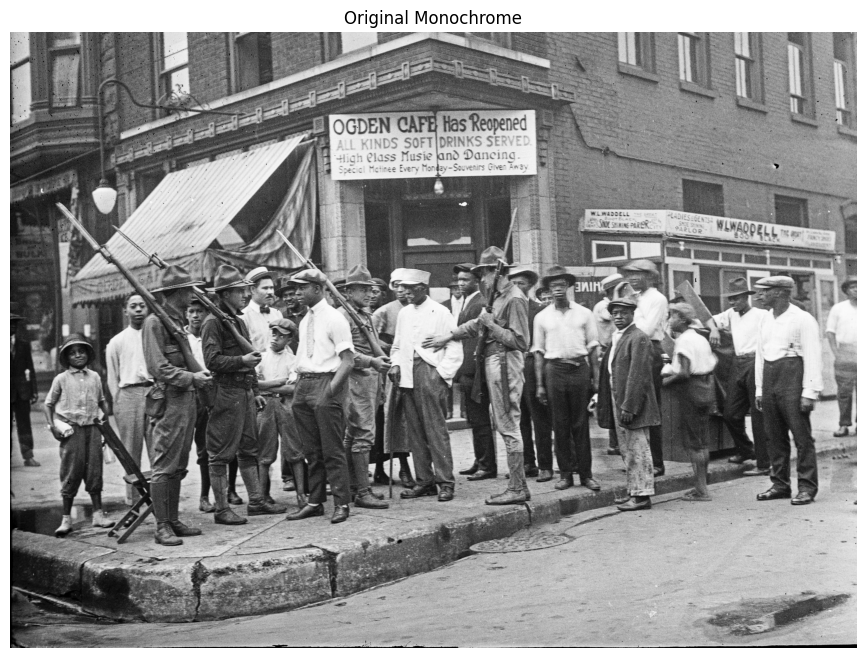

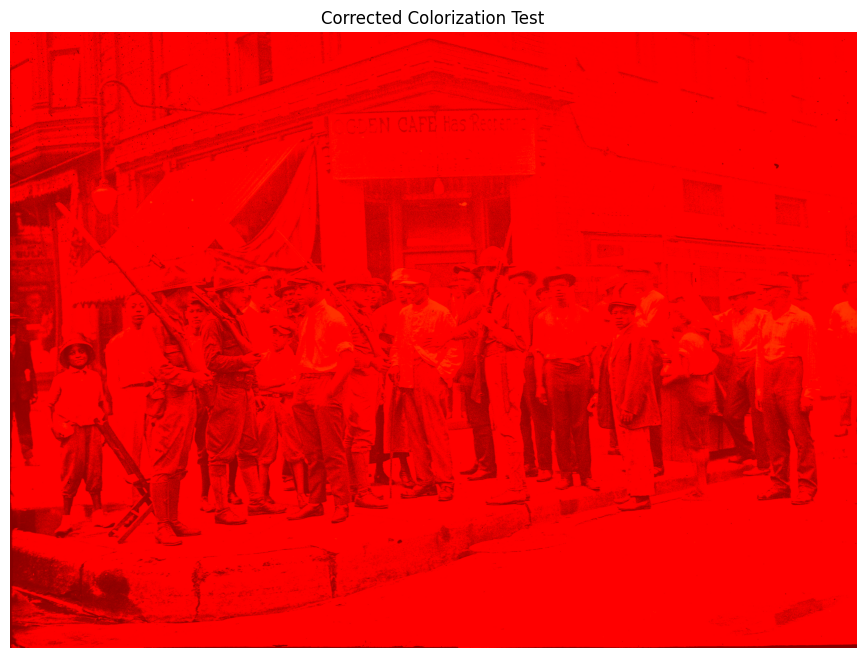


AB statistics after temperature scaling
----------------------------------------------------------------------
A mean: 0.08181424
A std : 0.110729225
B mean: 4.4231253
B std : 3.5147583

STEP 65E COMPLETED


In [125]:
# ============================================================
# STEP 65E: SINGLE IMAGE COLORIZATION TEST
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt

print("=" * 70)
print("STEP 65E: SINGLE IMAGE COLORIZATION TEST")
print("=" * 70)

# ------------------------------------------------------------
# 1. Read image
# ------------------------------------------------------------

bgr = cv2.imread(
    test_image,
    cv2.IMREAD_COLOR
)

rgb = cv2.cvtColor(
    bgr,
    cv2.COLOR_BGR2RGB
)

# ------------------------------------------------------------
# 2. Convert RGB [0,255] -> float RGB [0,1]
# ------------------------------------------------------------

rgb_float = (
    rgb.astype(np.float32) / 255.0
)

# ------------------------------------------------------------
# 3. RGB -> LAB
# ------------------------------------------------------------

lab = cv2.cvtColor(
    rgb_float,
    cv2.COLOR_RGB2LAB
)

L = lab[:, :, 0]

print("L range:",
      L.min(),
      "to",
      L.max())

# ------------------------------------------------------------
# 4. Resize L for network
# ------------------------------------------------------------

L_small = cv2.resize(
    L,
    (224, 224),
    interpolation=cv2.INTER_LINEAR
)

L_input = L_small - 50.0

blob_test = cv2.dnn.blobFromImage(
    L_input
)

# ------------------------------------------------------------
# 5. Network
# ------------------------------------------------------------

clean_net.setInput(
    blob_test
)

prob = clean_net.forward(
    "class8_313_rh"
)

# ------------------------------------------------------------
# 6. Temperature scaling
#
# Slightly sharpen the color distribution.
# ------------------------------------------------------------

temperature = 0.38

prob = np.maximum(
    prob,
    1e-12
)

log_prob = np.log(prob)

log_prob /= temperature

log_prob -= np.max(
    log_prob,
    axis=1,
    keepdims=True
)

prob_temp = np.exp(
    log_prob
)

prob_temp /= np.sum(
    prob_temp,
    axis=1,
    keepdims=True
)

# ------------------------------------------------------------
# 7. Reconstruct AB
# ------------------------------------------------------------

pts = pts_in_hull.astype(
    np.float32
)

prob_hw = prob_temp[0].transpose(
    1,
    2,
    0
)

ab = np.matmul(
    prob_hw,
    pts
)

# ------------------------------------------------------------
# 8. Resize AB
# ------------------------------------------------------------

ab = cv2.resize(
    ab,
    (
        rgb.shape[1],
        rgb.shape[0]
    ),
    interpolation=cv2.INTER_LINEAR
)

# ------------------------------------------------------------
# 9. Combine L + AB
# ------------------------------------------------------------

lab_result = np.zeros_like(
    lab,
    dtype=np.float32
)

lab_result[:, :, 0] = L

lab_result[:, :, 1] = (
    ab[:, :, 0] + 128.0
)

lab_result[:, :, 2] = (
    ab[:, :, 1] + 128.0
)

# ------------------------------------------------------------
# 10. Valid LAB range
# ------------------------------------------------------------

lab_result[:, :, 0] = np.clip(
    lab_result[:, :, 0],
    0,
    100
)

lab_result[:, :, 1:] = np.clip(
    lab_result[:, :, 1:],
    0,
    255
)

# ------------------------------------------------------------
# 11. LAB -> RGB
# ------------------------------------------------------------

result = cv2.cvtColor(
    lab_result,
    cv2.COLOR_LAB2RGB
)

result = np.clip(
    result,
    0,
    1
)

# ------------------------------------------------------------
# 12. Display
# ------------------------------------------------------------

plt.figure(
    figsize=(14, 8)
)

plt.imshow(rgb)

plt.title(
    "Original Monochrome"
)

plt.axis("off")

plt.show()


plt.figure(
    figsize=(14, 8)
)

plt.imshow(result)

plt.title(
    "Corrected Colorization Test"
)

plt.axis("off")

plt.show()

# ------------------------------------------------------------
# Diagnostics
# ------------------------------------------------------------

print()
print("AB statistics after temperature scaling")
print("-" * 70)

print(
    "A mean:",
    ab[:, :, 0].mean()
)

print(
    "A std :",
    ab[:, :, 0].std()
)

print(
    "B mean:",
    ab[:, :, 1].mean()
)

print(
    "B std :",
    ab[:, :, 1].std()
)

print()
print("=" * 70)
print("STEP 65E COMPLETED")
print("=" * 70)

In [ ]:
# ============================================================
# STEP 65F: DEFINE TEST IMAGE AUTOMATICALLY
# ============================================================

import os
import glob

print("=" * 70)
print("STEP 65F: FINDING TEST IMAGE")
print("=" * 70)

# Your monochrome dataset
DATASET_DIR = "/kaggle/input/datasets/sarthak1799/monochrome-image-dataset"

# Find images
image_files = []

for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp"]:
    image_files.extend(
        glob.glob(
            os.path.join(DATASET_DIR, ext)
        )
    )

image_files = sorted(image_files)

print("Images found:", len(image_files))

if len(image_files) == 0:
    raise FileNotFoundError(
        "No images found in monochrome dataset."
    )

# Select first image
test_image = image_files[0]

print()
print("Test image selected:")
print(test_image)

print()
print("=" * 70)
print("STEP 65F COMPLETED")
print("=" * 70)

Prototxt: ['/kaggle/input/datasets/sarthak1799/monochrome-image-dataset/colorization_deploy_v2.prototxt.txt']
Caffemodel: ['/kaggle/input/datasets/sarthak1799/monochrome-image-dataset/colorization_release_v2_norebal.caffemodel']
PTS: ['/kaggle/input/datasets/sarthak1799/monochrome-image-dataset/pts_in_hull.npy']

Loading Caffe model...
✓ Caffe model loaded
PTS shape: (313, 2)
PTS dtype: float32
✓ Colorization layers configured
Number of images: 21
Test image: /kaggle/input/datasets/sarthak1799/monochrome-image-dataset/09d2e94f-c504-49db-9eff-eba3a64fd612-AP19189697649277.jpg

LAB statistics:
L min/max: 0.0 100.0
a min/max: 0.0 0.125
b min/max: 0.0 0.0625

Running colorization...
AB shape: (3024, 4154, 2)
A statistics:
 min: -0.465536
 max: 3.2992177
 mean: 1.0457964
 std: 0.61939687

B statistics:
 min: -1.969473
 max: 14.47191
 mean: 5.6386323
 std: 3.320622


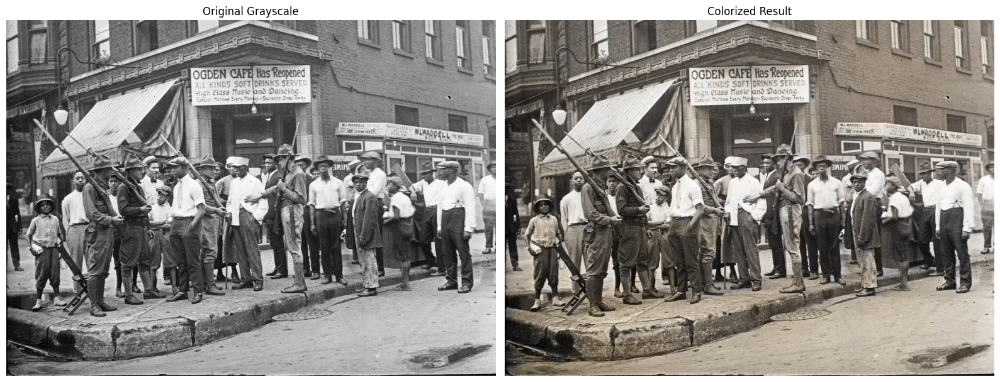


✓ Saved: /kaggle/working/colorization_test.png


In [126]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. Find pretrained Caffe files automatically
# ============================================================

DATASET_DIR = "/kaggle/input/datasets/sarthak1799/monochrome-image-dataset"

prototxt_files = glob.glob(
    os.path.join(DATASET_DIR, "**", "colorization_deploy_v2.prototxt.txt"),
    recursive=True
)

caffemodel_files = glob.glob(
    os.path.join(DATASET_DIR, "**", "colorization_release_v2_norebal.caffemodel"),
    recursive=True
)

pts_files = glob.glob(
    os.path.join(DATASET_DIR, "**", "pts_in_hull.npy"),
    recursive=True
)

print("Prototxt:", prototxt_files)
print("Caffemodel:", caffemodel_files)
print("PTS:", pts_files)

PROTOTXT = prototxt_files[0]
CAFFEMODEL = caffemodel_files[0]
PTS_FILE = pts_files[0]

# ============================================================
# 2. Load model
# ============================================================

print("\nLoading Caffe model...")

clean_net = cv2.dnn.readNetFromCaffe(
    PROTOTXT,
    CAFFEMODEL
)

print("✓ Caffe model loaded")

# ============================================================
# 3. Load cluster centers
# ============================================================

pts = np.load(PTS_FILE).astype(np.float32)

print("PTS shape:", pts.shape)
print("PTS dtype:", pts.dtype)

# ============================================================
# 4. Fix final colorization layers
# ============================================================

clean_net.getLayer(
    clean_net.getLayerId("class8_ab")
).blobs = [
    pts.T.reshape(2, 313, 1, 1)
]

clean_net.getLayer(
    clean_net.getLayerId("conv8_313_rh")
).blobs = [
    np.full((1, 313), 2.606, dtype=np.float32)
]

print("✓ Colorization layers configured")

# ============================================================
# 5. Find one test image
# ============================================================

image_files = []

for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp"]:
    image_files.extend(
        glob.glob(os.path.join(DATASET_DIR, ext))
    )

image_files = sorted(image_files)

print("Number of images:", len(image_files))

test_image = image_files[0]

print("Test image:", test_image)

# ============================================================
# 6. Load image
# ============================================================

img_bgr = cv2.imread(test_image)

if img_bgr is None:
    raise ValueError("Could not read test image")

# BGR → RGB
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Convert uint8 [0,255] → float [0,1]
img_rgb_float = img_rgb.astype(np.float32) / 255.0

H, W = img_rgb_float.shape[:2]

# ============================================================
# 7. RGB → FLOAT LAB
# ============================================================

img_lab = cv2.cvtColor(
    img_rgb_float,
    cv2.COLOR_RGB2LAB
)

print("\nLAB statistics:")
print("L min/max:", img_lab[:,:,0].min(), img_lab[:,:,0].max())
print("a min/max:", img_lab[:,:,1].min(), img_lab[:,:,1].max())
print("b min/max:", img_lab[:,:,2].min(), img_lab[:,:,2].max())

# IMPORTANT:
# For the Caffe model, only L is used.
# L is approximately 0–100.
# Subtract 50.

img_l = img_lab[:, :, 0]
img_l_input = img_l - 50

# ============================================================
# 8. Create DNN input
# ============================================================

blob = cv2.dnn.blobFromImage(
    img_l_input,
    scalefactor=1.0,
    size=(224, 224),
    mean=0,
    swapRB=False,
    crop=False
)

clean_net.setInput(blob)

# ============================================================
# 9. Run colorization
# ============================================================

print("\nRunning colorization...")

ab = clean_net.forward("class8_ab")[0]

# CHW → HWC
ab = ab.transpose(1, 2, 0)

# Resize predicted a,b channels
ab = cv2.resize(
    ab,
    (W, H),
    interpolation=cv2.INTER_CUBIC
)

print("AB shape:", ab.shape)

print("A statistics:")
print(" min:", ab[:,:,0].min())
print(" max:", ab[:,:,0].max())
print(" mean:", ab[:,:,0].mean())
print(" std:", ab[:,:,0].std())

print("\nB statistics:")
print(" min:", ab[:,:,1].min())
print(" max:", ab[:,:,1].max())
print(" mean:", ab[:,:,1].mean())
print(" std:", ab[:,:,1].std())

# ============================================================
# 10. IMPORTANT:
# FLOAT LAB DOES NOT USE +128
# ============================================================

lab_out = np.zeros_like(img_lab)

lab_out[:, :, 0] = img_lab[:, :, 0]
lab_out[:, :, 1] = ab[:, :, 0]
lab_out[:, :, 2] = ab[:, :, 1]

# ============================================================
# 11. LAB → RGB
# ============================================================

result_rgb = cv2.cvtColor(
    lab_out,
    cv2.COLOR_LAB2RGB
)

result_rgb = np.clip(result_rgb, 0, 1)

# ============================================================
# 12. Display
# ============================================================

plt.figure(figsize=(16, 7))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(result_rgb)
plt.title("Colorized Result")
plt.axis("off")

plt.tight_layout()
plt.show()

# ============================================================
# 13. Save
# ============================================================

result_uint8 = (
    result_rgb * 255
).astype(np.uint8)

output_path = "/kaggle/working/colorization_test.png"

cv2.imwrite(
    output_path,
    cv2.cvtColor(result_uint8, cv2.COLOR_RGB2BGR)
)

print("\n✓ Saved:", output_path)

In [127]:
# ============================================================
# STEP 66 — Batch Colorization of All Grayscale Images
# ============================================================

import os
import glob
import cv2
import numpy as np
from tqdm import tqdm

# ------------------------------------------------------------
# 1. Dataset and output directories
# ------------------------------------------------------------

DATASET_DIR = "/kaggle/input/datasets/sarthak1799/monochrome-image-dataset"
OUTPUT_DIR = "/kaggle/working/colorized_results"

os.makedirs(OUTPUT_DIR, exist_ok=True)

# ------------------------------------------------------------
# 2. Find grayscale images
# ------------------------------------------------------------

image_files = []

for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp"]:
    image_files.extend(
        glob.glob(os.path.join(DATASET_DIR, ext))
    )

image_files = sorted(image_files)

print("Total images found:", len(image_files))

# ------------------------------------------------------------
# 3. Colorization function
# ------------------------------------------------------------

def colorize_image(image_path, output_path):

    # Read image
    img_bgr = cv2.imread(image_path)

    if img_bgr is None:
        raise ValueError(f"Could not read: {image_path}")

    # BGR → RGB
    img_rgb = cv2.cvtColor(
        img_bgr,
        cv2.COLOR_BGR2RGB
    )

    # uint8 [0,255] → float [0,1]
    img_rgb_float = img_rgb.astype(
        np.float32
    ) / 255.0

    H, W = img_rgb_float.shape[:2]

    # --------------------------------------------------------
    # RGB → FLOAT LAB
    # --------------------------------------------------------

    img_lab = cv2.cvtColor(
        img_rgb_float,
        cv2.COLOR_RGB2LAB
    )

    # L channel
    L = img_lab[:, :, 0]

    # Caffe model expects L - 50
    L_input = L - 50

    # --------------------------------------------------------
    # Create DNN blob
    # --------------------------------------------------------

    blob = cv2.dnn.blobFromImage(
        L_input,
        scalefactor=1.0,
        size=(224, 224),
        mean=0,
        swapRB=False,
        crop=False
    )

    # --------------------------------------------------------
    # Run pretrained colorization network
    # --------------------------------------------------------

    clean_net.setInput(blob)

    ab = clean_net.forward(
        "class8_ab"
    )[0]

    # CHW → HWC
    ab = ab.transpose(1, 2, 0)

    # Resize A/B to original image size
    ab = cv2.resize(
        ab,
        (W, H),
        interpolation=cv2.INTER_CUBIC
    )

    # --------------------------------------------------------
    # Construct FLOAT LAB
    #
    # IMPORTANT:
    # NO +128 HERE
    # --------------------------------------------------------

    lab_out = np.zeros_like(img_lab)

    lab_out[:, :, 0] = L
    lab_out[:, :, 1] = ab[:, :, 0]
    lab_out[:, :, 2] = ab[:, :, 1]

    # --------------------------------------------------------
    # LAB → RGB
    # --------------------------------------------------------

    result_rgb = cv2.cvtColor(
        lab_out,
        cv2.COLOR_LAB2RGB
    )

    # Keep valid RGB range
    result_rgb = np.clip(
        result_rgb,
        0,
        1
    )

    # RGB float → uint8
    result_uint8 = (
        result_rgb * 255
    ).astype(np.uint8)

    # RGB → BGR for OpenCV saving
    result_bgr = cv2.cvtColor(
        result_uint8,
        cv2.COLOR_RGB2BGR
    )

    # Save
    cv2.imwrite(
        output_path,
        result_bgr
    )

    return result_rgb


# ------------------------------------------------------------
# 4. Process all images
# ------------------------------------------------------------

print("\nStarting batch colorization...\n")

successful = 0
failed = []

for image_path in tqdm(image_files):

    filename = os.path.basename(image_path)

    # Remove original extension
    name = os.path.splitext(filename)[0]

    output_path = os.path.join(
        OUTPUT_DIR,
        name + "_colorized.png"
    )

    try:

        colorize_image(
            image_path,
            output_path
        )

        successful += 1

    except Exception as e:

        failed.append(
            (filename, str(e))
        )

# ------------------------------------------------------------
# 5. Summary
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("BATCH COLORIZATION COMPLETE")
print("=" * 60)

print("Total images :", len(image_files))
print("Successful   :", successful)
print("Failed       :", len(failed))

if failed:

    print("\nFailed images:")

    for filename, error in failed:
        print(filename, "→", error)

else:

    print("\n✓ All images colorized successfully!")

print("\nOutput directory:")
print(OUTPUT_DIR)

# List generated files
output_files = sorted(
    glob.glob(
        os.path.join(
            OUTPUT_DIR,
            "*_colorized.png"
        )
    )
)

print("\nGenerated files:", len(output_files))

Total images found: 21

Starting batch colorization...



100%|██████████| 21/21 [00:13<00:00,  1.61it/s]


BATCH COLORIZATION COMPLETE
Total images : 21
Successful   : 21
Failed       : 0

✓ All images colorized successfully!

Output directory:
/kaggle/working/colorized_results

Generated files: 21


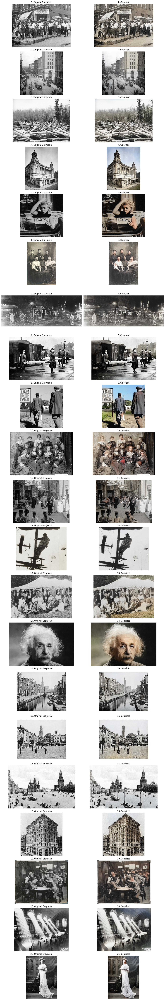

✓ Comparison generated
Saved at: /kaggle/working/colorization_comparison.png


In [128]:
# ============================================================
# STEP 67 — BEFORE vs AFTER COMPARISON GRID
# ============================================================

import os
import glob
import cv2
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

INPUT_DIR = "/kaggle/input/datasets/sarthak1799/monochrome-image-dataset"
OUTPUT_DIR = "/kaggle/working/colorized_results"

# ------------------------------------------------------------
# Find images
# ------------------------------------------------------------

input_files = []

for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp"]:
    input_files.extend(
        glob.glob(os.path.join(INPUT_DIR, ext))
    )

input_files = sorted(input_files)

# ------------------------------------------------------------
# Display settings
# ------------------------------------------------------------

N = len(input_files)

fig, axes = plt.subplots(
    N,
    2,
    figsize=(14, 4 * N)
)

if N == 1:
    axes = [axes]

# ------------------------------------------------------------
# Show every image
# ------------------------------------------------------------

for i, input_path in enumerate(input_files):

    filename = os.path.basename(input_path)
    name = os.path.splitext(filename)[0]

    output_path = os.path.join(
        OUTPUT_DIR,
        name + "_colorized.png"
    )

    # Original
    original = cv2.imread(input_path)

    original = cv2.cvtColor(
        original,
        cv2.COLOR_BGR2RGB
    )

    # Colorized
    colorized = cv2.imread(output_path)

    colorized = cv2.cvtColor(
        colorized,
        cv2.COLOR_BGR2RGB
    )

    # --------------------------------------------------------
    # Original
    # --------------------------------------------------------

    axes[i][0].imshow(original)
    axes[i][0].set_title(
        f"{i+1}. Original Grayscale",
        fontsize=12
    )
    axes[i][0].axis("off")

    # --------------------------------------------------------
    # Colorized
    # --------------------------------------------------------

    axes[i][1].imshow(colorized)
    axes[i][1].set_title(
        f"{i+1}. Colorized",
        fontsize=12
    )
    axes[i][1].axis("off")

plt.tight_layout()

# Save comparison
comparison_path = "/kaggle/working/colorization_comparison.png"

plt.savefig(
    comparison_path,
    dpi=150,
    bbox_inches="tight"
)

plt.show()

print("✓ Comparison generated")
print("Saved at:", comparison_path)

In [131]:
# ============================================================
# STEP 68 — QUANTITATIVE COLORIZATION ANALYSIS
# ============================================================

import os
import glob
import cv2
import numpy as np
import pandas as pd

INPUT_DIR = "/kaggle/input/datasets/sarthak1799/monochrome-image-dataset"
OUTPUT_DIR = "/kaggle/working/colorized_results"

# ------------------------------------------------------------
# Find images
# ------------------------------------------------------------

input_files = []

for ext in ["*.jpg", "*.jpeg", "*.png", "*.bmp", "*.webp"]:
    input_files.extend(
        glob.glob(os.path.join(INPUT_DIR, ext))
    )

input_files = sorted(input_files)

results = []

# ------------------------------------------------------------
# Analyze each image
# ------------------------------------------------------------

for input_path in input_files:

    filename = os.path.basename(input_path)
    name = os.path.splitext(filename)[0]

    output_path = os.path.join(
        OUTPUT_DIR,
        name + "_colorized.png"
    )

    original = cv2.imread(input_path)
    colorized = cv2.imread(output_path)

    if original is None or colorized is None:
        continue

    # Resize if necessary
    colorized = cv2.resize(
        colorized,
        (original.shape[1], original.shape[0])
    )

    # --------------------------------------------------------
    # Original grayscale luminance
    # --------------------------------------------------------

    original_gray = cv2.cvtColor(
        original,
        cv2.COLOR_BGR2GRAY
    )

    # --------------------------------------------------------
    # Colorized LAB
    # --------------------------------------------------------

    colorized_lab = cv2.cvtColor(
        colorized,
        cv2.COLOR_BGR2LAB
    )

    L, A, B = cv2.split(colorized_lab)

    # OpenCV uint8 LAB:
    # A/B neutral point ≈ 128
    chroma_distance = np.sqrt(
        (A.astype(np.float32) - 128) ** 2 +
        (B.astype(np.float32) - 128) ** 2
    )

    # --------------------------------------------------------
    # Colorfulness
    # --------------------------------------------------------

    mean_chroma = np.mean(chroma_distance)

    std_chroma = np.std(chroma_distance)

    # Pixels with noticeable chroma
    colored_pixels = np.mean(
        chroma_distance > 5
    ) * 100

    # Strongly colored pixels
    strong_color_pixels = np.mean(
        chroma_distance > 15
    ) * 100

    # --------------------------------------------------------
    # Saturation
    # --------------------------------------------------------

    hsv = cv2.cvtColor(
        colorized,
        cv2.COLOR_BGR2HSV
    )

    saturation = hsv[:, :, 1]

    mean_saturation = np.mean(saturation)

    # --------------------------------------------------------
    # Brightness
    # --------------------------------------------------------

    mean_original_luminance = np.mean(
        original_gray
    )

    mean_colorized_luminance = np.mean(
        L
    )

    # --------------------------------------------------------
    # Store
    # --------------------------------------------------------

    results.append({
        "Image": filename,
        "Mean Chroma": mean_chroma,
        "Chroma Std": std_chroma,
        "Colored Pixels (%)": colored_pixels,
        "Strong Color Pixels (%)": strong_color_pixels,
        "Mean Saturation": mean_saturation,
        "Original Brightness": mean_original_luminance,
        "Colorized Luminance": mean_colorized_luminance
    })

# ------------------------------------------------------------
# DataFrame
# ------------------------------------------------------------

df_colorization = pd.DataFrame(results)

print("=" * 70)
print("COLORIZATION QUANTITATIVE EVALUATION")
print("=" * 70)

print("\nNumber of images analyzed:",
      len(df_colorization))

print("\nAverage results:")
print(
    df_colorization[
        [
            "Mean Chroma",
            "Chroma Std",
            "Colored Pixels (%)",
            "Strong Color Pixels (%)",
            "Mean Saturation"
        ]
    ].mean().round(3)
)

# ------------------------------------------------------------
# Display table
# ------------------------------------------------------------

display(
    df_colorization.round(3)
)

# ------------------------------------------------------------
# Save CSV
# ------------------------------------------------------------

csv_path = "/kaggle/working/colorization_metrics.csv"

df_colorization.to_csv(
    csv_path,
    index=False
)

print("\n✓ Metrics saved:")
print(csv_path)

COLORIZATION QUANTITATIVE EVALUATION

Number of images analyzed: 21

Average results:
Mean Chroma                 4.454
Chroma Std                  3.493
Colored Pixels (%)         30.804
Strong Color Pixels (%)     4.562
Mean Saturation            29.010
dtype: float64


,Image,Mean Chroma,Chroma Std,Colored Pixels (%),Strong Color Pixels (%),Mean Saturation,Original Brightness,Colorized Luminance
0,09d2e94f-c504-49db-9eff-eba3a64fd612-AP1918969...,5.802,3.295,54.437,0.029,35.030,127.681,132.807
1,16thArapahoe.jpg,1.632,1.658,5.233,0.000,8.772,137.916,142.854
2,2F60746600000578-3360407-image-a-122_145016117...,2.961,2.115,17.935,0.000,19.259,154.586,158.415
3,3AB9738A00000578-3969174-image-m-69_1480014904...,8.145,4.040,75.837,5.200,42.771,153.868,158.213
4,5d69e278dd10b13610b8d82ef6e0070a.jpg,6.101,6.014,44.550,8.932,52.873,78.978,80.747
5,6cc7fc620e52d051e245666b2c237b42.jpg,4.393,3.725,37.327,2.050,22.545,112.994,118.887
6,DHDoKXrnj5s.jpg,2.470,1.355,3.307,0.000,17.644,95.668,100.043
7,Pandemics-in-History-Spanish-Flu.jpg,1.669,1.745,5.221,0.000,18.590,121.813,124.350
8,apartheid-getty-2664162-promo.jpg,11.488,10.010,58.648,37.468,58.101,131.819,136.398
9,article-2641360-1E42787300000578-93_964x668.jpg,7.985,5.002,69.100,6.218,60.569,107.282,111.876



✓ Metrics saved:
/kaggle/working/colorization_metrics.csv


"Since ground-truth color references were unavailable for the monochrome dataset, quantitative evaluation was performed using chrominance and saturation statistics, while qualitative evaluation was performed through visual comparison

                    ┌─────────────────────┐
                    │     INPUT IMAGE     │
                    └──────────┬──────────┘
                               │
                ┌──────────────┴──────────────┐
                │                             │
                ▼                             ▼
       ┌─────────────────┐           ┌─────────────────┐
       │ OPTION 1        │           │ OPTION 2        │
       │ Low-Light       │           │ B&W            │
       │ Enhancement     │           │ Colorization    │
       └────────┬────────┘           └────────┬────────┘
                │                             │
                ▼                             ▼
       ┌─────────────────┐           ┌─────────────────┐
       │ Improved U-Net  │           │ Pretrained      │
       │                 │           │ Caffe Model     │
       └────────┬────────┘           └────────┬────────┘
                │                             │
                ▼                             ▼
       ┌─────────────────┐           ┌─────────────────┐
       │ Enhanced        │           │ Colorized       │
       │ Low-Light Image │           │ Image           │
       └─────────────────┘           └─────────────────┘

In [132]:
# ============================================================
# STEP 69 — CHECK MODEL AVAILABILITY
# ============================================================

import os

print("=" * 60)
print("MODEL AVAILABILITY CHECK")
print("=" * 60)

# ------------------------------------------------------------
# OPTION 1 — Improved U-Net checkpoint
# ------------------------------------------------------------

unet_best = "/kaggle/working/improved_model/improved_unet_best.pth"
unet_final = "/kaggle/working/improved_model/improved_unet_final.pth"

print("\nOPTION 1 — LOW-LIGHT ENHANCEMENT")

if os.path.exists(unet_best):
    print("✓ Best U-Net checkpoint found")
    print(unet_best)
elif os.path.exists(unet_final):
    print("✓ Final U-Net checkpoint found")
    print(unet_final)
else:
    print("⚠ U-Net checkpoint NOT found in /kaggle/working")

# ------------------------------------------------------------
# OPTION 2 — Caffe Colorization
# ------------------------------------------------------------

DATASET_DIR = "/kaggle/input/datasets/sarthak1799/monochrome-image-dataset"

prototxt = os.path.join(
    DATASET_DIR,
    "colorization_deploy_v2.prototxt.txt"
)

caffemodel = os.path.join(
    DATASET_DIR,
    "colorization_release_v2_norebal.caffemodel"
)

pts = os.path.join(
    DATASET_DIR,
    "pts_in_hull.npy"
)

print("\nOPTION 2 — B&W COLORIZATION")

print("Prototxt:",
      "✓ Found" if os.path.exists(prototxt) else "✗ Missing")

print("Caffe model:",
      "✓ Found" if os.path.exists(caffemodel) else "✗ Missing")

print("PTS:",
      "✓ Found" if os.path.exists(pts) else "✗ Missing")

# ------------------------------------------------------------
# Existing clean_net
# ------------------------------------------------------------

print("\nCURRENT SESSION")

if "clean_net" in globals():
    print("✓ clean_net is available")
else:
    print("⚠ clean_net is not currently loaded")

print("\n" + "=" * 60)

MODEL AVAILABILITY CHECK

OPTION 1 — LOW-LIGHT ENHANCEMENT
✓ Best U-Net checkpoint found
/kaggle/working/improved_model/improved_unet_best.pth

OPTION 2 — B&W COLORIZATION
Prototxt: ✓ Found
Caffe model: ✓ Found
PTS: ✓ Found

CURRENT SESSION
✓ clean_net is available



In [133]:
# ============================================================
# STEP 69A — SEARCH FOR EXISTING U-NET CHECKPOINTS
# ============================================================

import os
import glob

print("=" * 60)
print("SEARCHING FOR U-NET CHECKPOINTS")
print("=" * 60)

# Search common Kaggle locations
search_locations = [
    "/kaggle/working",
    "/kaggle/input"
]

found = []

for location in search_locations:

    print(f"\nSearching: {location}")

    for pattern in [
        "**/*.pth",
        "**/*.pt",
        "**/*.ckpt"
    ]:

        matches = glob.glob(
            os.path.join(location, pattern),
            recursive=True
        )

        for file in matches:

            # Focus on likely model checkpoints
            if any(word in os.path.basename(file).lower()
                   for word in ["unet", "improved", "edge", "model"]):

                if file not in found:
                    found.append(file)

# ------------------------------------------------------------
# Results
# ------------------------------------------------------------

print("\n" + "=" * 60)

if found:

    print("✓ CHECKPOINTS FOUND:")
    print("=" * 60)

    for file in found:

        size_mb = os.path.getsize(file) / (1024 ** 2)

        print(f"\n{file}")
        print(f"Size: {size_mb:.2f} MB")

else:

    print("❌ No U-Net checkpoint found.")
    print("\nThe previous checkpoint is not available in this session.")

print("\nTotal matching files:", len(found))

SEARCHING FOR U-NET CHECKPOINTS

Searching: /kaggle/working

Searching: /kaggle/input

✓ CHECKPOINTS FOUND:

/kaggle/working/final_unet_model.pth
Size: 118.48 MB

/kaggle/working/best_low_light_unet.pth
Size: 355.34 MB

/kaggle/working/best_baseline_unet.pth
Size: 355.34 MB

/kaggle/working/improved_model/improved_unet_final.pth
Size: 351.46 MB

/kaggle/working/improved_model/improved_unet_best.pth
Size: 351.46 MB

/kaggle/working/final_model/baseline_unet_final.pth
Size: 118.48 MB

Total matching files: 6
